# UR3 CobotOps Automation Analysis 

- Robotics/automation: Working with robotics and automation creates workflow efficiencies. 
    - To get the most out of your robotic system and optimise planning, you must understand its operation and mitigate for issues.
- Dataset: UR3 CobotOps Dataset - time-series data from the UR3 cobot (collaborative robot)
    - offers insights into operational parameters and faults.
    - Currents, speeds across joints (J0-J5), gripper/tool current, operation cycle count, protective stops, and grip losses 
        - all features continuous except cycle, grip lost and protective stop 
        - data dictionary ref: https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/Cobot_data_dictionary.pdf 
    - Ref: M. Tyrovolas, K. Aliev, D. Antonelli, and C. Stylios. "UR3 CobotOps," UCI Machine Learning Repository, 2024. [Online]. Available: https://doi.org/10.24432/C5J891.
    - Dataset author description: The UR3 CobotOps Dataset is an essential collection of multi-dimensional time-series data from the UR3 cobot, offering insights into operational parameters and faults for machine learning in robotics and automation. It features electrical currents, Currents, speeds across joints (J0-J5), gripper current, operation cycle count, protective stops, and grip losses, collected via MODBUS and RTDE protocols. This dataset supports research in fault detection, predictive maintenance, and operational optimization, providing a detailed operational snapshot of a leading cobot model for industrial applications
- Objective: Explore data and investigate feasibility of error prediction

# 1 Modules and Libraries



# 1.1 Install modules to load excel and Autogluon


In [2]:
# to enable load of excel file
%pip install openpyxl

In [3]:
%pip install autogluon

Note: you may need to restart the kernel to use updated packages.


# 1.2 Import libraries

In [4]:
## import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#import tensorflow as tf
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder, LabelEncoder, MinMaxScaler, RobustScaler
from sklearn.model_selection import cross_val_score, train_test_split, KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn import metrics, svm
#from sklearn.tree import DecisionTreeClassifier
#from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, precision_score, recall_score, confusion_matrix, f1_score, make_scorer
from sklearn.neighbors import KNeighborsClassifier as KNN
#from sklearn.svm import SVC
#from sklearn.ensemble import VotingClassifier
#import keras
import warnings
import datetime 
from datetime import datetime, time, timedelta
from autogluon.timeseries import TimeSeriesDataFrame, TimeSeriesPredictor
from autogluon.tabular import TabularDataset, TabularPredictor


# serialise to make computer readable file 
import pickle
import joblib

# 2 Exploratory Data Analysis
# 2.1.1 Initial exploration

In [5]:
## load the dataset
dataset = pd.read_excel('cobot_dataset_02052023.xlsx')
dataset.head().T

,0,1,2,3,4
Num,1,2,3,4,5
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414
Temperature_T0,27.875,27.875,27.875,27.875,27.875
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875


In [6]:
## looking into the info of the dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Num                   7409 non-null   int64  
 1   Timestamp             7409 non-null   object 
 2   Current_J0            7363 non-null   float64
 3   Temperature_T0        7355 non-null   float64
 4   Current_J1            7355 non-null   float64
 5   Temperature_J1        7355 non-null   float64
 6   Current_J2            7355 non-null   float64
 7   Temperature_J2        7355 non-null   float64
 8   Current_J3            7355 non-null   float64
 9   Temperature_J3        7355 non-null   float64
 10  Current_J4            7355 non-null   float64
 11  Temperature_J4        7355 non-null   float64
 12  Current_J5            7355 non-null   float64
 13  Temperature_J5        7355 non-null   float64
 14  Speed_J0              7355 non-null   float64
 15  Speed_J1             

In [7]:
# check for duplicate rows
duplic_check = dataset.drop_duplicates()
duplic_check.info()
# same row number as main data set - no duplicates 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Num                   7409 non-null   int64  
 1   Timestamp             7409 non-null   object 
 2   Current_J0            7363 non-null   float64
 3   Temperature_T0        7355 non-null   float64
 4   Current_J1            7355 non-null   float64
 5   Temperature_J1        7355 non-null   float64
 6   Current_J2            7355 non-null   float64
 7   Temperature_J2        7355 non-null   float64
 8   Current_J3            7355 non-null   float64
 9   Temperature_J3        7355 non-null   float64
 10  Current_J4            7355 non-null   float64
 11  Temperature_J4        7355 non-null   float64
 12  Current_J5            7355 non-null   float64
 13  Temperature_J5        7355 non-null   float64
 14  Speed_J0              7355 non-null   float64
 15  Speed_J1             

In [8]:
## view some statistical details
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Num,7409.0,3705.000000,2138.938405,1.000000,1853.000000,3705.000000,5557.000000,7409.000000
Current_J0,7363.0,-0.048934,0.829395,-6.247756,-0.195026,-0.080830,0.095959,6.806938
Temperature_T0,7355.0,34.906781,2.762057,27.812500,33.000000,36.500000,37.062500,37.250000
Current_J1,7355.0,-2.297936,0.800450,-5.808734,-2.664919,-2.236342,-1.778334,1.083596
Temperature_J1,7355.0,37.659636,3.247315,29.312500,35.375000,39.687500,40.125000,40.500000
Current_J2,7355.0,-1.199381,0.609984,-4.171966,-1.552803,-1.077137,-0.838721,2.464940
Temperature_J2,7355.0,38.064064,3.311948,29.375000,35.750000,40.187500,40.437500,40.937500
Current_J3,7355.0,-0.605312,0.514937,-3.333102,-0.830933,-0.571190,-0.388398,2.270268
Temperature_J3,7355.0,40.936999,3.182399,32.125000,38.937500,43.062500,43.125000,43.437500
Current_J4,7355.0,-0.022968,0.630789,-4.738406,-0.125809,-0.012325,0.086098,4.089389


In [9]:
# value counts if datatype is a string
for i in dataset:
    data_type = dataset[i].dtype
    if data_type == "object" or data_type == "bool":
        value_count = dataset[i].value_counts()
        print("\n",value_count)


 Timestamp
2022-10-26T08:17:21.847Z      1
"2022-10-26T14:54:48.592Z"    1
"2022-10-26T14:54:46.583Z"    1
"2022-10-26T14:54:45.576Z"    1
"2022-10-26T14:54:44.568Z"    1
                             ..
2022-10-26T08:59:32.230Z      1
2022-10-26T08:59:31.227Z      1
2022-10-26T08:59:30.219Z      1
2022-10-26T08:59:28.198Z      1
2022-10-26T15:36:06.580Z      1
Name: count, Length: 7409, dtype: int64

 grip_lost
False    7166
True      243
Name: count, dtype: int64


In [10]:
# Create a table of null data to review

# Filter rows with any NaN values

df_with_nulls = dataset[dataset.isnull().any(axis=1)]

# show table
df_with_nulls.T



,813,947,976,1046,1315,2089,2237,2316,2392,2668,...,6818,6936,6992,7039,7090,7136,7187,7249,7305,7365
Num,814,948,977,1047,1316,2090,2238,2317,2393,2669,...,6819,6937,6993,7040,7091,7137,7188,7250,7306,7366
Timestamp,2022-10-26T08:31:00.829Z,2022-10-26T08:33:15.550Z,2022-10-26T08:33:44.702Z,2022-10-26T08:34:55.110Z,2022-10-26T08:40:05.795Z,"""2022-10-26T08:53:11.129Z""","""2022-10-26T08:55:40.880Z""",2022-10-26T08:57:00.305Z,2022-10-26T08:58:16.761Z,2022-10-26T09:02:56.217Z,...,2022-10-26T15:26:13.177Z,2022-10-26T15:28:11.890Z,2022-10-26T15:29:08.185Z,2022-10-26T15:29:55.437Z,2022-10-26T15:30:46.772Z,2022-10-26T15:31:33.017Z,2022-10-26T15:32:24.292Z,2022-10-26T15:33:26.639Z,2022-10-26T15:34:22.946Z,2022-10-26T15:35:23.322Z
Current_J0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_T0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current_J1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current_J2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current_J3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# value counts if datatype is a string
for i in df_with_nulls:
    value_count = df_with_nulls[i].value_counts()
    print("\n",value_count)

# mainly rows with just timestamp, cycle and false grip_lost values - most other data missing apart from 8 Current J0 values


 Num
814     1
6591    1
5778    1
5847    1
5905    1
5969    1
6037    1
6104    1
6292    1
6349    1
6413    1
6470    1
6528    1
6645    1
948     1
6697    1
6763    1
6819    1
6937    1
6993    1
7040    1
7091    1
7137    1
7188    1
7250    1
7306    1
5710    1
5648    1
5587    1
5465    1
977     1
1047    1
1316    1
2090    1
2238    1
2317    1
2393    1
2669    1
3392    1
3441    1
3490    1
3984    1
4106    1
4289    1
4459    1
4677    1
4699    1
4805    1
4822    1
4921    1
4993    1
5223    1
5344    1
7366    1
Name: count, dtype: int64

 Timestamp
2022-10-26T08:31:00.829Z      1
2022-10-26T15:22:23.810Z      1
2022-10-26T15:08:45.300Z      1
2022-10-26T15:09:54.726Z      1
2022-10-26T15:10:53.071Z      1
2022-10-26T15:11:57.412Z      1
2022-10-26T15:13:05.828Z      1
"2022-10-26T15:14:13.194Z"    1
2022-10-26T15:17:23.245Z      1
2022-10-26T15:18:20.521Z      1
2022-10-26T15:19:24.841Z      1
2022-10-26T15:20:22.134Z      1
2022-10-26T15:21:20.454Z      1


# 2.1.2 extract date
Issues with extracting date and time data. Next code cell # out so doesn't cause error but if run shows why had to replace "s to get output in following cell. 
- Despite extracting the first entry correctly to date column as 2022-10-26 when converted to datetime from a string, it changed it to "2022-10-2.

In [12]:
# #Example timestamp output 2022-10-26T15:36:06.580Z
# # read in dataset fresh 
# dataset = pd.read_excel('cobot_dataset_02052023.xlsx')

# dataset['date'] = dataset.Timestamp.str[:10]
# print(dataset.head(2).T)
# dataset['date'] = pd.to_datetime(dataset['date'])
# print(dataset.head(2).T)

In [13]:
#Example timestamp output 2022-10-26T15:36:06.580Z 
# read in dataset fresh 
dataset =  pd.read_excel('cobot_dataset_02052023.xlsx')
# rename cycle column, no apaces
dataset = dataset.rename(columns={'cycle ': 'cycle'})

# Function to clean and convert the timestamp
def clean_timestamp(ts):
    # had to add replace " as was adding to number although not visible
    ts = ts.replace('T', ' ').replace('Z', '').replace('"','')
    return pd.to_datetime(ts, format= '%Y-%m-%d %H:%M:%S.%f')
    

# Apply the function to the DataFrame
dataset['cleaned_timestamp'] = dataset['Timestamp'].apply(clean_timestamp)

# Print the result
print(dataset.head(2).T)

# Extract date and time
dataset['date'] = dataset['cleaned_timestamp'].dt.date
dataset['time'] = dataset['cleaned_timestamp'].dt.time

# Print the result
dataset.head().T

                                               0                           1
Num                                            1                           2
Timestamp               2022-10-26T08:17:21.847Z    2022-10-26T08:17:22.852Z
Current_J0                              0.109628                    0.595605
Temperature_T0                            27.875                      27.875
Current_J1                             -2.024669                   -2.278456
Temperature_J1                            29.375                     29.3125
Current_J2                             -1.531442                   -0.866556
Temperature_J2                            29.375                     29.4375
Current_J3                              -0.99857                   -0.206097
Temperature_J3                            32.125                     32.1875
Current_J4                              -0.06254                   -1.062762
Temperature_J4                             32.25                       32.25

,0,1,2,3,4
Num,1,2,3,4,5
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414
Temperature_T0,27.875,27.875,27.875,27.875,27.875
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875


In [14]:
# value counts if datatype is a string
for i in dataset:
    data_type = dataset[i].dtype
    if data_type == "object" or data_type == "bool":
        value_count = dataset[i].value_counts()
        print("\n",value_count)




 Timestamp
2022-10-26T08:17:21.847Z      1
"2022-10-26T14:54:48.592Z"    1
"2022-10-26T14:54:46.583Z"    1
"2022-10-26T14:54:45.576Z"    1
"2022-10-26T14:54:44.568Z"    1
                             ..
2022-10-26T08:59:32.230Z      1
2022-10-26T08:59:31.227Z      1
2022-10-26T08:59:30.219Z      1
2022-10-26T08:59:28.198Z      1
2022-10-26T15:36:06.580Z      1
Name: count, Length: 7409, dtype: int64

 grip_lost
False    7166
True      243
Name: count, dtype: int64

 date
2022-10-26    7409
Name: count, dtype: int64

 time
08:17:21.847000    1
14:54:48.592000    1
14:54:46.583000    1
14:54:45.576000    1
14:54:44.568000    1
                  ..
08:59:32.230000    1
08:59:31.227000    1
08:59:30.219000    1
08:59:28.198000    1
15:36:06.580000    1
Name: count, Length: 7409, dtype: int64


# 2.1.3 Encoding features

In [15]:
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode each column
dataset["grip_lost_enc"] = label_encoder.fit_transform(dataset["grip_lost"])

# save the LabelEncoder to a file to transform new data
joblib.dump(label_encoder, f'label_encoder_grip_lost.joblib')

# print encoded category information
le_name_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
# don't print np-float64
np.set_printoptions(legacy='1.21')
print("Encoded Labels ","grip_lost_enc",":", le_name_mapping)

dataset.T

Encoded Labels  grip_lost_enc : {False: 0, True: 1}


,0,1,2,3,4,5,6,7,8,9,...,7399,7400,7401,7402,7403,7404,7405,7406,7407,7408
Num,1,2,3,4,5,6,7,8,9,10,...,7400,7401,7402,7403,7404,7405,7406,7407,7408,7409
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T15:35:57.524Z,2022-10-26T15:35:58.527Z,2022-10-26T15:35:59.529Z,2022-10-26T15:36:00.539Z,2022-10-26T15:36:01.549Z,2022-10-26T15:36:02.555Z,2022-10-26T15:36:03.562Z,2022-10-26T15:36:04.571Z,2022-10-26T15:36:05.572Z,2022-10-26T15:36:06.580Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.189909,-0.051396,-0.192624,-0.217085,-0.131406,-0.109017,-0.098536,-0.1211,-0.12937,-0.134429
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.125
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.495173,-2.849013,-2.526635,-2.628725,-2.367134,-2.261695,-2.251992,-2.280791,-2.269061,-2.244449
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,40.3125,40.3125,40.3125,40.25,40.3125,40.3125,40.3125,40.25,40.3125,40.3125
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.596931,-0.830781,-0.92836,-0.962782,-1.037989,-1.082678,-1.09442,-1.121319,-1.09161,-1.09895
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-1.573144,-0.387453,-0.356138,-0.399277,-0.470314,-0.494714,-0.515789,-0.502406,-0.491158,-0.502397
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,43.375,43.375,43.375,43.3125,43.3125,43.375,43.375,43.375,43.375,43.375


In [16]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Num                   7409 non-null   int64         
 1   Timestamp             7409 non-null   object        
 2   Current_J0            7363 non-null   float64       
 3   Temperature_T0        7355 non-null   float64       
 4   Current_J1            7355 non-null   float64       
 5   Temperature_J1        7355 non-null   float64       
 6   Current_J2            7355 non-null   float64       
 7   Temperature_J2        7355 non-null   float64       
 8   Current_J3            7355 non-null   float64       
 9   Temperature_J3        7355 non-null   float64       
 10  Current_J4            7355 non-null   float64       
 11  Temperature_J4        7355 non-null   float64       
 12  Current_J5            7355 non-null   float64       
 13  Temperature_J5    

# 2.1.4 Initial visualisation

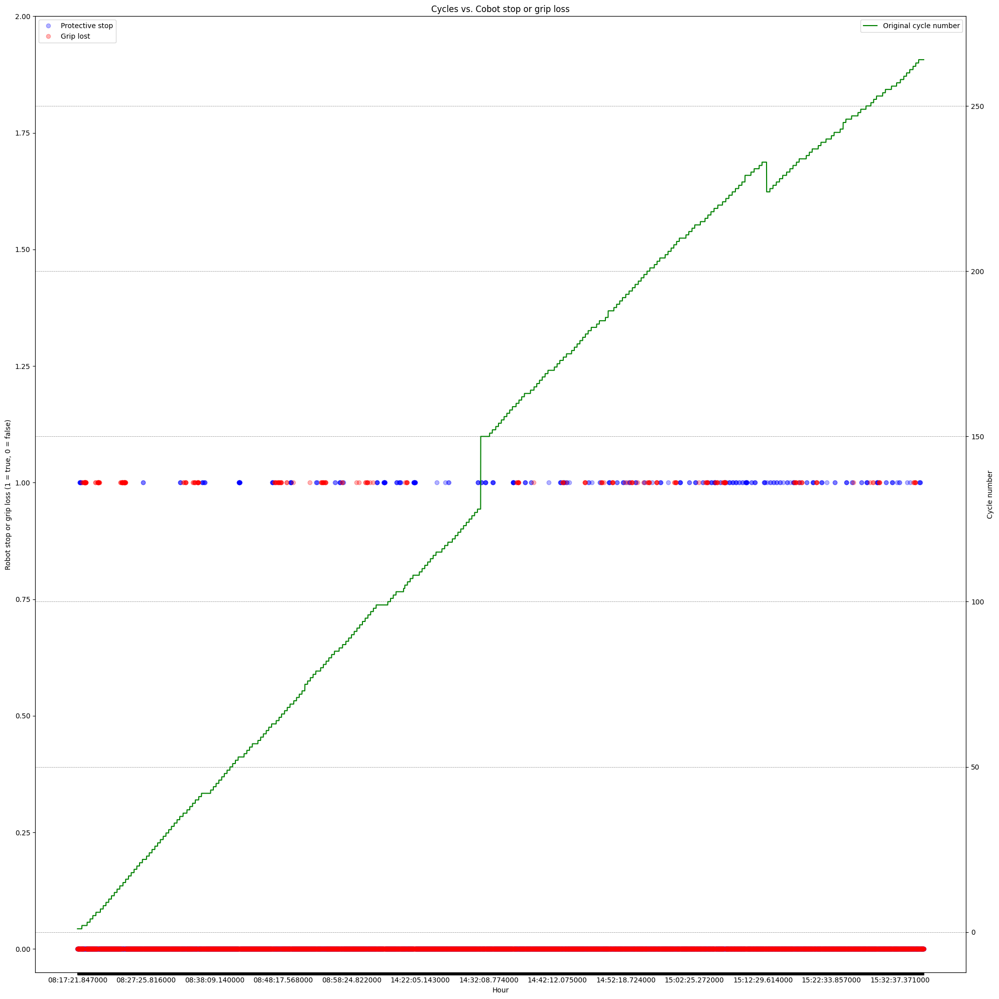

In [17]:
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(20,20))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.plot(dataset["time_str"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Hour')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.set_ylim(top=2)
# Plot the first scatter plot
ax1.plot(dataset["time_str"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="upper left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(dataset["time_str"], dataset["cycle"], color='g', label='Original cycle number')
ax2.set_ylabel('Cycle number')

# Add a title and show the plot
plt.title('Cycles vs. Cobot stop or grip loss')
fig.tight_layout()  # Adjust layout to prevent overlap
plt.xticks(rotation=45)
# Show only some x-ticks
for index, label in enumerate(ax1.get_xticklabels()):
    if index % 600 != 0:  # Show every 600th label
        label.set_visible(False)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.show()

# 2.2 Generate new cycle features

Cycles don't appear to be sequential particularly, with some being missed or repeated e.g. the jump from cycle approx 120 to 150 at around 14:30. However as not a scatter plot, time is not accurately represented and jumps from 08:58 to 14:32.

Generate a new feature to sequentially label cycles to understand run order


In [18]:
# Check if the value in 'column_name' is the same as the previous row
dataset["new_cyc"] = dataset['cycle'] == dataset['cycle'].shift(1)


# Initialize the result column with 1
dataset["cyc_rename"] = 1

# Iterate through the DataFrame and apply the condition
for i in range(1, len(dataset)):
    # start at index 1/row or data entry 2
    #  if new_cyc is false, i.e. not the same as previous row, start new cycle number
    if not dataset.at[i, 'new_cyc']:
        dataset.at[i, 'cyc_rename'] = dataset.at[i-1, 'cyc_rename'] + 1
    else:
        dataset.at[i, 'cyc_rename'] = dataset.at[i-1, 'cyc_rename']

# view table
dataset.T


,0,1,2,3,4,5,6,7,8,9,...,7399,7400,7401,7402,7403,7404,7405,7406,7407,7408
Num,1,2,3,4,5,6,7,8,9,10,...,7400,7401,7402,7403,7404,7405,7406,7407,7408,7409
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T15:35:57.524Z,2022-10-26T15:35:58.527Z,2022-10-26T15:35:59.529Z,2022-10-26T15:36:00.539Z,2022-10-26T15:36:01.549Z,2022-10-26T15:36:02.555Z,2022-10-26T15:36:03.562Z,2022-10-26T15:36:04.571Z,2022-10-26T15:36:05.572Z,2022-10-26T15:36:06.580Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.189909,-0.051396,-0.192624,-0.217085,-0.131406,-0.109017,-0.098536,-0.1211,-0.12937,-0.134429
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.125
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.495173,-2.849013,-2.526635,-2.628725,-2.367134,-2.261695,-2.251992,-2.280791,-2.269061,-2.244449
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,40.3125,40.3125,40.3125,40.25,40.3125,40.3125,40.3125,40.25,40.3125,40.3125
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.596931,-0.830781,-0.92836,-0.962782,-1.037989,-1.082678,-1.09442,-1.121319,-1.09161,-1.09895
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-1.573144,-0.387453,-0.356138,-0.399277,-0.470314,-0.494714,-0.515789,-0.502406,-0.491158,-0.502397
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,43.375,43.375,43.375,43.3125,43.3125,43.375,43.375,43.375,43.375,43.375


In [19]:
#check cycles match up for 1 and 2
dataset.head(46).T

,0,1,2,3,4,5,6,7,8,9,...,36,37,38,39,40,41,42,43,44,45
Num,1,2,3,4,5,6,7,8,9,10,...,37,38,39,40,41,42,43,44,45,46
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T08:17:58.065Z,2022-10-26T08:17:59.067Z,2022-10-26T08:18:00.071Z,2022-10-26T08:18:01.086Z,2022-10-26T08:18:02.090Z,2022-10-26T08:18:03.097Z,2022-10-26T08:18:04.098Z,2022-10-26T08:18:05.105Z,2022-10-26T08:18:06.110Z,2022-10-26T08:18:07.112Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.160074,-0.206517,-0.200058,-0.11319,0.121461,-0.369926,-0.616049,0.31754,0.399679,0.109333
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,27.9375,27.9375,27.9375,27.9375,28.0,27.9375,27.9375,28.0,27.9375,27.9375
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.643634,-2.282887,-2.630616,-2.405667,-1.970343,-3.155933,-1.666499,-2.722962,-1.643698,-1.567327
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,29.4375,29.5,29.5,29.5,29.5,29.5,29.5,29.5,29.5,29.5
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-0.868753,-0.87481,-0.977145,-1.082921,-1.413514,-1.078717,-1.622327,-0.734569,-0.669087,-0.823336
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-0.785636,-0.317607,-0.440253,-0.462625,-0.819194,-0.187146,0.0214,-0.869798,-0.863216,-0.636921
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,32.3125,32.3125,32.3125,32.3125,32.3125,32.3125,32.375,32.3125,32.375,32.375


In [20]:
# check old and new cycles match up for 248 and 249
dataset.tail(46).T

,7363,7364,7365,7366,7367,7368,7369,7370,7371,7372,...,7399,7400,7401,7402,7403,7404,7405,7406,7407,7408
Num,7364,7365,7366,7367,7368,7369,7370,7371,7372,7373,...,7400,7401,7402,7403,7404,7405,7406,7407,7408,7409
Timestamp,2022-10-26T15:35:21.311Z,2022-10-26T15:35:22.316Z,2022-10-26T15:35:23.322Z,2022-10-26T15:35:24.331Z,2022-10-26T15:35:25.337Z,2022-10-26T15:35:26.342Z,2022-10-26T15:35:27.342Z,2022-10-26T15:35:28.374Z,2022-10-26T15:35:29.361Z,2022-10-26T15:35:30.365Z,...,2022-10-26T15:35:57.524Z,2022-10-26T15:35:58.527Z,2022-10-26T15:35:59.529Z,2022-10-26T15:36:00.539Z,2022-10-26T15:36:01.549Z,2022-10-26T15:36:02.555Z,2022-10-26T15:36:03.562Z,2022-10-26T15:36:04.571Z,2022-10-26T15:36:05.572Z,2022-10-26T15:36:06.580Z
Current_J0,-0.180313,0.188075,NaN,-0.4965,-1.284216,-0.100516,-0.163102,0.309292,-0.070393,1.106862,...,-0.189909,-0.051396,-0.192624,-0.217085,-0.131406,-0.109017,-0.098536,-0.1211,-0.12937,-0.134429
Temperature_T0,37.125,37.1875,NaN,37.1875,37.125,37.1875,37.125,37.125,37.125,37.1875,...,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.125
Current_J1,-2.318282,-2.035164,NaN,-5.249549,-3.18843,-4.244886,-3.706402,-2.630162,-3.936524,0.863273,...,-2.495173,-2.849013,-2.526635,-2.628725,-2.367134,-2.261695,-2.251992,-2.280791,-2.269061,-2.244449
Temperature_J1,40.25,40.25,NaN,40.3125,40.25,40.25,40.3125,40.25,40.25,40.3125,...,40.3125,40.3125,40.3125,40.25,40.3125,40.3125,40.3125,40.25,40.3125,40.3125
Current_J2,-1.05408,-1.228665,NaN,-2.432933,-2.746775,-1.801851,-1.737343,-2.980055,-1.364898,2.108133,...,-1.596931,-0.830781,-0.92836,-0.962782,-1.037989,-1.082678,-1.09442,-1.121319,-1.09161,-1.09895
Temperature_J2,40.625,40.625,NaN,40.625,40.625,40.625,40.625,40.625,40.6875,40.6875,...,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875
Current_J3,-0.481398,-0.758215,NaN,-1.251489,-0.49324,-1.040685,-1.04612,-1.312186,-1.310994,1.877416,...,-1.573144,-0.387453,-0.356138,-0.399277,-0.470314,-0.494714,-0.515789,-0.502406,-0.491158,-0.502397
Temperature_J3,43.3125,43.3125,NaN,43.3125,43.3125,43.3125,43.3125,43.3125,43.3125,43.3125,...,43.375,43.375,43.375,43.3125,43.3125,43.375,43.375,43.375,43.375,43.375


In [21]:
# value counts if datatype is a string
for i in dataset:
    data_type = dataset[i].dtype
    # if value is false
    if data_type == "object" or data_type == "bool":
        value_count = dataset[i].value_counts()
        print("\n",value_count)


 Timestamp
2022-10-26T08:17:21.847Z      1
"2022-10-26T14:54:48.592Z"    1
"2022-10-26T14:54:46.583Z"    1
"2022-10-26T14:54:45.576Z"    1
"2022-10-26T14:54:44.568Z"    1
                             ..
2022-10-26T08:59:32.230Z      1
2022-10-26T08:59:31.227Z      1
2022-10-26T08:59:30.219Z      1
2022-10-26T08:59:28.198Z      1
2022-10-26T15:36:06.580Z      1
Name: count, Length: 7409, dtype: int64

 grip_lost
False    7166
True      243
Name: count, dtype: int64

 date
2022-10-26    7409
Name: count, dtype: int64

 time
08:17:21.847000    1
14:54:48.592000    1
14:54:46.583000    1
14:54:45.576000    1
14:54:44.568000    1
                  ..
08:59:32.230000    1
08:59:31.227000    1
08:59:30.219000    1
08:59:28.198000    1
15:36:06.580000    1
Name: count, Length: 7409, dtype: int64

 time_str
08:17:21.847000    1
14:54:48.592000    1
14:54:46.583000    1
14:54:45.576000    1
14:54:44.568000    1
                  ..
08:59:32.230000    1
08:59:31.227000    1
08:59:30.219000    1


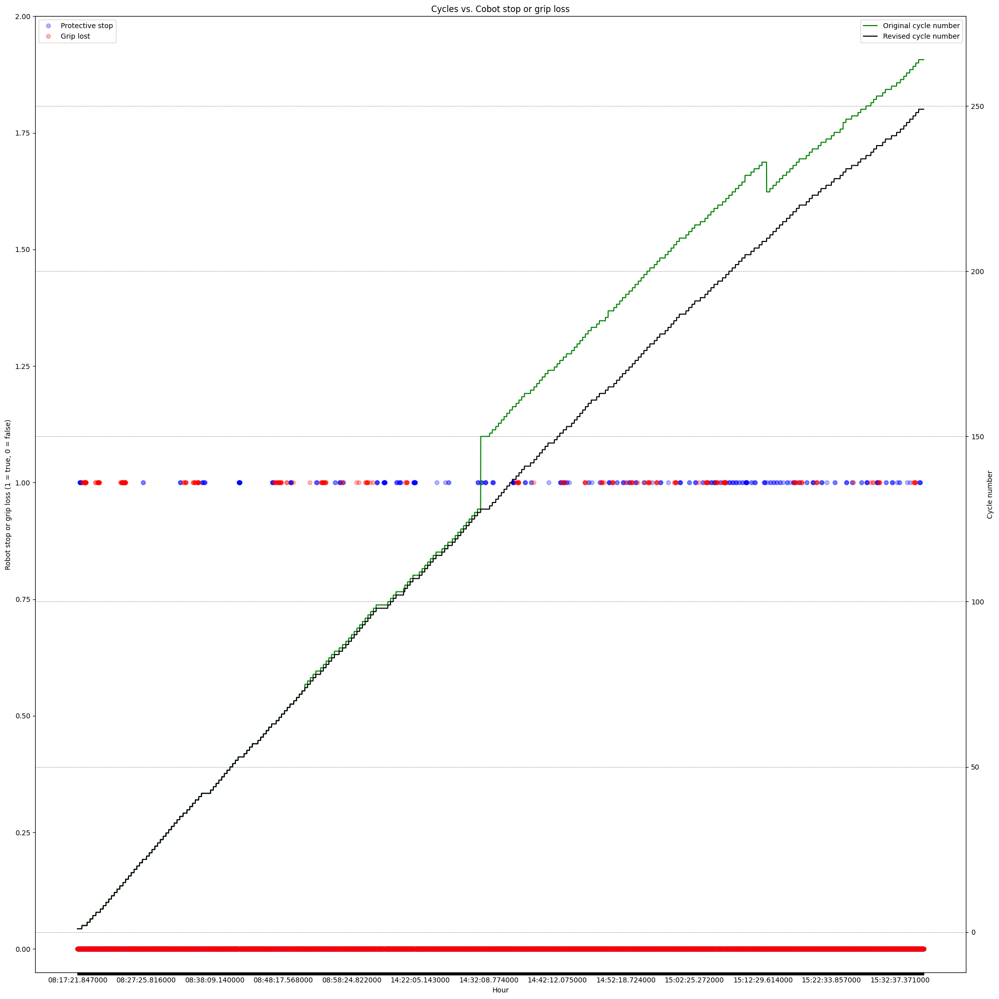

In [22]:
# recreeate initial visualisation, adding sequential cycle numbers of new feature

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(20,20))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.plot(dataset["time_str"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Hour')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.set_ylim(top=2)
# Plot the first scatter plot
ax1.plot(dataset["time_str"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="upper left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(dataset["time_str"], dataset["cycle"], color='g', label='Original cycle number')
ax2.plot(dataset["time_str"], dataset["cyc_rename"], color='black', label='Revised cycle number')
ax2.set_ylabel('Cycle number')

# Add a title and show the plot
plt.title('Cycles vs. Cobot stop or grip loss')
fig.tight_layout()  # Adjust layout to prevent overlap
plt.xticks(rotation=45)
# # Show only some x-ticks
for index, label in enumerate(ax1.get_xticklabels()):
    if index % 600 != 0:  # Show every 600th label
        label.set_visible(False)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.show()

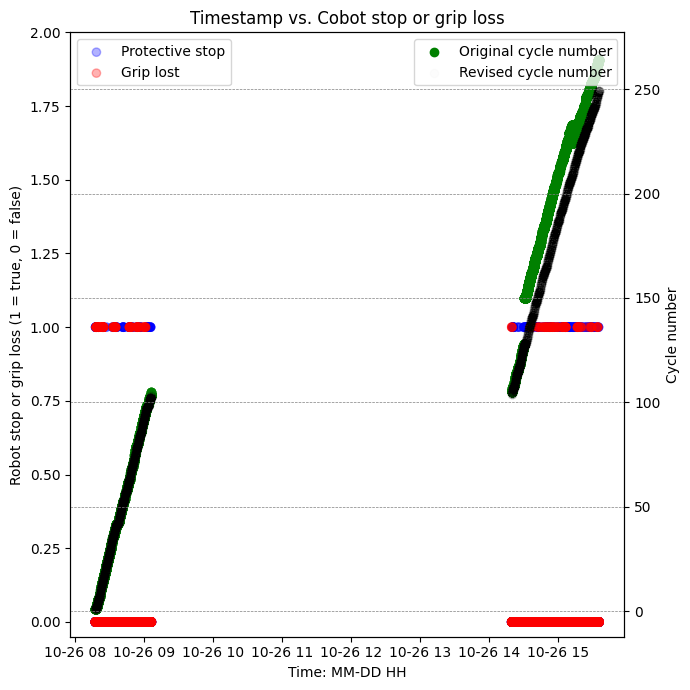

In [23]:
# Redraw graph with time fairly represented as a scatter

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))


# Plot the first scatter plot
ax1.scatter(dataset["cleaned_timestamp"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Time: MM-DD HH')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.set_ylim(top=2)
ax1.scatter(dataset["cleaned_timestamp"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="upper left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(dataset["cleaned_timestamp"], dataset["cycle"], color='g', label='Original cycle number')
ax2.scatter(dataset["cleaned_timestamp"], dataset["cyc_rename"], color='black', alpha =0.01, label='Revised cycle number')
ax2.set_ylabel('Cycle number')

# Add a title and show the plot
plt.title('Timestamp vs. Cobot stop or grip loss')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

# better representation of gap in middle day just after cycle 100

Major stop in operations from approx 09:00 until 14:00
- Cycles out of sync of expected after this
- Could be planned or human intervention and re-planning due to robot issues 


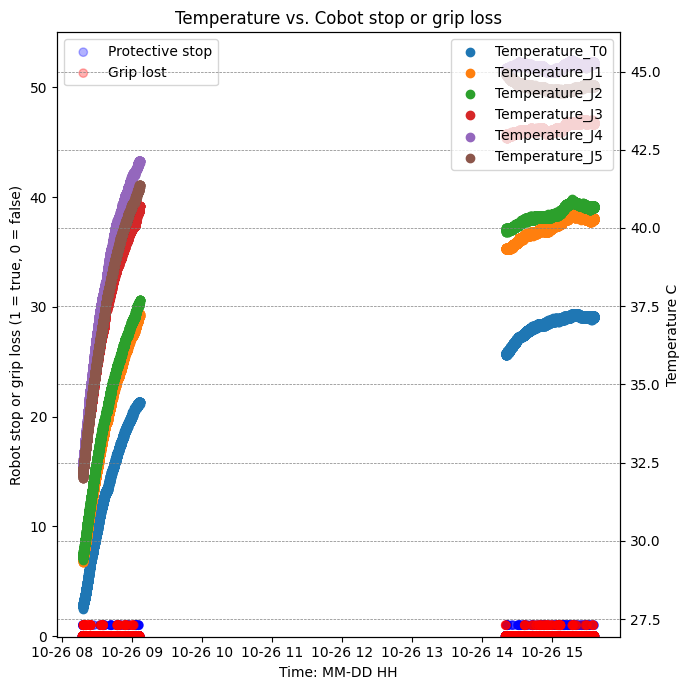

In [24]:
# Same plot but with temp instead of cycles

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.scatter(dataset["cleaned_timestamp"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Time: MM-DD HH')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.set_ylim(top=2)
ax1.scatter(dataset["cleaned_timestamp"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="upper left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(dataset["cleaned_timestamp"], dataset["Temperature_T0"], label='Temperature_T0')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Temperature_J1"], label='Temperature_J1')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Temperature_J2"], label='Temperature_J2')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Temperature_J3"], label='Temperature_J3') 
ax2.scatter(dataset["cleaned_timestamp"], dataset["Temperature_J4"], label='Temperature_J4')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Temperature_J5"], label='Temperature_J5')
ax2.set_ylabel('Temperature C')
ax1.set_ylim(top=55)

# Add a title and show the plot
plt.title('Temperature vs. Cobot stop or grip loss')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

Temperature increasing throughput the day and then plateauing, regardles of break from 09:00 to 14:00

# 2.2.1 Generate new cycle time feature
Could be interesting to compare cycle to cycle and what robot was doing at each timepoint.

Generate variable to determine at what point of the cycle a datapoint is

In [25]:
# cycle length of time determination

# set initial time as first time point
init_time = dataset.loc[0, 'cleaned_timestamp']
print(init_time)

# Iterate through the DataFrame and apply the condition
for i in range(0, len(dataset)):
    # if value is false, the cycle has changed and that is new init_time
    if not dataset.at[i, 'new_cyc']:
        init_time = dataset.loc[i, 'cleaned_timestamp']
    else:
        init_time = init_time
    # subtract init_time from the timestamp of each row to find timepoint in cycle
    dataset.at[i, 'cyc_timepoint'] = dataset.at[i, 'cleaned_timestamp'] - init_time

#set timedelta to float so can plot
dataset['cyc_timepoint_sec'] = dataset['cyc_timepoint'].dt.total_seconds()

# show table
dataset.T


2022-10-26 08:17:21.847000


,0,1,2,3,4,5,6,7,8,9,...,7399,7400,7401,7402,7403,7404,7405,7406,7407,7408
Num,1,2,3,4,5,6,7,8,9,10,...,7400,7401,7402,7403,7404,7405,7406,7407,7408,7409
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T15:35:57.524Z,2022-10-26T15:35:58.527Z,2022-10-26T15:35:59.529Z,2022-10-26T15:36:00.539Z,2022-10-26T15:36:01.549Z,2022-10-26T15:36:02.555Z,2022-10-26T15:36:03.562Z,2022-10-26T15:36:04.571Z,2022-10-26T15:36:05.572Z,2022-10-26T15:36:06.580Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.189909,-0.051396,-0.192624,-0.217085,-0.131406,-0.109017,-0.098536,-0.1211,-0.12937,-0.134429
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.125
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.495173,-2.849013,-2.526635,-2.628725,-2.367134,-2.261695,-2.251992,-2.280791,-2.269061,-2.244449
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,40.3125,40.3125,40.3125,40.25,40.3125,40.3125,40.3125,40.25,40.3125,40.3125
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.596931,-0.830781,-0.92836,-0.962782,-1.037989,-1.082678,-1.09442,-1.121319,-1.09161,-1.09895
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-1.573144,-0.387453,-0.356138,-0.399277,-0.470314,-0.494714,-0.515789,-0.502406,-0.491158,-0.502397
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,43.375,43.375,43.375,43.3125,43.3125,43.375,43.375,43.375,43.375,43.375


# 2.3  Filling in nulls

all features continuous except cycle, grip lost and protective stop

Demoed that Temperature fill works correctly, before applying to full dataset

In [26]:
# Fill null values Temperature with the value from the previous row into a new dataset to test
df_filled = dataset.copy()
df_filled[[
    "Temperature_T0","Temperature_J1","Temperature_J2","Temperature_J3","Temperature_J4","Temperature_J5"
    ]] = df_filled[[
        "Temperature_T0","Temperature_J1","Temperature_J2","Temperature_J3","Temperature_J4","Temperature_J5"]].ffill()

# check temperature completed correctly before applying to the rest
# show null table generated in section 2.1, which had null temp values before filling
df_with_nulls.T

,813,947,976,1046,1315,2089,2237,2316,2392,2668,...,6818,6936,6992,7039,7090,7136,7187,7249,7305,7365
Num,814,948,977,1047,1316,2090,2238,2317,2393,2669,...,6819,6937,6993,7040,7091,7137,7188,7250,7306,7366
Timestamp,2022-10-26T08:31:00.829Z,2022-10-26T08:33:15.550Z,2022-10-26T08:33:44.702Z,2022-10-26T08:34:55.110Z,2022-10-26T08:40:05.795Z,"""2022-10-26T08:53:11.129Z""","""2022-10-26T08:55:40.880Z""",2022-10-26T08:57:00.305Z,2022-10-26T08:58:16.761Z,2022-10-26T09:02:56.217Z,...,2022-10-26T15:26:13.177Z,2022-10-26T15:28:11.890Z,2022-10-26T15:29:08.185Z,2022-10-26T15:29:55.437Z,2022-10-26T15:30:46.772Z,2022-10-26T15:31:33.017Z,2022-10-26T15:32:24.292Z,2022-10-26T15:33:26.639Z,2022-10-26T15:34:22.946Z,2022-10-26T15:35:23.322Z
Current_J0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_T0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current_J1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current_J2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current_J3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
# Create a table of null data, after temperature filled, to review

# Filter rows with any NaN values
df_with_nulls_tempfill = df_filled[df_filled.isnull().any(axis=1)]

# show table
df_with_nulls_tempfill.T


,813,947,976,1046,1315,2089,2237,2316,2392,2668,...,6818,6936,6992,7039,7090,7136,7187,7249,7305,7365
Num,814,948,977,1047,1316,2090,2238,2317,2393,2669,...,6819,6937,6993,7040,7091,7137,7188,7250,7306,7366
Timestamp,2022-10-26T08:31:00.829Z,2022-10-26T08:33:15.550Z,2022-10-26T08:33:44.702Z,2022-10-26T08:34:55.110Z,2022-10-26T08:40:05.795Z,"""2022-10-26T08:53:11.129Z""","""2022-10-26T08:55:40.880Z""",2022-10-26T08:57:00.305Z,2022-10-26T08:58:16.761Z,2022-10-26T09:02:56.217Z,...,2022-10-26T15:26:13.177Z,2022-10-26T15:28:11.890Z,2022-10-26T15:29:08.185Z,2022-10-26T15:29:55.437Z,2022-10-26T15:30:46.772Z,2022-10-26T15:31:33.017Z,2022-10-26T15:32:24.292Z,2022-10-26T15:33:26.639Z,2022-10-26T15:34:22.946Z,2022-10-26T15:35:23.322Z
Current_J0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_T0,30.5625,31.0,31.0625,31.25,31.875,33.4375,33.6875,33.8125,33.875,34.25,...,37.1875,37.1875,37.125,37.1875,37.125,37.125,37.125,37.125,37.125,37.1875
Current_J1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J1,32.5625,33.0,33.125,33.3125,34.125,35.875,36.125,36.3125,36.4375,36.875,...,40.3125,40.3125,40.25,40.3125,40.25,40.25,40.25,40.25,40.25,40.25
Current_J2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J2,32.8125,33.375,33.4375,33.6875,34.5625,36.25,36.5625,36.75,36.8125,37.3125,...,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.625
Current_J3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature_J3,36.0,36.5,36.5625,36.75,37.75,39.375,39.625,39.75,39.9375,40.25,...,43.4375,43.375,43.3125,43.375,43.375,43.375,43.3125,43.375,43.375,43.3125


In [28]:
# ffill (forward fill) seems to work ok so apply to full dataset, as all null values are continuous data
dataset = dataset.ffill()

dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   Num                   7409 non-null   int64          
 1   Timestamp             7409 non-null   object         
 2   Current_J0            7409 non-null   float64        
 3   Temperature_T0        7409 non-null   float64        
 4   Current_J1            7409 non-null   float64        
 5   Temperature_J1        7409 non-null   float64        
 6   Current_J2            7409 non-null   float64        
 7   Temperature_J2        7409 non-null   float64        
 8   Current_J3            7409 non-null   float64        
 9   Temperature_J3        7409 non-null   float64        
 10  Current_J4            7409 non-null   float64        
 11  Temperature_J4        7409 non-null   float64        
 12  Current_J5            7409 non-null   float64        
 13  Tem

In [29]:
# stats
dataset.describe()

,Num,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,...,Speed_J4,Speed_J5,Tool_current,cycle,Robot_ProtectiveStop,cleaned_timestamp,grip_lost_enc,cyc_rename,cyc_timepoint,cyc_timepoint_sec
count,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,...,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409,7409.000000,7409.000000,7409,7409.000000
mean,3705.000000,-0.048331,34.916124,-2.297070,37.670443,-1.199689,38.074875,-0.605457,40.947007,-0.022918,...,-0.000867,0.002754,0.109649,141.113241,0.037657,2022-10-26 12:32:21.144138496,0.032798,130.565123,0 days 00:01:07.470657038,67.470657
min,1.000000,-6.247756,27.812500,-5.808734,29.312500,-4.171966,29.375000,-3.333102,32.125000,-4.738406,...,-0.226233,-1.629721,0.020180,1.000000,0.000000,2022-10-26 08:17:21.847000,0.000000,1.000000,0 days 00:00:00,0.000000
25%,1853.000000,-0.195054,33.000000,-2.663567,35.375000,-1.553532,35.812500,-0.831143,38.937500,-0.126043,...,-0.000121,-0.000808,0.082473,68.000000,0.000000,2022-10-26 08:49:09.864000,0.000000,68.000000,0 days 00:00:07.038000,7.038000
50%,3705.000000,-0.080634,36.562500,-2.233232,39.687500,-1.076901,40.187500,-0.571413,43.062500,-0.012463,...,0.000000,0.000000,0.085192,154.000000,0.000000,2022-10-26 14:33:53.363000064,0.000000,132.000000,0 days 00:00:14.116000,14.116000
75%,5557.000000,0.096498,37.062500,-1.778007,40.125000,-0.838398,40.437500,-0.387941,43.125000,0.086163,...,0.000067,0.013321,0.089518,218.000000,0.000000,2022-10-26 15:05:03.067000064,0.000000,195.000000,0 days 00:00:22.125000,22.125000
max,7409.000000,6.806938,37.250000,1.083596,40.500000,2.464940,40.937500,2.270268,43.437500,4.089389,...,0.193914,1.378015,0.602054,264.000000,1.000000,2022-10-26 15:36:06.580000,1.000000,249.000000,0 days 05:13:55.240000,18835.240000
std,2138.938405,0.832283,2.758778,0.799764,3.243383,0.609993,3.307698,0.514355,3.177794,0.629524,...,0.038461,0.314928,0.079124,80.542340,0.190378,NaN,0.178119,72.556321,0 days 00:16:16.077882526,976.077883


# 2.4 Joint current and speed visualisations

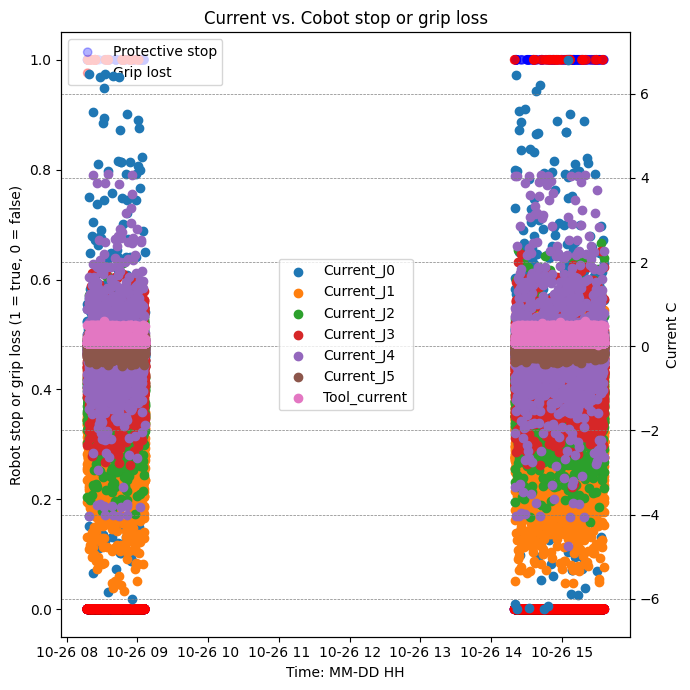

In [30]:
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.scatter(dataset["cleaned_timestamp"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Time: MM-DD HH')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.scatter(dataset["cleaned_timestamp"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="upper left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(dataset["cleaned_timestamp"], dataset["Current_J0"], label='Current_J0')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Current_J1"], label='Current_J1')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Current_J2"], label='Current_J2')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Current_J3"], label='Current_J3') 
ax2.scatter(dataset["cleaned_timestamp"], dataset["Current_J4"], label='Current_J4')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Current_J5"], label='Current_J5')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Tool_current"], label='Tool_current')
ax2.set_ylabel('Current C')

# Add a title and show the plot
plt.title('Current vs. Cobot stop or grip loss')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="center")
plt.tight_layout()
plt.show()

# hard to interpret but some obvious patterns present that seem time independent

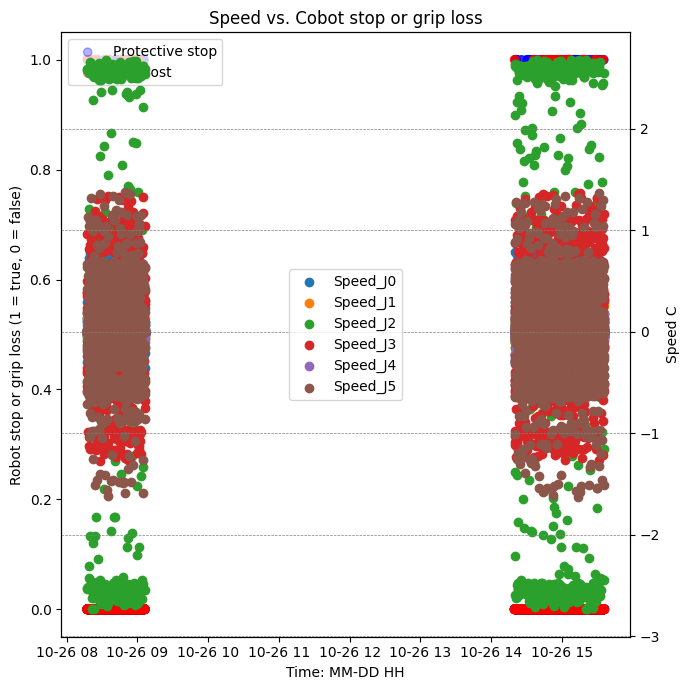

In [31]:
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.scatter(dataset["cleaned_timestamp"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Time: MM-DD HH')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.scatter(dataset["cleaned_timestamp"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="upper left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(dataset["cleaned_timestamp"], dataset["Speed_J0"], label='Speed_J0')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Speed_J1"], label='Speed_J1')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Speed_J2"], label='Speed_J2')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Speed_J3"], label='Speed_J3') 
ax2.scatter(dataset["cleaned_timestamp"], dataset["Speed_J4"], label='Speed_J4')
ax2.scatter(dataset["cleaned_timestamp"], dataset["Speed_J5"], label='Speed_J5')
ax2.set_ylabel('Speed C')

# Add a title and show the plot
plt.title('Speed vs. Cobot stop or grip loss')
plt.xticks(rotation=45)

plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="center")
plt.tight_layout()
plt.show()

# hard to interpret but some obvious patterns present that seem time independent

Hard to interpret above graphs but some obvious patterns present that seem time independent.

Plot current and speed against each other, irrelevant of time

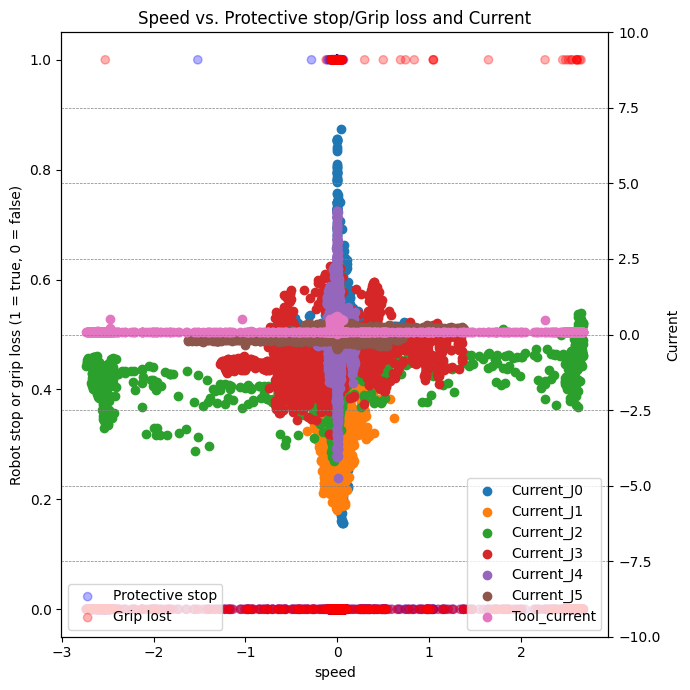

In [32]:
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.scatter(dataset["Speed_J2"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('speed')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.scatter(dataset["Speed_J2"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="lower left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(dataset["Speed_J0"], dataset["Current_J0"], label='Current_J0')
ax2.scatter(dataset["Speed_J1"], dataset["Current_J1"], label='Current_J1')
ax2.scatter(dataset["Speed_J2"], dataset["Current_J2"], label='Current_J2')
ax2.scatter(dataset["Speed_J3"], dataset["Current_J3"], label='Current_J3') 
ax2.scatter(dataset["Speed_J4"], dataset["Current_J4"], label='Current_J4')
ax2.scatter(dataset["Speed_J5"], dataset["Current_J5"], label='Current_J5')
ax2.scatter(dataset["Speed_J2"], dataset["Tool_current"], label='Tool_current')
ax2.set_ylabel('Current')
ax2.set_ylim(top=10, bottom = -10)

# Add a title and show the plot
plt.title('Speed vs. Protective stop/Grip loss and Current')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

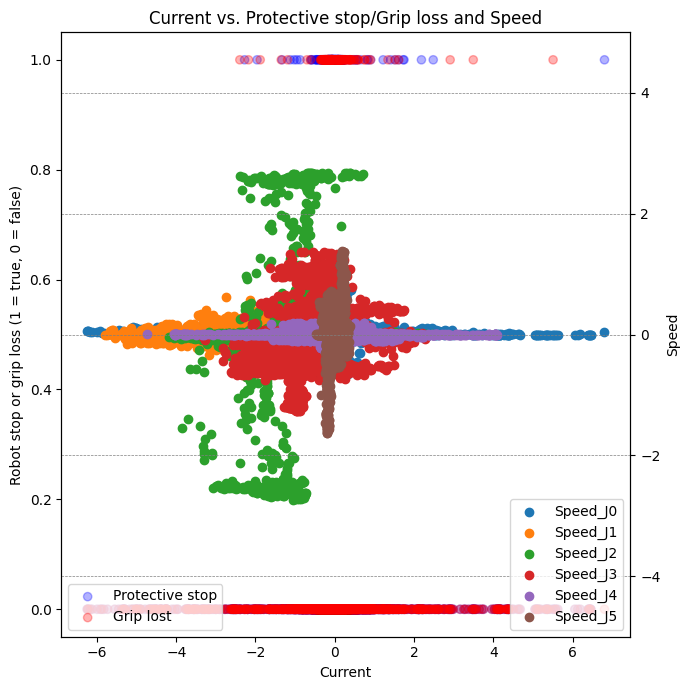

In [33]:
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

#set time to string so can plot
dataset['time_str'] = dataset['time'].astype(str)


# Plot the first scatter plot
ax1.scatter(dataset["Current_J0"], dataset["Robot_ProtectiveStop"], linestyle='', marker='o', color='b', alpha = 0.3, label='Protective stop')
ax1.set_xlabel('Current')
ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
ax1.scatter(dataset["Current_J0"], dataset["grip_lost_enc"], linestyle='', marker='o', color='r', alpha = 0.3,label='Grip lost')
plt.legend(loc="lower left")

#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(dataset["Current_J0"], dataset["Speed_J0"], label='Speed_J0')
ax2.scatter(dataset["Current_J1"], dataset["Speed_J1"], label='Speed_J1')
ax2.scatter(dataset["Current_J2"], dataset["Speed_J2"], label='Speed_J2')
ax2.scatter(dataset["Current_J3"], dataset["Speed_J3"], label='Speed_J3') 
ax2.scatter(dataset["Current_J4"], dataset["Speed_J4"], label='Speed_J4')
ax2.scatter(dataset["Current_J5"], dataset["Speed_J5"], label='Speed_J5')
ax2.set_ylabel('Speed')
ax2.set_ylim(top=5, bottom = -5)

# Add a title and show the plot
plt.title('Current vs. Protective stop/Grip loss and Speed')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

- Current and speed centralised on zero with negative and positive indicating or controlling cobot joint (J0-J5) movement in different directions
- Each joint J0-J5 and the tool/gripper has it’s own pattern
- Grip loss or protective stop faults happen less in negative range


# 2.5 Generate summary table - grouping by cycle

In [34]:
# Group by column 'cyc_rename'
grouped = dataset.groupby('cyc_rename')

# Create summary DataFrame
summary_df = grouped.agg(
    cyc_rename =('cyc_rename', 'first'),  
    cyc_original =('cycle', 'first'),
    grip_lost=('grip_lost_enc', 'sum'),  
    protective_stop=('Robot_ProtectiveStop', 'sum'), 
    cyc_end = ('cleaned_timestamp', 'max'),
    cyc_start = ('cleaned_timestamp', 'min'),
    duration=('cyc_timepoint', 'max'),
    cyc_datapts = ('cyc_rename', 'count'), 
    temp_J0 = ('Temperature_T0','median'),
    temp_J1 = ('Temperature_J1','median'),  
    temp_J2 = ('Temperature_J2','median'), 
    temp_J3 = ('Temperature_J3','median'),
    temp_J4 = ('Temperature_J4','median'), 
    temp_J5 = ('Temperature_J5','median')         
).reset_index(drop=True)

# show table
summary_df.T

,0,1,2,3,4,5,6,7,8,9,...,239,240,241,242,243,244,245,246,247,248
cyc_rename,1,2,3,4,5,6,7,8,9,10,...,240,241,242,243,244,245,246,247,248,249
cyc_original,1,2,3,4,5,6,7,8,9,10,...,255,256,257,258,259,260,261,262,263,264
grip_lost,0,21,0,0,2,13,0,0,0,0,...,0,0,0,0,0,0,0,6,0,0
protective_stop,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,3.0,3.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0
cyc_end,2022-10-26 08:18:00.071000,2022-10-26 08:18:46.310000,2022-10-26 08:19:12.433000,2022-10-26 08:19:36.558000,2022-10-26 08:20:03.669000,2022-10-26 08:20:42.870000,2022-10-26 08:21:08.022000,2022-10-26 08:21:32.134000,2022-10-26 08:21:56.242000,2022-10-26 08:22:20.364000,...,2022-10-26 15:31:21.951000,2022-10-26 15:32:07.185000,2022-10-26 15:32:40.390000,2022-10-26 15:33:10.560000,2022-10-26 15:33:34.692000,2022-10-26 15:34:02.860000,2022-10-26 15:34:32.006000,2022-10-26 15:34:56.172000,2022-10-26 15:35:21.311000,2022-10-26 15:36:06.580000
cyc_start,2022-10-26 08:17:21.847000,2022-10-26 08:18:01.086000,2022-10-26 08:18:47.317000,2022-10-26 08:19:13.438000,2022-10-26 08:19:37.564000,2022-10-26 08:20:04.671000,2022-10-26 08:20:43.876000,2022-10-26 08:21:09.028000,2022-10-26 08:21:33.139000,2022-10-26 08:21:57.244000,...,2022-10-26 15:30:29.664000,2022-10-26 15:31:22.958000,2022-10-26 15:32:08.188000,2022-10-26 15:32:41.394000,2022-10-26 15:33:11.566000,2022-10-26 15:33:35.696000,2022-10-26 15:34:03.868000,2022-10-26 15:34:33.012000,2022-10-26 15:34:57.176000,2022-10-26 15:35:22.316000
duration,0 days 00:00:38.224000,0 days 00:00:45.224000,0 days 00:00:25.116000,0 days 00:00:23.120000,0 days 00:00:26.105000,0 days 00:00:38.199000,0 days 00:00:24.146000,0 days 00:00:23.106000,0 days 00:00:23.103000,0 days 00:00:23.120000,...,0 days 00:00:52.287000,0 days 00:00:44.227000,0 days 00:00:32.202000,0 days 00:00:29.166000,0 days 00:00:23.126000,0 days 00:00:27.164000,0 days 00:00:28.138000,0 days 00:00:23.160000,0 days 00:00:24.135000,0 days 00:00:44.264000
cyc_datapts,39,46,26,24,27,39,25,24,24,24,...,53,45,33,30,24,28,29,24,25,45
temp_J0,27.875,28.0,28.125,28.1875,28.3125,28.4375,28.5,28.625,28.6875,28.8125,...,37.125,37.125,37.125,37.125,37.125,37.125,37.125,37.125,37.125,37.1875
temp_J1,29.4375,29.625,29.6875,29.8125,29.9375,30.0625,30.1875,30.28125,30.375,30.5,...,40.25,40.25,40.25,40.25,40.25,40.25,40.25,40.25,40.25,40.3125


In [35]:
summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype          
---  ------           --------------  -----          
 0   cyc_rename       249 non-null    int64          
 1   cyc_original     249 non-null    int64          
 2   grip_lost        249 non-null    int64          
 3   protective_stop  249 non-null    float64        
 4   cyc_end          249 non-null    datetime64[ns] 
 5   cyc_start        249 non-null    datetime64[ns] 
 6   duration         249 non-null    timedelta64[ns]
 7   cyc_datapts      249 non-null    int64          
 8   temp_J0          249 non-null    float64        
 9   temp_J1          249 non-null    float64        
 10  temp_J2          249 non-null    float64        
 11  temp_J3          249 non-null    float64        
 12  temp_J4          249 non-null    float64        
 13  temp_J5          249 non-null    float64        
dtypes: datetime64[ns](2), floa

In [36]:
# # Iterate through the DataFrame and apply the condition
for i in range(0, len(summary_df)):
    # sum up errors
    summary_df.at[i, 'all_errors'] = summary_df.at[i, 'grip_lost'] + summary_df.at[i, 'protective_stop']
# no start of next cycle for last row
for i in range(0, len(summary_df)-1):
    # calculate length of breaks after/between cycle
    summary_df.at[i, 'break_post_cyc'] = summary_df.at[i+1, 'cyc_start'] - summary_df.at[i, 'cyc_end']

# set time of last row/index as 0 timedelta (same format other entries)
summary_df.loc[len(summary_df)-1,'break_post_cyc'] = timedelta(0)

#set timedelta to float so can plot
summary_df['duration_sec'] = summary_df['duration'].dt.total_seconds()
summary_df['break_post_c_sec'] = summary_df['break_post_cyc'].dt.total_seconds()

# view results    
summary_df.T


,0,1,2,3,4,5,6,7,8,9,...,239,240,241,242,243,244,245,246,247,248
cyc_rename,1,2,3,4,5,6,7,8,9,10,...,240,241,242,243,244,245,246,247,248,249
cyc_original,1,2,3,4,5,6,7,8,9,10,...,255,256,257,258,259,260,261,262,263,264
grip_lost,0,21,0,0,2,13,0,0,0,0,...,0,0,0,0,0,0,0,6,0,0
protective_stop,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,3.0,3.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0
cyc_end,2022-10-26 08:18:00.071000,2022-10-26 08:18:46.310000,2022-10-26 08:19:12.433000,2022-10-26 08:19:36.558000,2022-10-26 08:20:03.669000,2022-10-26 08:20:42.870000,2022-10-26 08:21:08.022000,2022-10-26 08:21:32.134000,2022-10-26 08:21:56.242000,2022-10-26 08:22:20.364000,...,2022-10-26 15:31:21.951000,2022-10-26 15:32:07.185000,2022-10-26 15:32:40.390000,2022-10-26 15:33:10.560000,2022-10-26 15:33:34.692000,2022-10-26 15:34:02.860000,2022-10-26 15:34:32.006000,2022-10-26 15:34:56.172000,2022-10-26 15:35:21.311000,2022-10-26 15:36:06.580000
cyc_start,2022-10-26 08:17:21.847000,2022-10-26 08:18:01.086000,2022-10-26 08:18:47.317000,2022-10-26 08:19:13.438000,2022-10-26 08:19:37.564000,2022-10-26 08:20:04.671000,2022-10-26 08:20:43.876000,2022-10-26 08:21:09.028000,2022-10-26 08:21:33.139000,2022-10-26 08:21:57.244000,...,2022-10-26 15:30:29.664000,2022-10-26 15:31:22.958000,2022-10-26 15:32:08.188000,2022-10-26 15:32:41.394000,2022-10-26 15:33:11.566000,2022-10-26 15:33:35.696000,2022-10-26 15:34:03.868000,2022-10-26 15:34:33.012000,2022-10-26 15:34:57.176000,2022-10-26 15:35:22.316000
duration,0 days 00:00:38.224000,0 days 00:00:45.224000,0 days 00:00:25.116000,0 days 00:00:23.120000,0 days 00:00:26.105000,0 days 00:00:38.199000,0 days 00:00:24.146000,0 days 00:00:23.106000,0 days 00:00:23.103000,0 days 00:00:23.120000,...,0 days 00:00:52.287000,0 days 00:00:44.227000,0 days 00:00:32.202000,0 days 00:00:29.166000,0 days 00:00:23.126000,0 days 00:00:27.164000,0 days 00:00:28.138000,0 days 00:00:23.160000,0 days 00:00:24.135000,0 days 00:00:44.264000
cyc_datapts,39,46,26,24,27,39,25,24,24,24,...,53,45,33,30,24,28,29,24,25,45
temp_J0,27.875,28.0,28.125,28.1875,28.3125,28.4375,28.5,28.625,28.6875,28.8125,...,37.125,37.125,37.125,37.125,37.125,37.125,37.125,37.125,37.125,37.1875
temp_J1,29.4375,29.625,29.6875,29.8125,29.9375,30.0625,30.1875,30.28125,30.375,30.5,...,40.25,40.25,40.25,40.25,40.25,40.25,40.25,40.25,40.25,40.3125


In [37]:
#check datatypes and nulls
summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype          
---  ------            --------------  -----          
 0   cyc_rename        249 non-null    int64          
 1   cyc_original      249 non-null    int64          
 2   grip_lost         249 non-null    int64          
 3   protective_stop   249 non-null    float64        
 4   cyc_end           249 non-null    datetime64[ns] 
 5   cyc_start         249 non-null    datetime64[ns] 
 6   duration          249 non-null    timedelta64[ns]
 7   cyc_datapts       249 non-null    int64          
 8   temp_J0           249 non-null    float64        
 9   temp_J1           249 non-null    float64        
 10  temp_J2           249 non-null    float64        
 11  temp_J3           249 non-null    float64        
 12  temp_J4           249 non-null    float64        
 13  temp_J5           249 non-null    float64        
 14  all_errors

<Figure size 1500x1500 with 0 Axes>

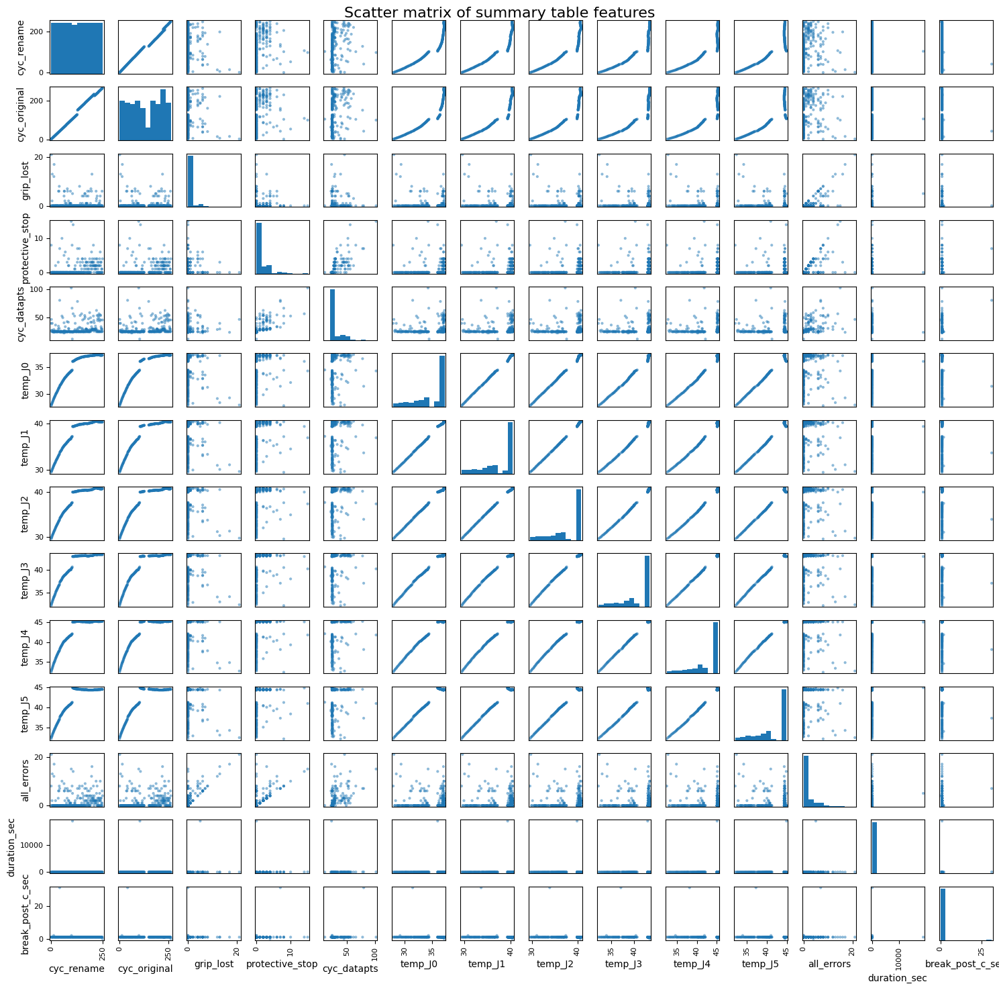

In [38]:
# Generate scatter matrix to look at feature correlations and data spread/skew per feature (central diagonal)
plt.figure(figsize=(15,15))

scatter_matrix(summary_df, figsize=(15,15))
plt.suptitle('Scatter matrix of summary table features', fontsize=16)
plt.tight_layout()

- temperatures as expected have a linear correlation to each other
- duration_sec and break_post_cycle_sec have very heavy left skew, when compared to all features

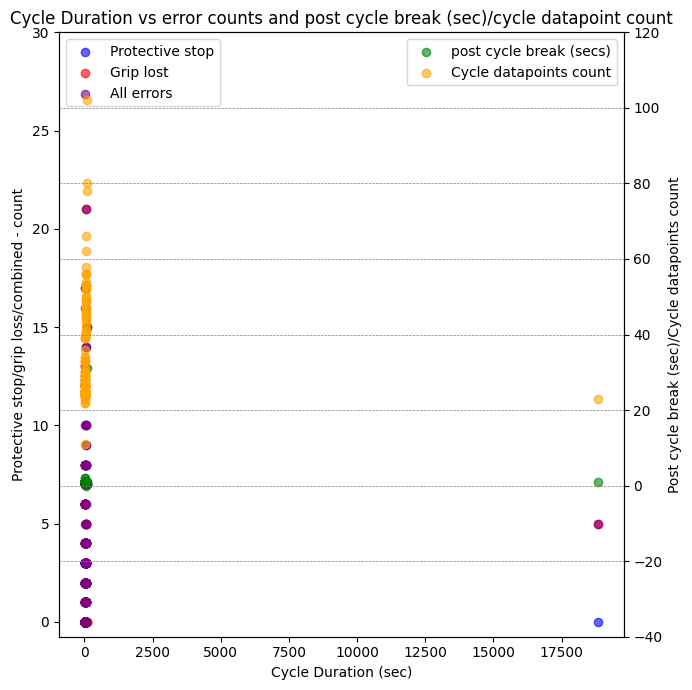

In [39]:
# Plot errors versus duration_sec and break_post_cycle_sec to better view the affect of the skew

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

# Plot the first scatter plot
ax1.scatter(summary_df["duration_sec"], summary_df["protective_stop"], color = "blue",  alpha = 0.6, label='Protective stop')
ax1.set_xlabel('Cycle Duration (sec)')
ax1.set_ylabel('Protective stop/grip loss/combined - count')
ax1.set_ylim(top=30)
ax1.scatter(summary_df["duration_sec"], summary_df["grip_lost"], color = "red", alpha = 0.6,label='Grip lost')
ax1.scatter(summary_df["duration_sec"], summary_df["all_errors"],  color = "purple",alpha = 0.6,label='All errors')
plt.legend(loc="upper left")

# #Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(summary_df["duration_sec"], summary_df["break_post_c_sec"],color = "green",alpha = 0.6, label='post cycle break (secs)')
ax2.scatter(summary_df["duration_sec"], summary_df["cyc_datapts"], color = "orange",alpha = 0.6,label='Cycle datapoints count')
ax2.set_ylabel('Post cycle break (sec)/Cycle datapoints count')
ax2.set_ylim(top=120, bottom = -40)

# Add a title and show the plot
plt.title('Cycle Duration vs error counts and post cycle break (sec)/cycle datapoint count')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

In [40]:
# sort table to review highest duration values
summary_df.sort_values('duration',ascending=False).head(15).T

,103,97,41,127,101,219,186,106,231,147,162,237,227,239,52
cyc_rename,104,98,42,128,102,220,187,107,232,148,163,238,228,240,53
cyc_original,105,99,42,150,103,234,210,108,247,170,185,253,242,255,53
grip_lost,5,0,0,0,0,3,0,0,1,0,5,4,0,0,0
protective_stop,0.0,15.0,7.0,7.0,8.0,2.0,4.0,14.0,2.0,1.0,2.0,6.0,2.0,2.0,10.0
cyc_end,2022-10-26 14:20:12.434000,2022-10-26 09:03:44.466000,2022-10-26 08:37:03.755000,2022-10-26 14:32:15.812000,2022-10-26 09:06:05.132000,2022-10-26 15:18:51.666000,2022-10-26 15:01:10.880000,2022-10-26 14:21:57.077000,2022-10-26 15:26:27.257000,2022-10-26 14:41:45.886000,2022-10-26 14:49:17.625000,2022-10-26 15:30:04.519000,2022-10-26 15:23:50.274000,2022-10-26 15:31:21.951000,2022-10-26 08:42:30.596000
cyc_start,2022-10-26 09:06:17.194000,2022-10-26 09:02:02.984000,2022-10-26 08:35:35.296000,2022-10-26 14:30:58.418000,2022-10-26 09:04:58.799000,2022-10-26 15:17:50.392000,2022-10-26 15:00:13.530000,2022-10-26 14:21:01.725000,2022-10-26 15:25:31.907000,2022-10-26 14:40:50.611000,2022-10-26 14:48:24.279000,2022-10-26 15:29:11.210000,2022-10-26 15:22:57.984000,2022-10-26 15:30:29.664000,2022-10-26 08:41:38.329000
duration,0 days 05:13:55.240000,0 days 00:01:41.482000,0 days 00:01:28.459000,0 days 00:01:17.394000,0 days 00:01:06.333000,0 days 00:01:01.274000,0 days 00:00:57.350000,0 days 00:00:55.352000,0 days 00:00:55.350000,0 days 00:00:55.275000,0 days 00:00:53.346000,0 days 00:00:53.309000,0 days 00:00:52.290000,0 days 00:00:52.287000,0 days 00:00:52.267000
cyc_datapts,23,102,80,78,66,62,58,56,56,56,53,54,53,53,52
temp_J0,36.0,34.25,31.4375,36.5,34.375,37.25,37.0625,36.0,37.1875,36.75,36.9375,37.125,37.1875,37.125,32.125
temp_J1,39.3125,36.875,33.625,39.625,37.125,40.4375,40.0625,39.3125,40.375,39.8125,39.9375,40.25,40.3125,40.25,34.46875


- cycle 104/105 (new/original, index 103) 18835 sec (i.e. 5.2 hours, the break in operation from approx 09:00 to approx 14:00 was in the middle of this cycle) is way larger than other cycles that are 100fold lower start at 101.5 sec
- from table below the lowest duration cycles are approx 20s i.e. 5 fold difference to second longest duration cycle

In [41]:
# sort table to review lowest duration values
summary_df.sort_values('duration',ascending=False).tail(15)

,cyc_rename,cyc_original,grip_lost,protective_stop,cyc_end,cyc_start,duration,cyc_datapts,temp_J0,temp_J1,temp_J2,temp_J3,temp_J4,temp_J5,all_errors,break_post_cyc,duration_sec,break_post_c_sec
98,99,100,0,0.0,2022-10-26 09:04:08.578,2022-10-26 09:03:45.473,0 days 00:00:23.105000,24,34.3125,37.00000,37.43750,40.3750,41.87500,41.0625,0.0,0 days 00:00:02.010000,23.105,2.010
71,72,72,0,0.0,2022-10-26 08:51:05.478,2022-10-26 08:50:42.374,0 days 00:00:23.104000,24,33.1875,35.56250,36.00000,39.1250,40.62500,39.7500,0.0,0 days 00:00:01.008000,23.104,1.008
40,41,41,0,0.0,2022-10-26 08:35:34.287,2022-10-26 08:35:11.184,0 days 00:00:23.103000,24,31.3125,33.37500,33.75000,36.8125,37.87500,37.0625,0.0,0 days 00:00:01.009000,23.103,1.009
8,9,9,0,0.0,2022-10-26 08:21:56.242,2022-10-26 08:21:33.139,0 days 00:00:23.103000,24,28.6875,30.37500,30.56250,33.5000,33.90625,33.5000,0.0,0 days 00:00:01.002000,23.103,1.002
47,48,48,0,0.0,2022-10-26 08:39:59.765,2022-10-26 08:39:36.662,0 days 00:00:23.103000,24,31.8125,34.06250,34.43750,37.6875,38.81250,38.0000,0.0,0 days 00:00:01,23.103,1.000
26,27,27,0,0.0,2022-10-26 08:29:31.429,2022-10-26 08:29:08.329,0 days 00:00:23.100000,24,30.2500,32.18750,32.46875,35.5625,36.43750,35.6250,0.0,0 days 00:00:01.004000,23.100,1.004
81,82,83,0,0.0,2022-10-26 08:55:27.808,2022-10-26 08:55:04.713,0 days 00:00:23.095000,24,33.6250,36.06250,36.56250,39.5625,41.06250,40.2500,0.0,0 days 00:00:01.006000,23.095,1.006
19,20,20,0,0.0,2022-10-26 08:26:28.548,2022-10-26 08:26:05.459,0 days 00:00:23.089000,24,29.6875,31.50000,31.75000,34.7500,35.50000,34.8125,0.0,0 days 00:00:01.006000,23.089,1.006
28,29,29,0,0.0,2022-10-26 08:30:20.619,2022-10-26 08:29:57.533,0 days 00:00:23.086000,24,30.3750,32.34375,32.68750,35.7500,36.68750,35.8125,0.0,0 days 00:00:01.015000,23.086,1.015
12,13,13,0,0.0,2022-10-26 08:23:33.748,2022-10-26 08:23:10.662,0 days 00:00:23.086000,24,29.1250,30.81250,31.00000,34.0000,34.56250,34.0000,0.0,0 days 00:00:02.002000,23.086,2.002


In [42]:
# sort table to review highest post cycle break values
summary_df.sort_values('break_post_c_sec',ascending=False).head(15)

,cyc_rename,cyc_original,grip_lost,protective_stop,cyc_end,cyc_start,duration,cyc_datapts,temp_J0,temp_J1,temp_J2,temp_J3,temp_J4,temp_J5,all_errors,break_post_cyc,duration_sec,break_post_c_sec
41,42,42,0,7.0,2022-10-26 08:37:03.755,2022-10-26 08:35:35.296,0 days 00:01:28.459000,80,31.4375,33.62500,33.8750,37.1250,38.1250,37.3125,7.0,0 days 00:00:31.150000,88.459,31.150
98,99,100,0,0.0,2022-10-26 09:04:08.578,2022-10-26 09:03:45.473,0 days 00:00:23.105000,24,34.3125,37.00000,37.4375,40.3750,41.8750,41.0625,0.0,0 days 00:00:02.010000,23.105,2.010
12,13,13,0,0.0,2022-10-26 08:23:33.748,2022-10-26 08:23:10.662,0 days 00:00:23.086000,24,29.1250,30.81250,31.0000,34.0000,34.5625,34.0000,0.0,0 days 00:00:02.002000,23.086,2.002
159,160,182,0,2.0,2022-10-26 14:47:11.814,2022-10-26 14:46:44.678,0 days 00:00:27.136000,27,36.8750,39.87500,40.3125,43.1250,45.1875,44.4375,2.0,0 days 00:00:01.026000,27.136,1.026
0,1,1,0,8.0,2022-10-26 08:18:00.071,2022-10-26 08:17:21.847,0 days 00:00:38.224000,39,27.8750,29.43750,29.5000,32.2500,32.3750,32.1250,8.0,0 days 00:00:01.015000,38.224,1.015
28,29,29,0,0.0,2022-10-26 08:30:20.619,2022-10-26 08:29:57.533,0 days 00:00:23.086000,24,30.3750,32.34375,32.6875,35.7500,36.6875,35.8125,0.0,0 days 00:00:01.015000,23.086,1.015
58,59,59,0,0.0,2022-10-26 08:45:21.692,2022-10-26 08:44:58.562,0 days 00:00:23.130000,24,32.5000,34.87500,35.3125,38.5000,39.8750,38.9375,0.0,0 days 00:00:01.015000,23.130,1.015
87,88,89,0,0.0,2022-10-26 08:58:22.798,2022-10-26 08:57:58.652,0 days 00:00:24.146000,25,33.8750,36.43750,36.8750,39.8750,41.4375,40.5625,0.0,0 days 00:00:01.014000,24.146,1.014
85,86,87,0,2.0,2022-10-26 08:57:33.500,2022-10-26 08:57:05.344,0 days 00:00:28.156000,29,33.8125,36.31250,36.7500,39.8125,41.3125,40.5000,2.0,0 days 00:00:01.014000,28.156,1.014
15,16,16,0,0.0,2022-10-26 08:24:51.062,2022-10-26 08:24:26.941,0 days 00:00:24.121000,25,29.3750,31.12500,31.3125,34.3125,34.9375,34.3750,0.0,0 days 00:00:01.014000,24.121,1.014


In [43]:
# sort table to review lowest post cycle break values
summary_df.sort_values('break_post_c_sec',ascending=False).tail(15)

,cyc_rename,cyc_original,grip_lost,protective_stop,cyc_end,cyc_start,duration,cyc_datapts,temp_J0,temp_J1,temp_J2,temp_J3,temp_J4,temp_J5,all_errors,break_post_cyc,duration_sec,break_post_c_sec
31,32,32,0,0.0,2022-10-26 08:31:34.012,2022-10-26 08:31:10.881,0 days 00:00:23.131000,24,30.6250,32.62500,32.9375,36.0625,37.0000,36.1250,0.0,0 days 00:00:01.001000,23.131,1.001
237,238,253,4,6.0,2022-10-26 15:30:04.519,2022-10-26 15:29:11.210,0 days 00:00:53.309000,54,37.1250,40.25000,40.6250,43.3750,45.1875,44.5000,10.0,0 days 00:00:01.001000,53.309,1.001
99,100,101,0,0.0,2022-10-26 09:04:33.668,2022-10-26 09:04:10.588,0 days 00:00:23.080000,24,34.3125,37.00000,37.5000,40.4375,41.9375,41.1250,0.0,0 days 00:00:01.001000,23.080,1.001
135,136,158,0,0.0,2022-10-26 14:35:36.976,2022-10-26 14:35:13.834,0 days 00:00:23.142000,24,36.5625,39.68750,40.2500,43.0625,45.2500,44.5625,0.0,0 days 00:00:01.001000,23.142,1.001
42,43,43,0,0.0,2022-10-26 08:37:58.028,2022-10-26 08:37:34.905,0 days 00:00:23.123000,24,31.5625,33.75000,34.1250,37.3750,38.3125,37.6250,0.0,0 days 00:00:01.001000,23.123,1.001
62,63,63,4,5.0,2022-10-26 08:47:15.267,2022-10-26 08:46:35.070,0 days 00:00:40.197000,40,32.7500,35.15625,35.5625,38.7500,40.1875,39.1875,9.0,0 days 00:00:01.001000,40.197,1.001
230,231,246,0,3.0,2022-10-26 15:25:30.906,2022-10-26 15:24:41.577,0 days 00:00:49.329000,50,37.1875,40.31250,40.7500,43.3750,45.2500,44.5000,3.0,0 days 00:00:01.001000,49.329,1.001
195,196,219,6,6.0,2022-10-26 15:05:52.346,2022-10-26 15:05:20.159,0 days 00:00:32.187000,33,37.0625,40.12500,40.4375,43.1250,45.0625,44.3750,12.0,0 days 00:00:01.001000,32.187,1.001
215,216,230,0,2.0,2022-10-26 15:16:27.946,2022-10-26 15:15:59.791,0 days 00:00:28.155000,29,37.1875,40.43750,40.8750,43.3750,45.3125,44.4375,2.0,0 days 00:00:01.001000,28.155,1.001
45,46,46,0,0.0,2022-10-26 08:39:11.525,2022-10-26 08:38:47.364,0 days 00:00:24.161000,25,31.6875,33.93750,34.3125,37.5625,38.6250,37.8750,0.0,0 days 00:00:01,24.161,1.000


- cycle 42/42 (new/original, index 41) has longest post cycle break of 31s versus all other data being approx 1sec, making that cycle an obvious outlier
    - 1sec suggests time between cycles is automation controlled and outlier might potentially be human interference 
- Decided to remove both outliers indices 41 and 103 from summary dataset as only using for exploration and not modelling purposes

In [44]:
#drop outlier indices 
summary_df.drop([41,103], inplace=True)
summary_df.reset_index(inplace=True)
summary_df.drop(["index"], axis='columns', inplace= True)

# show table sorted by highest duration
summary_df.sort_values('duration',ascending=False).head(15).T

# index 103 successfully dropped

,96,125,100,217,184,104,229,145,160,235,225,237,51,220,138
cyc_rename,98,128,102,220,187,107,232,148,163,238,228,240,53,223,141
cyc_original,99,150,103,234,210,108,247,170,185,253,242,255,53,237,163
grip_lost,0,0,0,3,0,0,1,0,5,4,0,0,0,4,0
protective_stop,15.0,7.0,8.0,2.0,4.0,14.0,2.0,1.0,2.0,6.0,2.0,2.0,10.0,4.0,3.0
cyc_end,2022-10-26 09:03:44.466000,2022-10-26 14:32:15.812000,2022-10-26 09:06:05.132000,2022-10-26 15:18:51.666000,2022-10-26 15:01:10.880000,2022-10-26 14:21:57.077000,2022-10-26 15:26:27.257000,2022-10-26 14:41:45.886000,2022-10-26 14:49:17.625000,2022-10-26 15:30:04.519000,2022-10-26 15:23:50.274000,2022-10-26 15:31:21.951000,2022-10-26 08:42:30.596000,2022-10-26 15:20:37.198000,2022-10-26 14:38:15.802000
cyc_start,2022-10-26 09:02:02.984000,2022-10-26 14:30:58.418000,2022-10-26 09:04:58.799000,2022-10-26 15:17:50.392000,2022-10-26 15:00:13.530000,2022-10-26 14:21:01.725000,2022-10-26 15:25:31.907000,2022-10-26 14:40:50.611000,2022-10-26 14:48:24.279000,2022-10-26 15:29:11.210000,2022-10-26 15:22:57.984000,2022-10-26 15:30:29.664000,2022-10-26 08:41:38.329000,2022-10-26 15:19:44.943000,2022-10-26 14:37:23.549000
duration,0 days 00:01:41.482000,0 days 00:01:17.394000,0 days 00:01:06.333000,0 days 00:01:01.274000,0 days 00:00:57.350000,0 days 00:00:55.352000,0 days 00:00:55.350000,0 days 00:00:55.275000,0 days 00:00:53.346000,0 days 00:00:53.309000,0 days 00:00:52.290000,0 days 00:00:52.287000,0 days 00:00:52.267000,0 days 00:00:52.255000,0 days 00:00:52.253000
cyc_datapts,102,78,66,62,58,56,56,56,53,54,53,53,52,53,53
temp_J0,34.25,36.5,34.375,37.25,37.0625,36.0,37.1875,36.75,36.9375,37.125,37.1875,37.125,32.125,37.1875,36.6875
temp_J1,36.875,39.625,37.125,40.4375,40.0625,39.3125,40.375,39.8125,39.9375,40.25,40.3125,40.25,34.46875,40.375,39.8125


In [45]:
# show dataframe to check if index 41, cycle 42 dropped ok
summary_df.head(45).T

,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
cyc_rename,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,43,44,45,46
cyc_original,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,43,44,45,46
grip_lost,0,21,0,0,2,13,0,0,0,0,...,6,0,0,6,8,0,0,0,0,0
protective_stop,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
cyc_end,2022-10-26 08:18:00.071000,2022-10-26 08:18:46.310000,2022-10-26 08:19:12.433000,2022-10-26 08:19:36.558000,2022-10-26 08:20:03.669000,2022-10-26 08:20:42.870000,2022-10-26 08:21:08.022000,2022-10-26 08:21:32.134000,2022-10-26 08:21:56.242000,2022-10-26 08:22:20.364000,...,2022-10-26 08:33:26.608000,2022-10-26 08:33:51.729000,2022-10-26 08:34:15.858000,2022-10-26 08:34:40.018000,2022-10-26 08:35:10.180000,2022-10-26 08:35:34.287000,2022-10-26 08:37:58.028000,2022-10-26 08:38:22.200000,2022-10-26 08:38:46.362000,2022-10-26 08:39:11.525000
cyc_start,2022-10-26 08:17:21.847000,2022-10-26 08:18:01.086000,2022-10-26 08:18:47.317000,2022-10-26 08:19:13.438000,2022-10-26 08:19:37.564000,2022-10-26 08:20:04.671000,2022-10-26 08:20:43.876000,2022-10-26 08:21:09.028000,2022-10-26 08:21:33.139000,2022-10-26 08:21:57.244000,...,2022-10-26 08:32:53.426000,2022-10-26 08:33:27.610000,2022-10-26 08:33:52.736000,2022-10-26 08:34:16.865000,2022-10-26 08:34:41.025000,2022-10-26 08:35:11.184000,2022-10-26 08:37:34.905000,2022-10-26 08:37:59.029000,2022-10-26 08:38:23.208000,2022-10-26 08:38:47.364000
duration,0 days 00:00:38.224000,0 days 00:00:45.224000,0 days 00:00:25.116000,0 days 00:00:23.120000,0 days 00:00:26.105000,0 days 00:00:38.199000,0 days 00:00:24.146000,0 days 00:00:23.106000,0 days 00:00:23.103000,0 days 00:00:23.120000,...,0 days 00:00:33.182000,0 days 00:00:24.119000,0 days 00:00:23.122000,0 days 00:00:23.153000,0 days 00:00:29.155000,0 days 00:00:23.103000,0 days 00:00:23.123000,0 days 00:00:23.171000,0 days 00:00:23.154000,0 days 00:00:24.161000
cyc_datapts,39,46,26,24,27,39,25,24,24,24,...,34,25,24,24,30,24,24,24,24,25
temp_J0,27.875,28.0,28.125,28.1875,28.3125,28.4375,28.5,28.625,28.6875,28.8125,...,31.0,31.0625,31.125,31.1875,31.25,31.3125,31.5625,31.625,31.625,31.6875
temp_J1,29.4375,29.625,29.6875,29.8125,29.9375,30.0625,30.1875,30.28125,30.375,30.5,...,33.0,33.0625,33.15625,33.25,33.3125,33.375,33.75,33.8125,33.875,33.9375


In [46]:
summary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247 entries, 0 to 246
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype          
---  ------            --------------  -----          
 0   cyc_rename        247 non-null    int64          
 1   cyc_original      247 non-null    int64          
 2   grip_lost         247 non-null    int64          
 3   protective_stop   247 non-null    float64        
 4   cyc_end           247 non-null    datetime64[ns] 
 5   cyc_start         247 non-null    datetime64[ns] 
 6   duration          247 non-null    timedelta64[ns]
 7   cyc_datapts       247 non-null    int64          
 8   temp_J0           247 non-null    float64        
 9   temp_J1           247 non-null    float64        
 10  temp_J2           247 non-null    float64        
 11  temp_J3           247 non-null    float64        
 12  temp_J4           247 non-null    float64        
 13  temp_J5           247 non-null    float64        
 14  all_errors

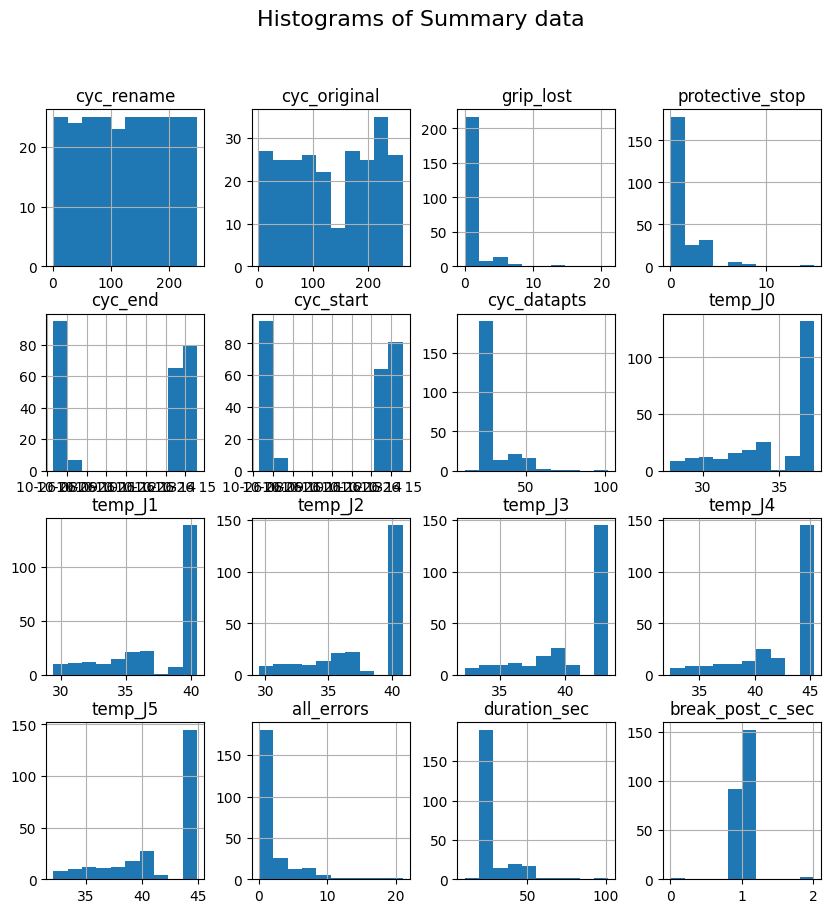

In [47]:
## histogram
summary_df.hist(bins= 10, figsize=(10,10))
plt.suptitle('Histograms of Summary data', fontsize=16)
plt.show()

<Figure size 1500x1500 with 0 Axes>

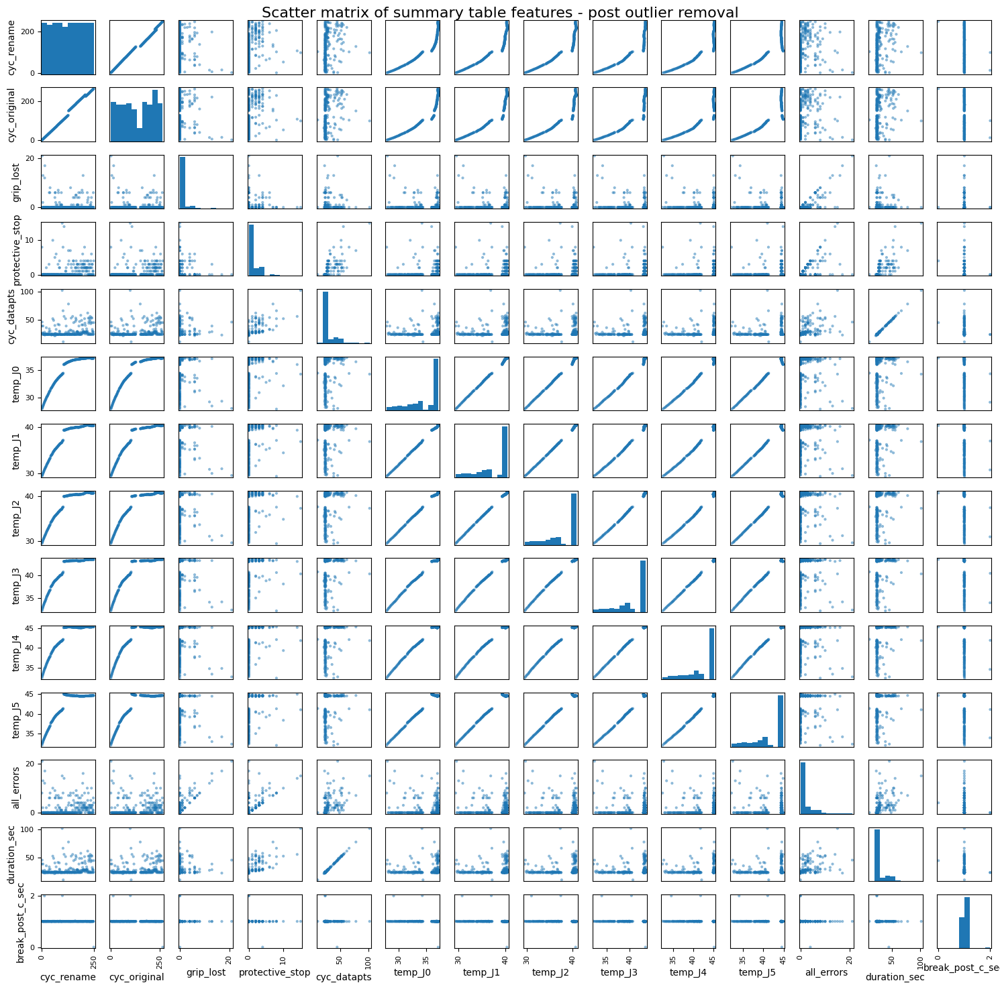

In [48]:
# Generate scatter matrix, post outlier removal, to look at feature correlations and data spread/skew per feature (central diagonal)
plt.figure(figsize=(15,15))
scatter_matrix(summary_df, figsize=(15,15))
plt.suptitle('Scatter matrix of summary table features - post outlier removal', fontsize=16)
plt.tight_layout()

- Findings of most interest from scatter matrix
    - temperatures:
        - as expected have a linear correlation to each other
        - increase with cycle number and plateau out towards end of day/higher cycles as seen in other graphs
        - denser collection of errors at higher temperatures but there are more datapoint values for the higher temperatures where they plateau
    - break post cyc data all approx 1 sec as expected
    - linear relationship between cyc_datapoints (number of datapoints per cycle) and it's duration
        - hypothesised that errors would add to cycle duration by adding further datapoints but linear relationship not as strong for errors
            - Different activities each cycle, leading to different durations per cycle regardless if error occurs?
                - or
            - Robot automatically devising next best move, making cycles length inconsistent – is timing an issue for the cycles/process?
    - no clear pattern of time passing (represented by cycle rename) and number of errors or duration, however a lot more protective stop errors seem to happen at higher cycle numbers/later in day    

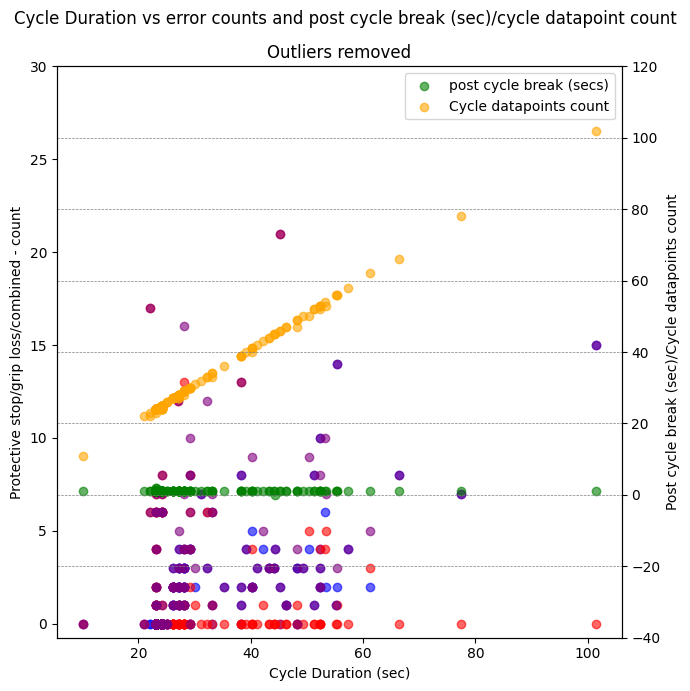

In [49]:
# Create a graph to more succintly show interesting findings from scatter matrix

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

# Plot the first scatter plot
ax1.scatter(summary_df["duration_sec"], summary_df["protective_stop"], color = "blue",  alpha = 0.6, label='Protective stop')
ax1.set_xlabel('Cycle Duration (sec)')
ax1.set_ylabel('Protective stop/grip loss/combined - count')
ax1.set_ylim(top=30)
ax1.scatter(summary_df["duration_sec"], summary_df["grip_lost"], color = "red", alpha = 0.6,label='Grip lost')
ax1.scatter(summary_df["duration_sec"], summary_df["all_errors"],  color = "purple",alpha = 0.6,label='All errors')

# #Create a secondary y-axis
ax2 = ax1.twinx()
ax2.scatter(summary_df["duration_sec"], summary_df["break_post_c_sec"],color = "green",alpha = 0.6, label='post cycle break (secs)')
ax2.scatter(summary_df["duration_sec"], summary_df["cyc_datapts"], color = "orange",alpha = 0.6,label='Cycle datapoints count')
ax2.set_ylabel('Post cycle break (sec)/Cycle datapoints count')
ax2.set_ylim(top=120, bottom = -40)

# Add a title and show the plot
plt.title("Outliers removed")
plt.suptitle('Cycle Duration vs error counts and post cycle break (sec)/cycle datapoint count')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

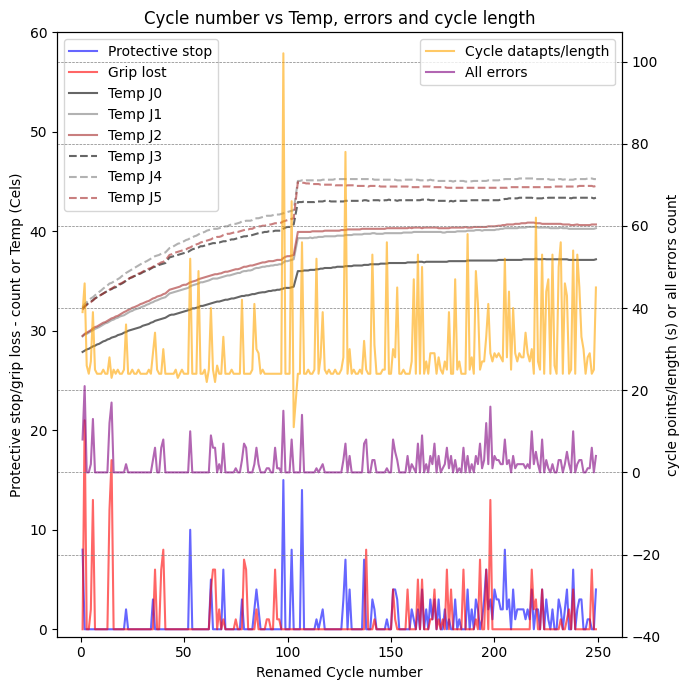

In [50]:
# show similar data but this time per new cycle i.e. equivalent to passage of time throughout the day

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

# Plot the first scatter plot
ax1.plot(summary_df["cyc_rename"], summary_df["protective_stop"], color = "blue", alpha = 0.6, label='Protective stop')
ax1.set_xlabel('Renamed Cycle number')
ax1.set_ylabel('Protective stop/grip loss - count or Temp (Cels)')
ax1.set_ylim(top=60)
ax1.plot(summary_df["cyc_rename"], summary_df["grip_lost"], color = "red", alpha = 0.6,label='Grip lost')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J0"], color = "black", alpha = 0.6,label='Temp J0')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J1"], color = "grey", alpha = 0.6,label='Temp J1')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J2"], color = "brown", alpha = 0.6,label='Temp J2')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J3"], linestyle = "--", color = "black", alpha = 0.6,label='Temp J3')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J4"], linestyle = "--",color = "grey", alpha = 0.6,label='Temp J4')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J5"], linestyle = "--", color = "brown",alpha = 0.6,label='Temp J5')
plt.legend(loc="upper left")


#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(summary_df["cyc_rename"], summary_df["cyc_datapts"], color = "orange", alpha = 0.6,label='Cycle datapts/length')
ax2.plot(summary_df["cyc_rename"], summary_df["all_errors"], color = "purple", alpha = 0.6, label='All errors')
ax2.set_ylim(bottom=-40)
ax2.set_ylabel('cycle points/length (s) or all errors count')

# Add a title and show the plot
plt.title('Cycle number vs Temp, errors and cycle length')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()


- all errors on different axis to protective stop and grip lost errors so can compare scaling directly to cycle datapoints/length
    - cyc datapts/lengths has similar pattern to all errors
    - however, even when there are no errors there are some spikes in datapoints/lengths, e.g. after cycle 50, or the amount of cycle datapts is why larger in magnitude that the all error count e.g. first peak in triple just before cycle 100

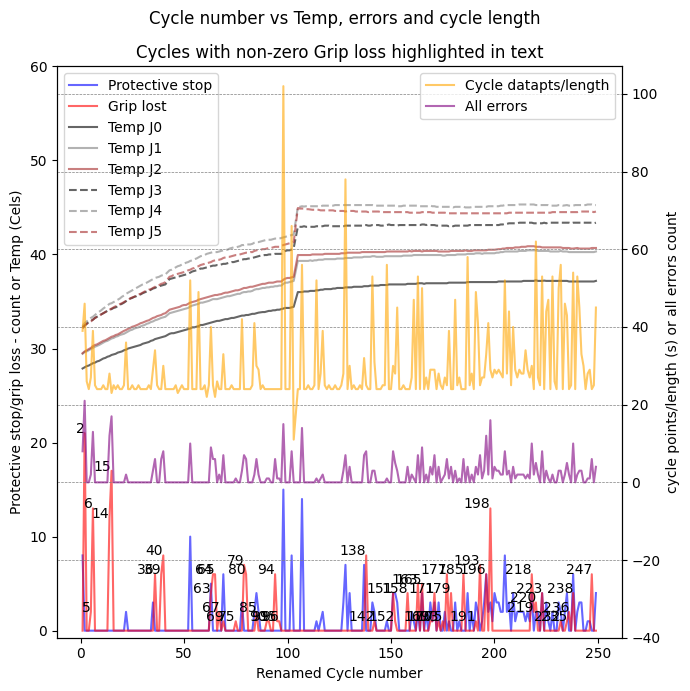

In [51]:
# same graph as above but adding text labels for grip loss to help highlight relevant cycles

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(1, 1, figsize=(7,7))

# Plot the first scatter plot
ax1.plot(summary_df["cyc_rename"], summary_df["protective_stop"], color = "blue", alpha = 0.6, label='Protective stop')
ax1.set_xlabel('Renamed Cycle number')
ax1.set_ylabel('Protective stop/grip loss - count or Temp (Cels)')
ax1.set_ylim(top=60)
ax1.plot(summary_df["cyc_rename"], summary_df["grip_lost"], color = "red", alpha = 0.6,label='Grip lost')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J0"], color = "black", alpha = 0.6,label='Temp J0')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J1"], color = "grey", alpha = 0.6,label='Temp J1')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J2"], color = "brown", alpha = 0.6,label='Temp J2')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J3"], linestyle = "--", color = "black", alpha = 0.6,label='Temp J3')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J4"], linestyle = "--",color = "grey", alpha = 0.6,label='Temp J4')
ax1.plot(summary_df["cyc_rename"], summary_df["temp_J5"], linestyle = "--", color = "brown",alpha = 0.6,label='Temp J5')
plt.legend(loc="upper left")
# Add text labels to each datapoint if grip_lost > 0
for i in range(len(summary_df)):
    if summary_df.grip_lost[i] >0:
        plt.text(summary_df.cyc_rename[i], summary_df.grip_lost[i],summary_df.cyc_rename[i], fontsize=10, ha='right')
plt.legend(loc="upper left")



#Create a secondary y-axis
ax2 = ax1.twinx()
ax2.plot(summary_df["cyc_rename"], summary_df["cyc_datapts"], color = "orange", alpha = 0.6,label='Cycle datapts/length')
ax2.plot(summary_df["cyc_rename"], summary_df["all_errors"], color = "purple", alpha = 0.6, label='All errors')

ax2.set_ylim(bottom=-40)
ax2.set_ylabel('cycle points/length (s) or all errors count')

# Add a title and show the plot
plt.suptitle('Cycle number vs Temp, errors and cycle length')
plt.title('Cycles with non-zero Grip loss highlighted in text')
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

In [52]:
# Hard to read cycle names on graph and cobot users might want errors/faults in list format instead for review

# Create lists of errors/faults to display

# Initialize a list to store the applicable cycles
cyc_names_grip_lost = []

# Loop through each row in the DataFrame
for i in range(len(summary_df)):
    if summary_df.grip_lost[i] >0:
        # Append the cycle name to the list
        cyc_names_grip_lost.append(summary_df.cyc_rename[i])
    # else:
    #     # Nothing

print("These are the cycles where grip loss(es) occured: ","\n",cyc_names_grip_lost)

# Initialize a list to store the applicable cycles
cyc_names_prot_stop = []

# Loop through each row in the DataFrame

for i in range(len(summary_df)):
    if summary_df.protective_stop[i] >0:
        # Append the cycle name to the list
        cyc_names_prot_stop.append(summary_df.cyc_rename[i])

print("These are the cycles where protective stop(s) occured: ","\n",cyc_names_prot_stop)
    


These are the cycles where grip loss(es) occured:  
 [2, 5, 6, 14, 15, 36, 39, 40, 63, 64, 65, 67, 69, 75, 79, 80, 85, 90, 91, 94, 95, 96, 138, 142, 151, 152, 158, 163, 165, 169, 170, 171, 173, 175, 177, 179, 185, 191, 193, 196, 198, 218, 219, 220, 223, 232, 235, 236, 238, 247]
These are the cycles where protective stop(s) occured:  
 [1, 22, 35, 53, 63, 69, 78, 84, 85, 86, 98, 102, 107, 114, 116, 117, 127, 128, 130, 137, 141, 142, 148, 151, 152, 153, 160, 161, 163, 165, 167, 169, 170, 171, 173, 176, 178, 181, 183, 187, 189, 191, 192, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 220, 221, 223, 225, 226, 228, 231, 232, 234, 235, 238, 240, 241, 242, 245, 246, 249]


# 2.6 Visualise cycles of interest (Temp, Current, Speed) 

For select cycles plotting temperature, current and speed sensor data for each of the joints (J0-J5) in 3 seperate graphs
- Can we spot any patterns in cycles with high levels of different errors, compared to those without?
    - in the rest of this section only taken a small handpicked sample so hard to draw any conclusions, particularly without domain knowledge of exactly what robot is doing each cycle
    - generated streamlit application, containerised in Docker, that generates these graphs for all cycles. This should help with understanding robot behaviour in conjuction with talking to the cobot users and garnering more domain knowledge
        - Github files: https://github.com/Ddbol/DevAcProj_CobotOps/tree/main/streamlit_app_cobot
        - Docker repo: https://hub.docker.com/r/dboland717/cobot_run_summary
        - Zip of graphs for all cycles generated when testing app: https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/Streamlit_cobot_app_graphs_all_.zip
        - Video of application being run https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/Cobot_data_summ_app_vid.mp4

In [53]:
# sort by highest errors
summary_df.sort_values('all_errors',ascending=False).head(25)

,cyc_rename,cyc_original,grip_lost,protective_stop,cyc_end,cyc_start,duration,cyc_datapts,temp_J0,temp_J1,temp_J2,temp_J3,temp_J4,temp_J5,all_errors,break_post_cyc,duration_sec,break_post_c_sec
1,2,2,21,0.0,2022-10-26 08:18:46.310,2022-10-26 08:18:01.086,0 days 00:00:45.224000,46,28.0000,29.62500,29.6875,32.43750,32.6875,32.4375,21.0,0 days 00:00:01.007000,45.224,1.007
14,15,15,17,0.0,2022-10-26 08:24:25.936,2022-10-26 08:24:03.828,0 days 00:00:22.108000,23,29.3125,31.06250,31.2500,34.18750,34.8125,34.2500,17.0,0 days 00:00:01.005000,22.108,1.005
195,198,221,13,3.0,2022-10-26 15:07:02.712,2022-10-26 15:06:34.562,0 days 00:00:28.150000,29,37.0625,40.12500,40.5000,43.12500,45.1250,44.3750,16.0,0 days 00:00:01.003000,28.150,1.003
96,98,99,0,15.0,2022-10-26 09:03:44.466,2022-10-26 09:02:02.984,0 days 00:01:41.482000,102,34.2500,36.87500,37.3125,40.25000,41.8125,41.0000,15.0,0 days 00:00:01.007000,101.482,1.007
104,107,108,0,14.0,2022-10-26 14:21:57.077,2022-10-26 14:21:01.725,0 days 00:00:55.352000,56,36.0000,39.31250,39.9375,42.93750,45.1250,44.8750,14.0,0 days 00:00:01.006000,55.352,1.006
5,6,6,13,0.0,2022-10-26 08:20:42.870,2022-10-26 08:20:04.671,0 days 00:00:38.199000,39,28.4375,30.06250,30.2500,33.06250,33.3750,33.0625,13.0,0 days 00:00:01.006000,38.199,1.006
193,196,219,6,6.0,2022-10-26 15:05:52.346,2022-10-26 15:05:20.159,0 days 00:00:32.187000,33,37.0625,40.12500,40.4375,43.12500,45.0625,44.3750,12.0,0 days 00:00:01.001000,32.187,1.001
13,14,14,12,0.0,2022-10-26 08:24:02.825,2022-10-26 08:23:35.750,0 days 00:00:27.075000,28,29.1875,30.93750,31.1250,34.12500,34.7500,34.1250,12.0,0 days 00:00:01.003000,27.075,1.003
215,218,232,6,4.0,2022-10-26 15:17:25.257,2022-10-26 15:16:56.089,0 days 00:00:29.168000,30,37.1875,40.43750,40.8750,43.37500,45.3125,44.4375,10.0,0 days 00:00:01.004000,29.168,1.004
235,238,253,4,6.0,2022-10-26 15:30:04.519,2022-10-26 15:29:11.210,0 days 00:00:53.309000,54,37.1250,40.25000,40.6250,43.37500,45.1875,44.5000,10.0,0 days 00:00:01.001000,53.309,1.001


In [54]:
# Generate data frame of 1 cycle
# cycle 2 most errors at 21, only grip lost
df1 = dataset[dataset.cyc_rename==2]

# show table
df1.T

,39,40,41,42,43,44,45,46,47,48,...,75,76,77,78,79,80,81,82,83,84
Num,40,41,42,43,44,45,46,47,48,49,...,76,77,78,79,80,81,82,83,84,85
Timestamp,2022-10-26T08:18:01.086Z,2022-10-26T08:18:02.090Z,2022-10-26T08:18:03.097Z,2022-10-26T08:18:04.098Z,2022-10-26T08:18:05.105Z,2022-10-26T08:18:06.110Z,2022-10-26T08:18:07.112Z,2022-10-26T08:18:08.119Z,2022-10-26T08:18:09.124Z,2022-10-26T08:18:10.139Z,...,2022-10-26T08:18:37.264Z,2022-10-26T08:18:38.270Z,2022-10-26T08:18:39.275Z,2022-10-26T08:18:40.279Z,2022-10-26T08:18:41.286Z,2022-10-26T08:18:42.292Z,2022-10-26T08:18:43.295Z,2022-10-26T08:18:44.302Z,2022-10-26T08:18:45.307Z,2022-10-26T08:18:46.310Z
Current_J0,-0.11319,0.121461,-0.369926,-0.616049,0.31754,0.399679,0.109333,0.05883,0.060433,0.054825,...,0.019007,-0.17478,-0.168979,-0.184617,-0.10761,-0.074507,-0.071458,-0.066502,-0.048866,-0.21533
Temperature_T0,27.9375,28.0,27.9375,27.9375,28.0,27.9375,27.9375,27.9375,28.0,28.0,...,28.0625,28.0625,28.0625,28.0625,28.0625,28.0625,28.0625,28.0625,28.0625,28.125
Current_J1,-2.405667,-1.970343,-3.155933,-1.666499,-2.722962,-1.643698,-1.567327,-1.708336,-1.794181,-1.847944,...,-1.647111,-2.198833,-2.73541,-2.79418,-2.315706,-2.233675,-2.245758,-2.23489,-2.23875,-2.730877
Temperature_J1,29.5,29.5,29.5,29.5,29.5,29.5,29.5,29.5625,29.5625,29.5625,...,29.6875,29.625,29.6875,29.625,29.6875,29.6875,29.6875,29.6875,29.6875,29.6875
Current_J2,-1.082921,-1.413514,-1.078717,-1.622327,-0.734569,-0.669087,-0.823336,-0.788181,-0.786772,-0.831334,...,-0.827207,-0.833648,-0.665321,-0.908215,-0.977523,-1.02716,-1.060479,-1.090578,-1.099196,-0.896188
Temperature_J2,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,...,29.75,29.75,29.75,29.8125,29.75,29.75,29.75,29.75,29.75,29.75
Current_J3,-0.462625,-0.819194,-0.187146,0.0214,-0.869798,-0.863216,-0.636921,-0.653798,-0.646632,-0.58399,...,-0.821331,-0.745181,-0.317651,-0.521194,-0.461961,-0.539867,-0.568902,-0.573596,-0.575854,-0.437373
Temperature_J3,32.3125,32.3125,32.3125,32.375,32.3125,32.375,32.375,32.375,32.375,32.375,...,32.5,32.5,32.5,32.5625,32.5625,32.5,32.5625,32.5625,32.5625,32.5625


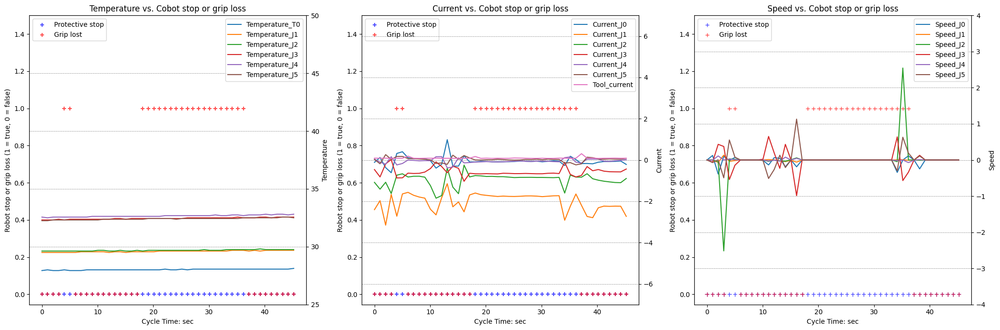

In [55]:
# define function to generate temperature, current and speed graphs for each cycle
def cycle_graphs(df1):
    # Create a figure and a set of subplots
    fig = plt.figure(figsize=(21,7))

    # ----------Temperature graph ----------------------

    # set on figure
    ax1 = fig.add_subplot(1,3,1)
    # Plot the first scatter plot
    ax1.scatter(df1["cyc_timepoint_sec"], df1["Robot_ProtectiveStop"], marker='+', color='b', alpha = 0.7, label='Protective stop')
    ax1.set_xlabel('Cycle Time: sec')
    ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
    ax1.set_ylim(top=1.5)
    ax1.scatter(df1["cyc_timepoint_sec"], df1["grip_lost_enc"], marker='+', color='r', alpha = 0.7,label='Grip lost')
    plt.legend(loc="upper left")

    #Create a secondary y-axis
    ax2 = ax1.twinx()
    ax2.plot(df1["cyc_timepoint_sec"], df1["Temperature_T0"], label='Temperature_T0')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Temperature_J1"],label='Temperature_J1')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Temperature_J2"],label='Temperature_J2')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Temperature_J3"], label='Temperature_J3') 
    ax2.plot(df1["cyc_timepoint_sec"], df1["Temperature_J4"],label='Temperature_J4')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Temperature_J5"], label='Temperature_J5')
    # set limits of max and min values so all cycles scale the same for comparison
    ax2.set_ylim(top=50, bottom = 25)
    ax2.set_ylabel('Temperature')

    # Add a title and show the plot
    plt.title('Temperature vs. Cobot stop or grip loss')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.legend(loc="upper right")

    # ----- Current graph -------

    # set on figure
    ax3 = fig.add_subplot(1,3,2)
    # Plot the first scatter plot
    ax3.scatter(df1["cyc_timepoint_sec"], df1["Robot_ProtectiveStop"], marker='+', color='b', alpha = 0.7, label='Protective stop')
    ax3.set_xlabel('Cycle Time: sec')
    ax3.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
    ax3.set_ylim(top=1.5)
    ax3.scatter(df1["cyc_timepoint_sec"], df1["grip_lost_enc"], marker='+', color='r', alpha = 0.7,label='Grip lost')
    plt.legend(loc="upper left")

    #Create a secondary y-axis
    ax4 = ax3.twinx()
    ax4.plot(df1["cyc_timepoint_sec"], df1["Current_J0"], label='Current_J0')
    ax4.plot(df1["cyc_timepoint_sec"], df1["Current_J1"], label='Current_J1')
    ax4.plot(df1["cyc_timepoint_sec"], df1["Current_J2"], label='Current_J2')
    ax4.plot(df1["cyc_timepoint_sec"], df1["Current_J3"], label='Current_J3') 
    ax4.plot(df1["cyc_timepoint_sec"], df1["Current_J4"], label='Current_J4')
    ax4.plot(df1["cyc_timepoint_sec"], df1["Current_J5"], label='Current_J5')
    ax4.plot(df1["cyc_timepoint_sec"], df1["Tool_current"], label='Tool_current')
    # set limits of max and min values so all cycles scale the same for comparison
    ax4.set_ylim(top=7, bottom = -7)
    ax4.set_ylabel('Current')

    # Add a title and show the plot
    plt.title('Current vs. Cobot stop or grip loss')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.legend(loc="upper right")

    # ----- Speed graph -------
    # set on figure
    ax1 = fig.add_subplot(1,3,3)
    # Plot the first scatter plot
    ax1.scatter(df1["cyc_timepoint_sec"], df1["Robot_ProtectiveStop"], linestyle='', marker='+', color='b', alpha = 0.7, label='Protective stop')
    ax1.set_xlabel('Cycle Time: sec')
    ax1.set_ylabel('Robot stop or grip loss (1 = true, 0 = false)')
    ax1.set_ylim(top=1.5)
    ax1.scatter(df1["cyc_timepoint_sec"], df1["grip_lost_enc"], linestyle='', marker='+', color='r', alpha = 0.7,label='Grip lost')
    plt.legend(loc="upper left")

    #Create a secondary y-axis
    ax2 = ax1.twinx()
    ax2.plot(df1["cyc_timepoint_sec"], df1["Speed_J0"], label='Speed_J0')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Speed_J1"], label='Speed_J1')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Speed_J2"], label='Speed_J2')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Speed_J3"], label='Speed_J3') 
    ax2.plot(df1["cyc_timepoint_sec"], df1["Speed_J4"], label='Speed_J4')
    ax2.plot(df1["cyc_timepoint_sec"], df1["Speed_J5"], label='Speed_J5')
    # set limits of max and min values so all cycles scale the same for comparison
    ax2.set_ylim(top=4, bottom = -4)
    ax2.set_ylabel('Speed')

    # Add a title and show the plot
    plt.title('Speed vs. Cobot stop or grip loss')
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.legend(loc="upper right")

    plt.tight_layout()
    plt.show()


cycle_graphs(df1)

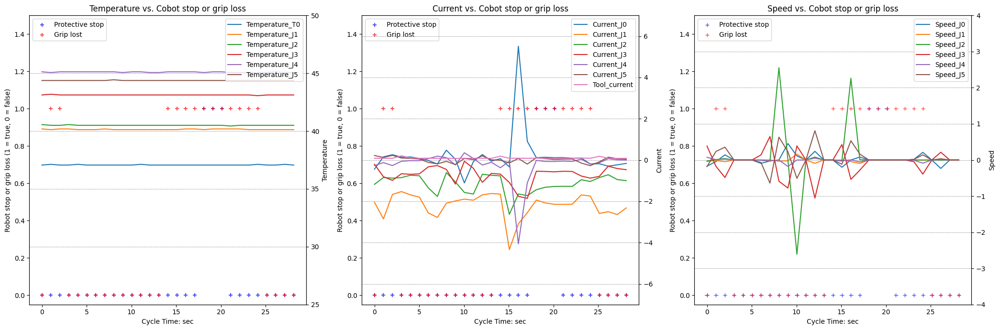

,5647,5648,5649,5650,5651,5652,5653,5654,5655,5656,...,5666,5667,5668,5669,5670,5671,5672,5673,5674,5675
Num,5648,5649,5650,5651,5652,5653,5654,5655,5656,5657,...,5667,5668,5669,5670,5671,5672,5673,5674,5675,5676
Timestamp,2022-10-26T15:06:34.562Z,2022-10-26T15:06:35.567Z,2022-10-26T15:06:36.572Z,2022-10-26T15:06:37.578Z,2022-10-26T15:06:38.581Z,2022-10-26T15:06:39.586Z,2022-10-26T15:06:40.594Z,2022-10-26T15:06:41.600Z,2022-10-26T15:06:42.603Z,2022-10-26T15:06:43.609Z,...,2022-10-26T15:06:53.664Z,2022-10-26T15:06:54.671Z,2022-10-26T15:06:55.676Z,2022-10-26T15:06:56.680Z,2022-10-26T15:06:57.685Z,2022-10-26T15:06:58.692Z,2022-10-26T15:06:59.697Z,2022-10-26T15:07:00.698Z,2022-10-26T15:07:01.705Z,2022-10-26T15:07:02.712Z
Current_J0,-0.443033,0.150994,0.256826,0.136868,0.146219,0.074623,-0.026439,-0.19393,0.476496,0.034847,...,0.132217,0.113301,0.116267,0.085339,0.092366,-0.19364,-0.181166,-0.2984,-0.234078,-0.165143
Temperature_T0,37.0625,37.125,37.0625,37.0625,37.125,37.0625,37.0625,37.0625,37.0625,37.0625,...,37.0625,37.0625,37.0625,37.0625,37.0625,37.125,37.0625,37.0625,37.125,37.0625
Current_J1,-2.046764,-2.852585,-1.668527,-1.529728,-1.688589,-1.799153,-2.568705,-2.78046,-2.091267,-1.98465,...,-2.079931,-2.146097,-2.149386,-2.139893,-1.690243,-1.745139,-2.586408,-2.503503,-2.642203,-2.320282
Temperature_J1,40.1875,40.125,40.1875,40.1875,40.125,40.125,40.125,40.1875,40.125,40.125,...,40.1875,40.1875,40.1875,40.1875,40.125,40.125,40.125,40.125,40.125,40.125
Current_J2,-1.179485,-0.848442,-0.879892,-0.85292,-0.739544,-0.76431,-1.355208,-1.766933,-0.612753,-1.062722,...,-1.320027,-1.28188,-1.27598,-1.278489,-0.956209,-1.040575,-0.851979,-0.713818,-0.948541,-1.000613
Temperature_J2,40.5625,40.5,40.5,40.5625,40.5,40.5,40.5,40.5,40.5,40.5,...,40.5,40.5,40.4375,40.5,40.5,40.5,40.5,40.5,40.5,40.5
Current_J3,-0.206951,-0.810076,-0.988122,-0.66305,-0.694229,-0.670975,-0.32919,-0.270626,-0.456582,-1.164893,...,-0.555205,-0.573241,-0.546494,-0.554902,-0.776705,-0.880285,-0.793118,-0.300846,-0.414596,-0.468408
Temperature_J3,43.125,43.1875,43.125,43.125,43.125,43.125,43.125,43.125,43.125,43.125,...,43.125,43.125,43.125,43.125,43.125,43.0625,43.125,43.125,43.125,43.125


In [56]:
# Generate data frame of 1 cycle
# cycle 198 - 13 grip lost, 3 protective
df1 = dataset[dataset.cyc_rename==198]
cycle_graphs(df1)

# show table
df1.T

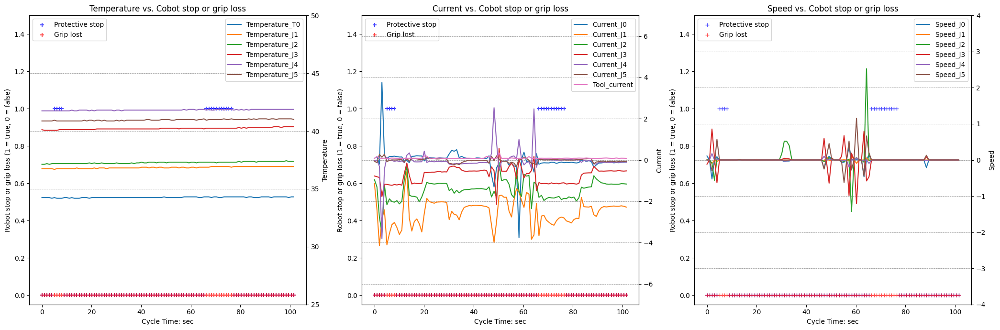

,2615,2616,2617,2618,2619,2620,2621,2622,2623,2624,...,2707,2708,2709,2710,2711,2712,2713,2714,2715,2716
Num,2616,2617,2618,2619,2620,2621,2622,2623,2624,2625,...,2708,2709,2710,2711,2712,2713,2714,2715,2716,2717
Timestamp,2022-10-26T09:02:02.984Z,2022-10-26T09:02:03.991Z,2022-10-26T09:02:04.996Z,2022-10-26T09:02:05.998Z,2022-10-26T09:02:07.001Z,2022-10-26T09:02:08.004Z,2022-10-26T09:02:09.017Z,2022-10-26T09:02:10.018Z,2022-10-26T09:02:11.019Z,2022-10-26T09:02:12.024Z,...,2022-10-26T09:03:35.420Z,2022-10-26T09:03:36.423Z,2022-10-26T09:03:37.429Z,2022-10-26T09:03:38.433Z,2022-10-26T09:03:39.442Z,2022-10-26T09:03:40.445Z,2022-10-26T09:03:41.450Z,2022-10-26T09:03:42.455Z,2022-10-26T09:03:43.463Z,2022-10-26T09:03:44.466Z
Current_J0,0.078597,0.163128,-0.201432,3.754776,0.222966,0.057557,0.17232,0.172844,0.1843,0.166107,...,-0.121921,-0.109424,-0.120803,-0.109235,-0.138007,-0.12399,-0.132254,-0.118202,-0.108539,-0.106985
Temperature_T0,34.25,34.25,34.25,34.25,34.1875,34.25,34.1875,34.1875,34.1875,34.25,...,34.25,34.3125,34.3125,34.3125,34.3125,34.3125,34.3125,34.25,34.3125,34.3125
Current_J1,-1.14511,-2.395454,-4.14042,-2.81236,-2.413321,-4.109296,-3.563728,-3.134081,-3.025656,-3.26729,...,-2.257125,-2.27216,-2.259676,-2.240088,-2.229165,-2.240937,-2.241061,-2.219923,-2.239691,-2.281673
Temperature_J1,36.75,36.75,36.75,36.75,36.75,36.6875,36.75,36.75,36.75,36.75,...,36.9375,36.9375,36.9375,36.9375,36.9375,36.9375,36.9375,36.9375,36.9375,36.9375
Current_J2,-0.952318,-1.305825,-2.797035,-3.506633,-1.203176,-2.170084,-1.88383,-2.013845,-2.043191,-1.968143,...,-1.126042,-1.163804,-1.170935,-1.164496,-1.17338,-1.174772,-1.172397,-1.147757,-1.151456,-1.163723
Temperature_J2,37.125,37.125,37.1875,37.125,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,...,37.375,37.375,37.375,37.375,37.375,37.375,37.4375,37.375,37.375,37.375
Current_J3,-0.775524,-0.809119,-0.849997,-1.773394,-1.170156,-1.185233,-1.20553,-1.226363,-1.187519,-1.209455,...,-0.540976,-0.533724,-0.527515,-0.523528,-0.536725,-0.532397,-0.512194,-0.530549,-0.539107,-0.528767
Temperature_J3,40.125,40.0625,40.0625,40.0625,40.0625,40.0625,40.0625,40.125,40.125,40.125,...,40.3125,40.375,40.375,40.375,40.3125,40.375,40.375,40.375,40.375,40.375


In [57]:
# Generate data frame of 1 cycle
# cycle 98 - 0 grip lost, 15 protective
df1 = dataset[dataset.cyc_rename==98]
cycle_graphs(df1)

# show table
df1.T

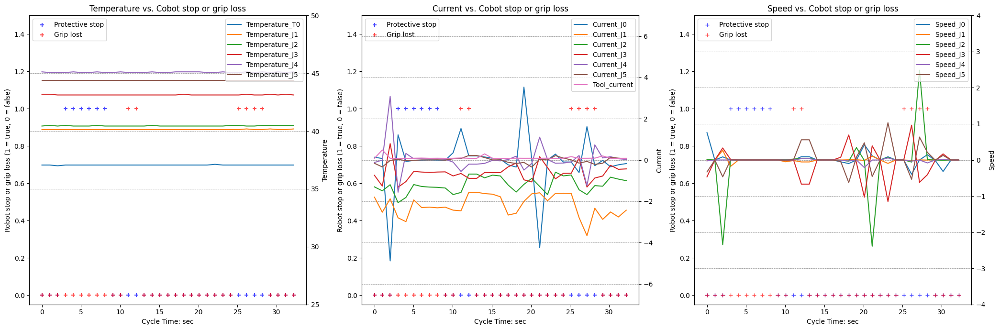

,5573,5574,5575,5576,5577,5578,5579,5580,5581,5582,...,5596,5597,5598,5599,5600,5601,5602,5603,5604,5605
Num,5574,5575,5576,5577,5578,5579,5580,5581,5582,5583,...,5597,5598,5599,5600,5601,5602,5603,5604,5605,5606
Timestamp,2022-10-26T15:05:20.159Z,2022-10-26T15:05:21.163Z,2022-10-26T15:05:22.169Z,2022-10-26T15:05:23.176Z,2022-10-26T15:05:24.181Z,2022-10-26T15:05:25.185Z,2022-10-26T15:05:26.192Z,2022-10-26T15:05:27.197Z,2022-10-26T15:05:28.203Z,2022-10-26T15:05:29.206Z,...,2022-10-26T15:05:43.291Z,2022-10-26T15:05:44.302Z,2022-10-26T15:05:45.308Z,2022-10-26T15:05:46.314Z,2022-10-26T15:05:47.320Z,2022-10-26T15:05:48.326Z,2022-10-26T15:05:49.330Z,2022-10-26T15:05:50.337Z,2022-10-26T15:05:51.342Z,2022-10-26T15:05:52.346Z
Current_J0,0.133908,0.072319,-4.887565,1.220671,-0.070946,-0.020993,-0.007378,0.003811,-0.006637,-0.011115,...,0.283931,-0.097761,-0.096618,-0.608455,1.615285,-0.274732,-0.021231,-0.329627,-0.233105,-0.172229
Temperature_T0,37.0625,37.0625,37.0,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625,...,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625,37.0625
Current_J1,-1.800368,-2.529555,-1.880468,-2.801004,-2.985918,-1.934942,-2.302877,-2.285487,-2.315282,-2.285471,...,-1.617718,-1.609335,-1.619597,-2.790101,-3.663354,-2.336432,-2.87627,-2.517763,-2.75858,-2.430317
Temperature_J1,40.125,40.125,40.125,40.125,40.125,40.125,40.125,40.125,40.125,40.125,...,40.125,40.125,40.125,40.1875,40.125,40.125,40.1875,40.125,40.125,40.1875
Current_J2,-1.302822,-1.492723,-1.195961,-2.066846,-1.814156,-1.189769,-1.282701,-1.311883,-1.325759,-1.355925,...,-0.590256,-0.770012,-0.725577,-1.442897,-1.675682,-1.240686,-1.269629,-0.831944,-0.926088,-1.001768
Temperature_J2,40.4375,40.5,40.4375,40.5,40.4375,40.4375,40.4375,40.5,40.4375,40.4375,...,40.4375,40.5,40.5,40.4375,40.4375,40.5,40.5,40.5,40.5,40.5
Current_J3,-0.742822,-1.262418,0.793103,-1.319438,-1.045203,-0.554078,-0.583691,-0.602182,-0.583293,-0.574661,...,-0.913618,-0.646738,-0.643992,0.100366,-1.308508,-0.872878,-0.776838,-0.257173,-0.450671,-0.431246
Temperature_J3,43.1875,43.1875,43.125,43.125,43.125,43.125,43.125,43.125,43.125,43.125,...,43.125,43.125,43.125,43.1875,43.125,43.125,43.1875,43.125,43.1875,43.125


In [58]:
# Generate data frame of 1 cycle
# cycle 196 - 6 grip lost, 6 protective
df1 = dataset[dataset.cyc_rename==196]
cycle_graphs(df1)

# show table
df1.T

- potentially some spikes in current and speed of some joints (J0-J5) ahead of protective stops but not obviously consistent, no notable precursor to grip loss from this sample set
- modelling error/fault prediction will likely be challenging with available information

In [59]:
# sort by least errors first to find cycles with no errors to compare
summary_df.sort_values('all_errors',ascending=True).head(25)

,cyc_rename,cyc_original,grip_lost,protective_stop,cyc_end,cyc_start,duration,cyc_datapts,temp_J0,temp_J1,temp_J2,temp_J3,temp_J4,temp_J5,all_errors,break_post_cyc,duration_sec,break_post_c_sec
123,126,127,0,0.0,2022-10-26 14:30:29.248,2022-10-26 14:30:05.107,0 days 00:00:24.141000,25,36.43750,39.5625,40.1250,43.0000,45.25000,44.62500,0.0,0 days 00:00:01.010000,24.141,1.010
106,109,110,0,0.0,2022-10-26 14:22:45.404,2022-10-26 14:22:22.250,0 days 00:00:23.154000,24,36.06250,39.3125,39.9375,42.9375,45.12500,44.81250,0.0,0 days 00:00:01.007000,23.154,1.007
107,110,111,0,0.0,2022-10-26 14:23:10.560,2022-10-26 14:22:46.411,0 days 00:00:24.149000,25,36.06250,39.3125,39.9375,42.9375,45.12500,44.81250,0.0,0 days 00:00:01.005000,24.149,1.005
108,111,112,0,0.0,2022-10-26 14:23:34.694,2022-10-26 14:23:11.565,0 days 00:00:23.129000,24,36.12500,39.3750,39.9375,42.9375,45.12500,44.78125,0.0,0 days 00:00:01.007000,23.129,1.007
109,112,113,0,0.0,2022-10-26 14:23:58.869,2022-10-26 14:23:35.701,0 days 00:00:23.168000,24,36.12500,39.3125,40.0000,42.9375,45.12500,44.75000,0.0,0 days 00:00:01.008000,23.168,1.008
110,113,114,0,0.0,2022-10-26 14:24:24.025,2022-10-26 14:23:59.877,0 days 00:00:24.148000,25,36.12500,39.3750,40.0000,42.9375,45.12500,44.75000,0.0,0 days 00:00:01.005000,24.148,1.005
112,115,116,0,0.0,2022-10-26 14:25:40.533,2022-10-26 14:25:17.381,0 days 00:00:23.152000,24,36.18750,39.4375,40.0000,43.0000,45.12500,44.75000,0.0,0 days 00:00:01.006000,23.152,1.006
105,108,109,0,0.0,2022-10-26 14:22:21.243,2022-10-26 14:21:58.083,0 days 00:00:23.160000,24,36.06250,39.3125,39.9375,43.0000,45.09375,44.87500,0.0,0 days 00:00:01.007000,23.160,1.007
115,118,119,0,0.0,2022-10-26 14:27:13.149,2022-10-26 14:26:48.988,0 days 00:00:24.161000,25,36.31250,39.5000,40.0625,43.0625,45.18750,44.68750,0.0,0 days 00:00:01.010000,24.161,1.010
117,120,121,0,0.0,2022-10-26 14:28:02.435,2022-10-26 14:27:38.296,0 days 00:00:24.139000,25,36.31250,39.5000,40.0625,43.0625,45.18750,44.68750,0.0,0 days 00:00:01.007000,24.139,1.007


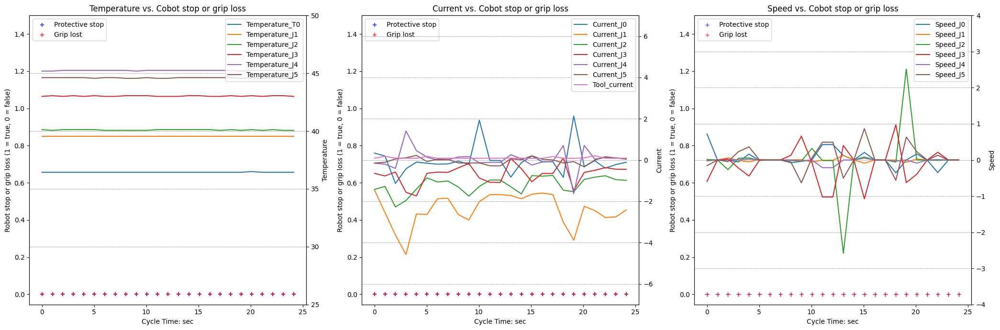

In [60]:
# Generate data frame of 1 cycle
# cycle 126 0 errors
df1 = dataset[dataset.cyc_rename==126]
cycle_graphs(df1)

## show table
#df1.T

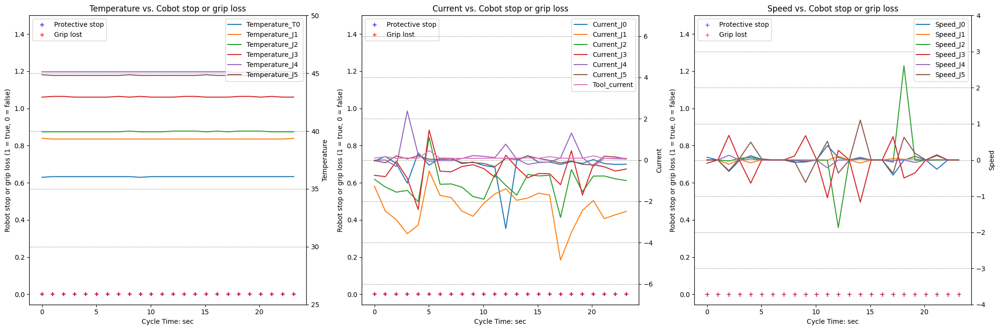

In [61]:
# Generate data frame of 1 cycle
# cycle 109 0 errors
df1 = dataset[dataset.cyc_rename==109]
cycle_graphs(df1)

## show table
#df1.T

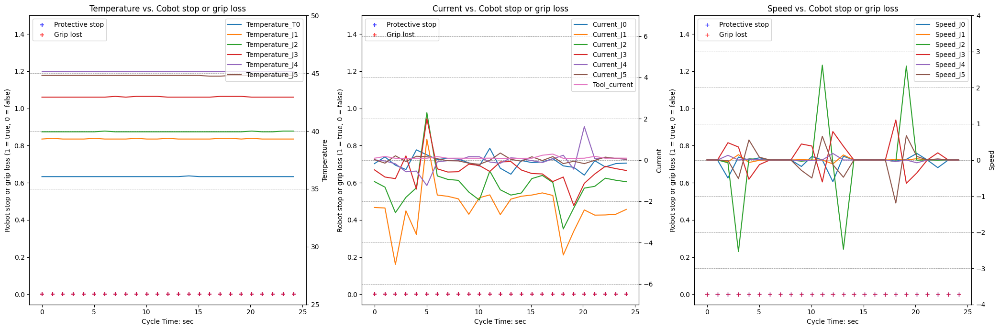

In [62]:
# Generate data frame of 1 cycle
# cycle 110 0 errors
df1 = dataset[dataset.cyc_rename==110]
cycle_graphs(df1)

## show table
#df1.T

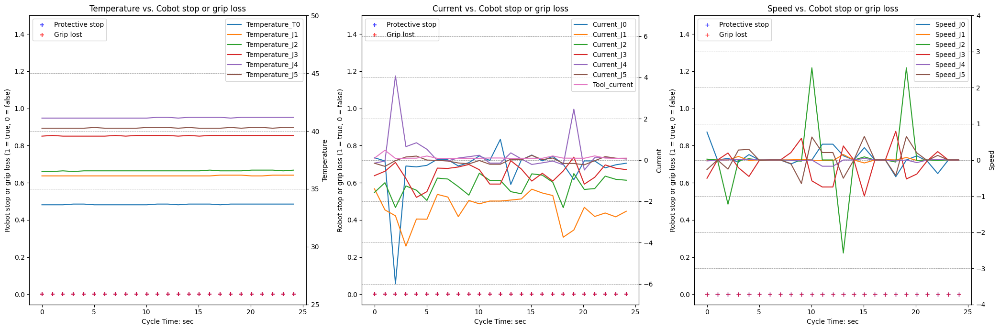

In [63]:
# Generate data frame of 1 cycle
# cycle 83 0 errors
df1 = dataset[dataset.cyc_rename==83]
cycle_graphs(df1)

## show table
#df1.T

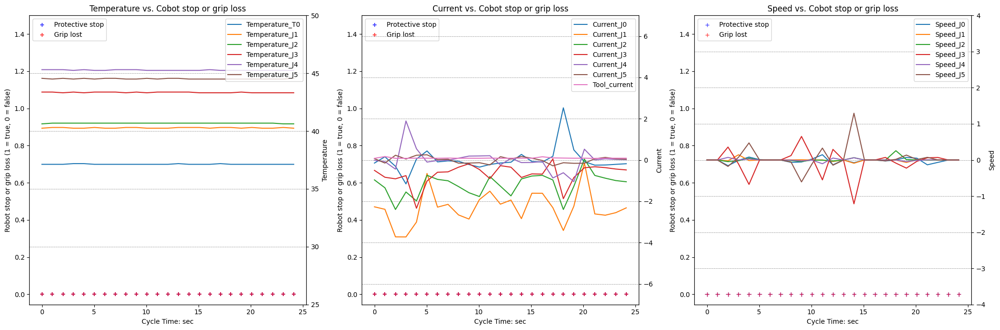

In [64]:
# Generate data frame of 1 cycle
# cycle 248 0 errors
df1 = dataset[dataset.cyc_rename==248]
cycle_graphs(df1)

## show table
#df1.T

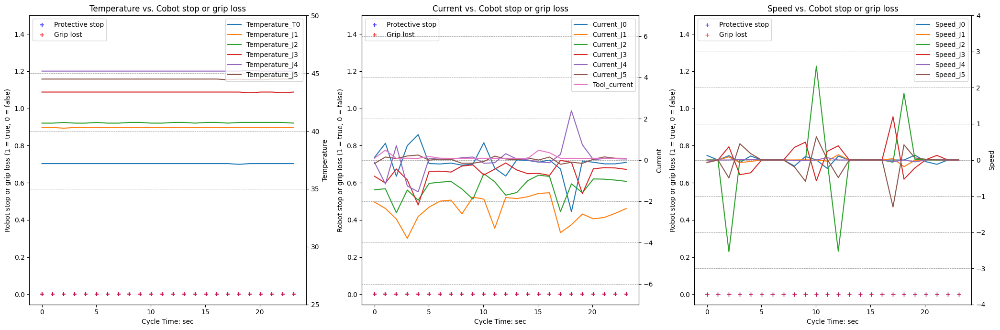

In [65]:
# Generate data frame of 1 cycle
# cycle 230 0 errors
df1 = dataset[dataset.cyc_rename==230]
cycle_graphs(df1)

## show table
#df1.T

- some similarities e.g in speed J2 (joint 2) between cycles with no errors of similar duration but not consistent even in a small sample set
- modelling error/fault prediction will likely be challenging with available information

# 3 Machine Learning prediction modelling investigation
# 3.1 Model prep and correlation matrix

In [66]:
#recheck datatypes and nulls
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   Num                   7409 non-null   int64          
 1   Timestamp             7409 non-null   object         
 2   Current_J0            7409 non-null   float64        
 3   Temperature_T0        7409 non-null   float64        
 4   Current_J1            7409 non-null   float64        
 5   Temperature_J1        7409 non-null   float64        
 6   Current_J2            7409 non-null   float64        
 7   Temperature_J2        7409 non-null   float64        
 8   Current_J3            7409 non-null   float64        
 9   Temperature_J3        7409 non-null   float64        
 10  Current_J4            7409 non-null   float64        
 11  Temperature_J4        7409 non-null   float64        
 12  Current_J5            7409 non-null   float64        
 13  Tem

                                               0                           1
Num                                            1                           2
Current_J0                              0.109628                    0.595605
Temperature_T0                            27.875                      27.875
Current_J1                             -2.024669                   -2.278456
Temperature_J1                            29.375                     29.3125
Current_J2                             -1.531442                   -0.866556
Temperature_J2                            29.375                     29.4375
Current_J3                              -0.99857                   -0.206097
Temperature_J3                            32.125                     32.1875
Current_J4                              -0.06254                   -1.062762
Temperature_J4                             32.25                       32.25
Current_J5                             -0.152622                   -0.260764

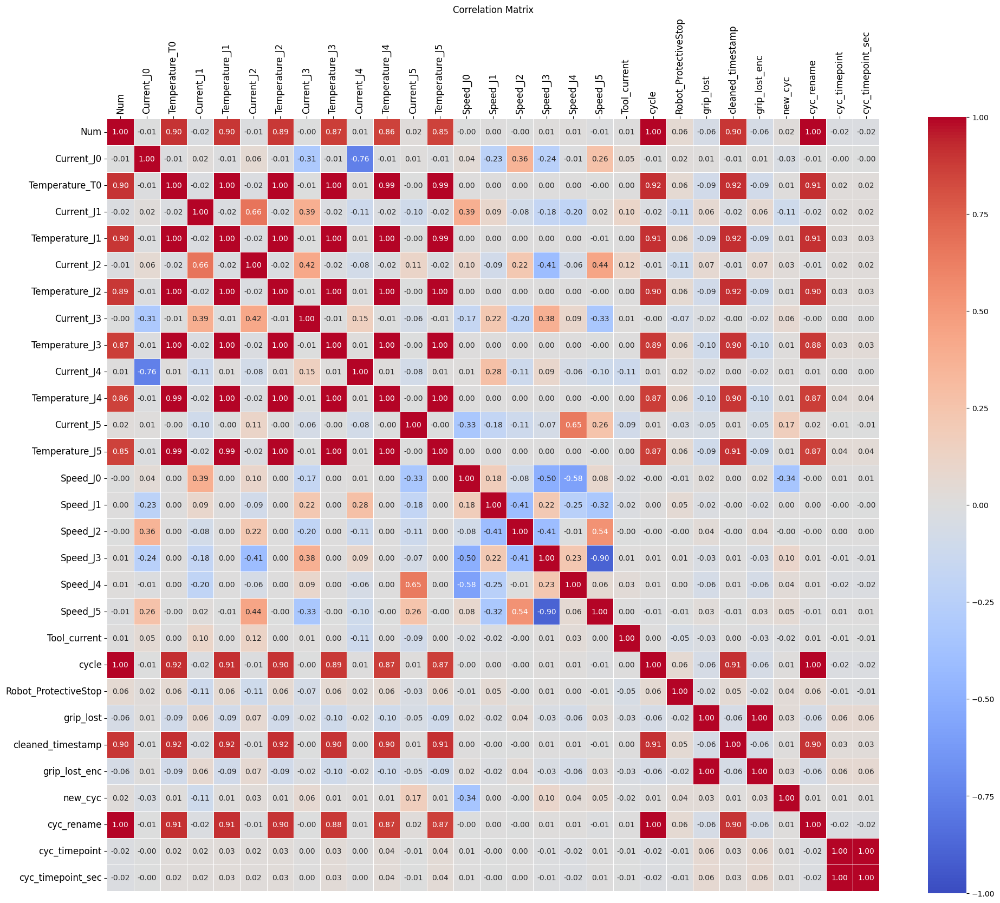

In [67]:
# drop object columns
df_drop_obj = dataset.drop(["Timestamp","date","time","time_str"], axis='columns')

print(df_drop_obj.head(2).T)

## correlation matrix all
corr_mat = df_drop_obj.corr()
# correlation matrix just looking at Robot predictive stop column
corr_matrix_results = pd.DataFrame(corr_mat["Robot_ProtectiveStop"])
print(corr_matrix_results)
# correlation matrix just looking at grip lost column
corr_matrix_results_2 = pd.DataFrame(corr_mat["grip_lost_enc"])
print(corr_matrix_results_2)
# create heatmap of full correlation matrix
fig = plt.figure(figsize=(20,20))
ax = sns.heatmap(corr_mat,  annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": .75})

plt.title('Correlation Matrix')
plt.xticks(rotation=45, ha='right')
ax.xaxis.tick_top()
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)

plt.tight_layout()
plt.show()


- Grip_lost and robot_protective stop only weakly correlate to other features that could be used for prediction
- Temperature, cycles and timestamp heavily correlate as temperature increases with time
- Some strong correlations between different currents and speeds of different joints (J0-J5)

<Figure size 2000x2000 with 0 Axes>

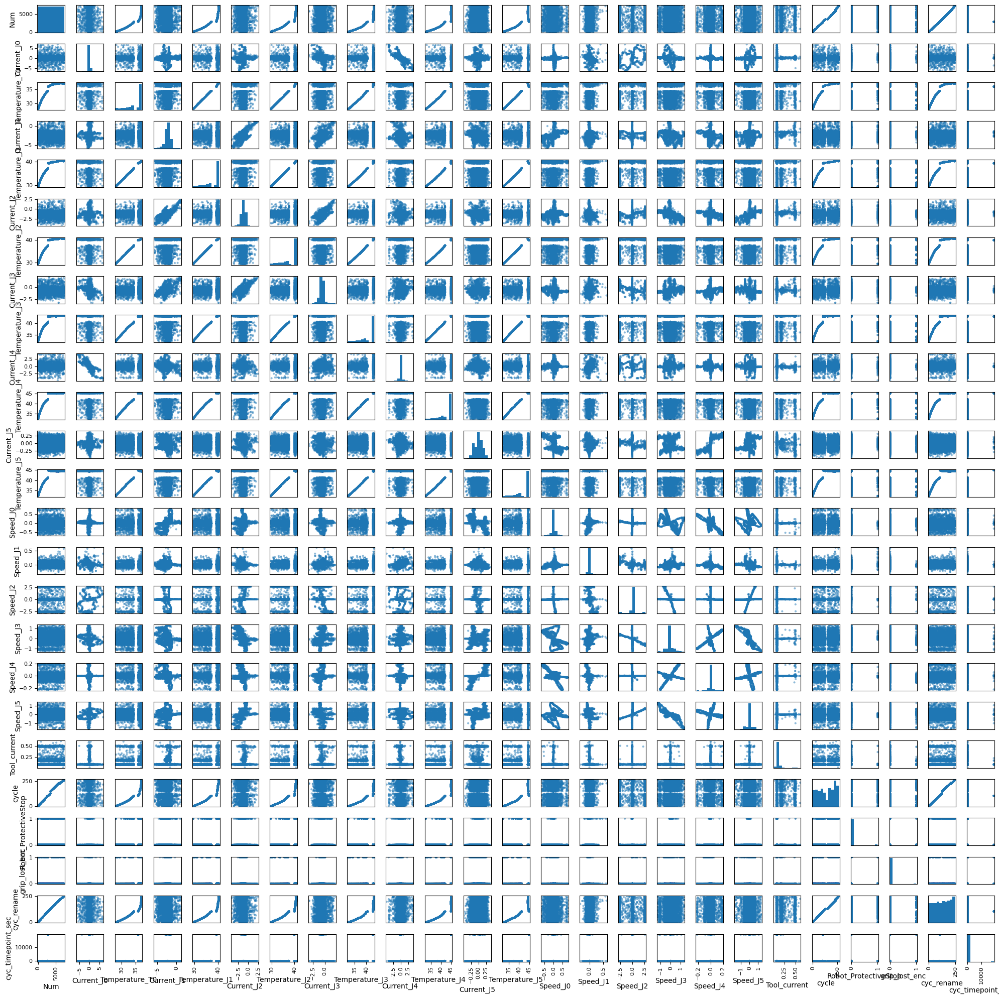

In [68]:
df_drop_obj2 = dataset.drop(["grip_lost","new_cyc"], axis='columns')
# Generate scatter matrix similar to correlation matrix 
plt.figure(figsize=(20,20))
scatter_matrix(df_drop_obj2,figsize=(20,20))
plt.tight_layout()

# 3.2 Modelling with data as a time series investigation

This is time series dataset. Ideally predict errors/faults before they happen based on previous events of day or historic data

In [69]:
# create specific modelling dataset
model_df = dataset.drop(["Num","Timestamp","grip_lost","date","time","time_str","new_cyc","cyc_timepoint"], axis='columns')

model_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Current_J0            7409 non-null   float64       
 1   Temperature_T0        7409 non-null   float64       
 2   Current_J1            7409 non-null   float64       
 3   Temperature_J1        7409 non-null   float64       
 4   Current_J2            7409 non-null   float64       
 5   Temperature_J2        7409 non-null   float64       
 6   Current_J3            7409 non-null   float64       
 7   Temperature_J3        7409 non-null   float64       
 8   Current_J4            7409 non-null   float64       
 9   Temperature_J4        7409 non-null   float64       
 10  Current_J5            7409 non-null   float64       
 11  Temperature_J5        7409 non-null   float64       
 12  Speed_J0              7409 non-null   float64       
 13  Speed_J1          

In [70]:
# Time series split code ref: https://github.com/pereirajose3/bitcoin-price-prediction-ensemble-bilstm-gru-savitzky-gola/blob/main/ensemble_bilstm_gru_savitzky_golay_filter.ipynb

# Split train data and test data
train_size = int(len(model_df)*0.7)
#validation_size = int(len(model_df)*0.15)
#train_dataset, validation_dataset, test_dataset = model_df.iloc[:train_size],model_df.iloc[train_size:train_size+validation_size], model_df.iloc[train_size+validation_size:]
train_dataset, test_dataset = model_df.iloc[:train_size], model_df.iloc[train_size:]

In [71]:
train_dataset.head()

,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,Temperature_J4,...,Speed_J3,Speed_J4,Speed_J5,Tool_current,cycle,Robot_ProtectiveStop,cleaned_timestamp,grip_lost_enc,cyc_rename,cyc_timepoint_sec
0,0.109628,27.875,-2.024669,29.3750,-1.531442,29.3750,-0.998570,32.1250,-0.062540,32.2500,...,-0.132836,-0.007479,-0.152962,0.082732,1,0.0,2022-10-26 08:17:21.847,0,1,0.000
1,0.595605,27.875,-2.278456,29.3125,-0.866556,29.4375,-0.206097,32.1875,-1.062762,32.2500,...,0.001668,-0.000767,0.000417,0.505895,1,0.0,2022-10-26 08:17:22.852,0,1,1.005
2,-0.229474,27.875,-2.800408,29.3125,-2.304336,29.4375,-0.351499,32.1250,-0.668869,32.3125,...,0.379867,0.000455,-0.496856,0.079420,1,0.0,2022-10-26 08:17:23.857,0,1,2.010
3,0.065053,27.875,-3.687768,29.3125,-1.217652,29.4375,-1.209115,32.1250,-0.819755,32.2500,...,-0.384196,0.018411,0.425559,0.083325,1,0.0,2022-10-26 08:17:24.863,0,1,3.016
4,0.884140,27.875,-2.938830,29.3750,-1.794076,29.4375,-2.356471,32.1875,-0.966427,32.3125,...,-0.353284,0.014994,0.180989,0.086379,1,0.0,2022-10-26 08:17:25.877,0,1,4.030


In [72]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5186 entries, 0 to 5185
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Current_J0            5186 non-null   float64       
 1   Temperature_T0        5186 non-null   float64       
 2   Current_J1            5186 non-null   float64       
 3   Temperature_J1        5186 non-null   float64       
 4   Current_J2            5186 non-null   float64       
 5   Temperature_J2        5186 non-null   float64       
 6   Current_J3            5186 non-null   float64       
 7   Temperature_J3        5186 non-null   float64       
 8   Current_J4            5186 non-null   float64       
 9   Temperature_J4        5186 non-null   float64       
 10  Current_J5            5186 non-null   float64       
 11  Temperature_J5        5186 non-null   float64       
 12  Speed_J0              5186 non-null   float64       
 13  Speed_J1          

In [73]:
test_dataset.reset_index(inplace=True)
test_dataset.head()

,index,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,...,Speed_J3,Speed_J4,Speed_J5,Tool_current,cycle,Robot_ProtectiveStop,cleaned_timestamp,grip_lost_enc,cyc_rename,cyc_timepoint_sec
0,5186,-0.063800,37.0625,-1.797659,40.0,-1.619969,40.375,-0.461167,43.1250,0.062761,...,0.000000,0.000000,-9.721585e-27,0.083153,206,0.0,2022-10-26 14:58:48.990,0,183,16.083
1,5187,0.256462,37.0625,-1.816256,40.0,-0.917166,40.375,-0.938396,43.1250,-0.227430,...,-0.499599,0.020874,2.851063e-01,0.078147,206,0.0,2022-10-26 14:58:50.000,0,183,17.093
2,5188,-0.101012,37.0000,-1.590985,40.0,-0.744417,40.375,-0.656259,43.0625,-0.026233,...,0.000000,0.000000,7.744029e-05,0.087738,206,0.0,2022-10-26 14:58:51.004,0,183,18.097
3,5189,-0.109194,37.0000,-1.659351,40.0,-0.789191,40.375,-0.668193,43.0625,-0.052694,...,0.000000,0.000000,0.000000e+00,0.187630,206,0.0,2022-10-26 14:58:52.013,0,183,19.106
4,5190,-0.186653,37.0000,-4.110508,40.0,-2.704949,40.375,-0.659493,43.0625,-0.253061,...,1.111762,-0.041857,-9.480807e-01,0.094017,206,0.0,2022-10-26 14:58:53.020,0,183,20.113


Dimension of train data:  (5186, 25)
Dimension of test data:  (2223, 26)


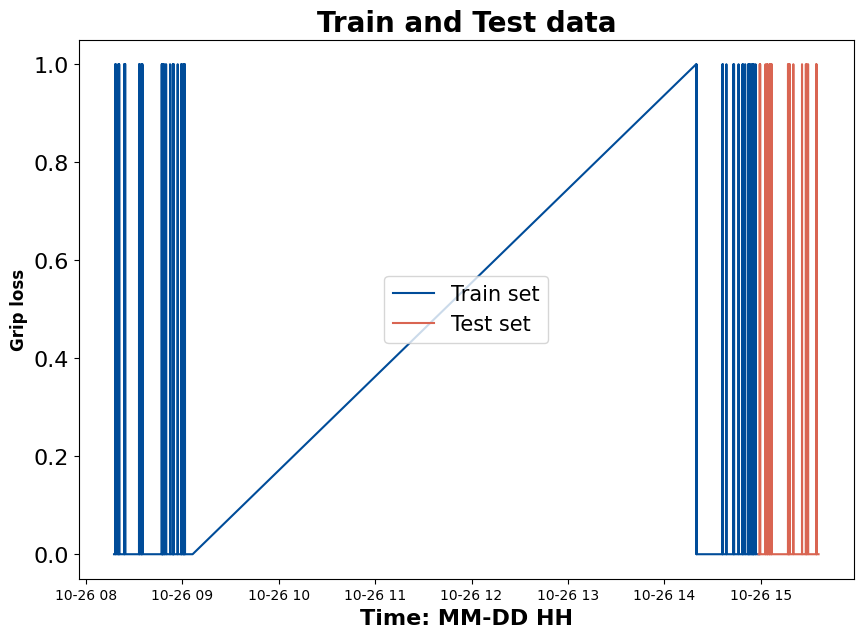

In [74]:
# plot train versus test time series split
fig, ax = plt.subplots(figsize = (10,7))
ax.plot(train_dataset.cleaned_timestamp,train_dataset.grip_lost_enc,color="#004C99")
ax.plot(test_dataset.cleaned_timestamp,test_dataset.grip_lost_enc,color="#D96552")
# Formatting
ax.set_title('Train and Test data', fontsize = 20, loc='center', fontdict=dict(weight='bold'))
ax.set_xlabel('Time: MM-DD HH', fontsize = 16, fontdict=dict(weight='bold'))
ax.set_ylabel('Grip loss', fontsize = 12, fontdict=dict(weight='bold'))
plt.tick_params(axis='y', which='major', labelsize=16)
plt.legend(['Train set','Test set'], loc='center',prop={'size': 15})
print('Dimension of train data: ',train_dataset.shape)
print('Dimension of test data: ', test_dataset.shape)

In [75]:
# drop target and additonal index column from test set
x_test_dataset = test_dataset.drop(["grip_lost_enc","index"], axis='columns')
y_test = test_dataset["grip_lost_enc"]
x_test_dataset.head()

,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,Temperature_J4,...,Speed_J2,Speed_J3,Speed_J4,Speed_J5,Tool_current,cycle,Robot_ProtectiveStop,cleaned_timestamp,cyc_rename,cyc_timepoint_sec
0,-0.063800,37.0625,-1.797659,40.0,-1.619969,40.375,-0.461167,43.1250,0.062761,45.0625,...,0.000250,0.000000,0.000000,-9.721585e-27,0.083153,206,0.0,2022-10-26 14:58:48.990,183,16.083
1,0.256462,37.0625,-1.816256,40.0,-0.917166,40.375,-0.938396,43.1250,-0.227430,45.0625,...,0.038374,-0.499599,0.020874,2.851063e-01,0.078147,206,0.0,2022-10-26 14:58:50.000,183,17.093
2,-0.101012,37.0000,-1.590985,40.0,-0.744417,40.375,-0.656259,43.0625,-0.026233,45.0625,...,0.000000,0.000000,0.000000,7.744029e-05,0.087738,206,0.0,2022-10-26 14:58:51.004,183,18.097
3,-0.109194,37.0000,-1.659351,40.0,-0.789191,40.375,-0.668193,43.0625,-0.052694,45.0000,...,0.000000,0.000000,0.000000,0.000000e+00,0.187630,206,0.0,2022-10-26 14:58:52.013,183,19.106
4,-0.186653,37.0000,-4.110508,40.0,-2.704949,40.375,-0.659493,43.0625,-0.253061,45.0625,...,-0.065196,1.111762,-0.041857,-9.480807e-01,0.094017,206,0.0,2022-10-26 14:58:53.020,183,20.113


In [76]:
x_test_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2223 entries, 0 to 2222
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Current_J0            2223 non-null   float64       
 1   Temperature_T0        2223 non-null   float64       
 2   Current_J1            2223 non-null   float64       
 3   Temperature_J1        2223 non-null   float64       
 4   Current_J2            2223 non-null   float64       
 5   Temperature_J2        2223 non-null   float64       
 6   Current_J3            2223 non-null   float64       
 7   Temperature_J3        2223 non-null   float64       
 8   Current_J4            2223 non-null   float64       
 9   Temperature_J4        2223 non-null   float64       
 10  Current_J5            2223 non-null   float64       
 11  Temperature_J5        2223 non-null   float64       
 12  Speed_J0              2223 non-null   float64       
 13  Speed_J1          

In [77]:
y_test

0       0
1       0
2       0
3       0
4       0
       ..
2218    0
2219    0
2220    0
2221    0
2222    0
Name: grip_lost_enc, Length: 2223, dtype: int64

# 3.2.1 Use AutoML Autogluon to assess timeseries ML model potential

In [78]:
# Prep train data for Autogluon
train_data = TimeSeriesDataFrame.from_data_frame(
    train_dataset,
    id_column="cycle",
    timestamp_column="cleaned_timestamp"
)
train_data

Current_J0  Temperature_T0  Current_J1  \
item_id timestamp                                                         
1       2022-10-26 08:17:21.847    0.109628          27.875   -2.024669   
        2022-10-26 08:17:22.852    0.595605          27.875   -2.278456   
        2022-10-26 08:17:23.857   -0.229474          27.875   -2.800408   
        2022-10-26 08:17:24.863    0.065053          27.875   -3.687768   
        2022-10-26 08:17:25.877    0.884140          27.875   -2.938830   
...                                     ...             ...         ...   
206     2022-10-26 14:58:43.965   -0.146595          37.000   -2.702577   
        2022-10-26 14:58:44.967   -0.161646          37.000   -1.720131   
        2022-10-26 14:58:45.972    1.192191          37.000   -1.893466   
        2022-10-26 14:58:46.978   -0.434000          37.000   -3.356204   
        2022-10-26 14:58:47.983   -0.750556          37.000   -1.735297   

                                 Temperature_J1  Current_J2  Temperature_J2  \
item_id timestamp                                                             
1       2022-10-26 08:17:21.847         29.3750   -1.531442         29.3750   
        2022-10-26 08:17:22.852         29.3125   -0.866556         29.4375   
        2022-10-26 08:17:23.857         29.3125   -2.304336         29.4375   
        2022-10-26 08:17:24.863         29.3125   -1.217652         29.4375   
        2022-10-26 08:17:25.877         29.3750   -1.794076         29.4375   
...                                         ...         ...             ...   
206     2022-10-26 14:58:43.965         40.0000   -1.340421         40.3750   
        2022-10-26 14:58:44.967         40.0000   -1.813756         40.3750   
        2022-10-26 14:58:45.972         40.0000   -0.761771         40.3750   
        2022-10-26 14:58:46.978         40.0000   -1.024841         40.3750   
        2022-10-26 14:58:47.983         40.0000   -1.539847         40.3750   

                                 Current_J3  Temperature_J3  Current_J4  \
item_id timestamp                                                         
1       2022-10-26 08:17:21.847   -0.998570         32.1250   -0.062540   
        2022-10-26 08:17:22.852   -0.206097         32.1875   -1.062762   
        2022-10-26 08:17:23.857   -0.351499         32.1250   -0.668869   
        2022-10-26 08:17:24.863   -1.209115         32.1250   -0.819755   
        2022-10-26 08:17:25.877   -2.356471         32.1875   -0.966427   
...                                     ...             ...         ...   
206     2022-10-26 14:58:43.965   -0.293405         43.0625    0.153792   
        2022-10-26 14:58:44.967   -0.217225         43.0625    0.212688   
        2022-10-26 14:58:45.972   -0.600283         43.1250   -0.173277   
        2022-10-26 14:58:46.978   -0.376235         43.0625   -0.104695   
        2022-10-26 14:58:47.983   -0.019216         43.0625    0.271986   

                                 Temperature_J4  ...  Speed_J1  Speed_J2  \
item_id timestamp                                ...                       
1       2022-10-26 08:17:21.847         32.2500  ... -0.000490  0.001310   
        2022-10-26 08:17:22.852         32.2500  ... -0.000304  0.002185   
        2022-10-26 08:17:23.857         32.3125  ...  0.007795 -2.535874   
        2022-10-26 08:17:24.863         32.2500  ... -0.004911 -0.009096   
        2022-10-26 08:17:25.877         32.3125  ...  0.005567  0.001138   
...                                         ...  ...       ...       ...   
206     2022-10-26 14:58:43.965         45.0625  ...  0.004784 -0.023557   
        2022-10-26 14:58:44.967         45.0000  ...  0.006473 -0.026157   
        2022-10-26 14:58:45.972         45.0000  ... -0.000376  2.572492   
        2022-10-26 14:58:46.978         45.0625  ... -0.020655 -0.018111   
        2022-10-26 14:58:47.983         45.0625  ...  0.142866 -2.518907   

                                 Speed_J3  Speed_J4  Speed_J5  T

In [79]:
# make time to be regular seconds frequency
df_regular_train = train_data.convert_frequency(freq="s")
df_regular_train

Current_J0  Temperature_T0  Current_J1  \
item_id timestamp                                                     
1       2022-10-26 08:17:21    0.109628          27.875   -2.024669   
        2022-10-26 08:17:22    0.595605          27.875   -2.278456   
        2022-10-26 08:17:23   -0.229474          27.875   -2.800408   
        2022-10-26 08:17:24    0.065053          27.875   -3.687768   
        2022-10-26 08:17:25    0.884140          27.875   -2.938830   
...                                 ...             ...         ...   
206     2022-10-26 14:58:43   -0.146595          37.000   -2.702577   
        2022-10-26 14:58:44   -0.161646          37.000   -1.720131   
        2022-10-26 14:58:45    1.192191          37.000   -1.893466   
        2022-10-26 14:58:46   -0.434000          37.000   -3.356204   
        2022-10-26 14:58:47   -0.750556          37.000   -1.735297   

                             Temperature_J1  Current_J2  Temperature_J2  \
item_id timestamp                                                         
1       2022-10-26 08:17:21         29.3750   -1.531442         29.3750   
        2022-10-26 08:17:22         29.3125   -0.866556         29.4375   
        2022-10-26 08:17:23         29.3125   -2.304336         29.4375   
        2022-10-26 08:17:24         29.3125   -1.217652         29.4375   
        2022-10-26 08:17:25         29.3750   -1.794076         29.4375   
...                                     ...         ...             ...   
206     2022-10-26 14:58:43         40.0000   -1.340421         40.3750   
        2022-10-26 14:58:44         40.0000   -1.813756         40.3750   
        2022-10-26 14:58:45         40.0000   -0.761771         40.3750   
        2022-10-26 14:58:46         40.0000   -1.024841         40.3750   
        2022-10-26 14:58:47         40.0000   -1.539847         40.3750   

                             Current_J3  Temperature_J3  Current_J4  \
item_id timestamp                                                     
1       2022-10-26 08:17:21   -0.998570         32.1250   -0.062540   
        2022-10-26 08:17:22   -0.206097         32.1875   -1.062762   
        2022-10-26 08:17:23   -0.351499         32.1250   -0.668869   
        2022-10-26 08:17:24   -1.209115         32.1250   -0.819755   
        2022-10-26 08:17:25   -2.356471         32.1875   -0.966427   
...                                 ...             ...         ...   
206     2022-10-26 14:58:43   -0.293405         43.0625    0.153792   
        2022-10-26 14:58:44   -0.217225         43.0625    0.212688   
        2022-10-26 14:58:45   -0.600283         43.1250   -0.173277   
        2022-10-26 14:58:46   -0.376235         43.0625   -0.104695   
        2022-10-26 14:58:47   -0.019216         43.0625    0.271986   

                             Temperature_J4  ...  Speed_J1  Speed_J2  \
item_id timestamp                            ...                       
1       2022-10-26 08:17:21         32.2500  ... -0.000490  0.001310   
        2022-10-26 08:17:22         32.2500  ... -0.000304  0.002185   
        2022-10-26 08:17:23         32.3125  ...  0.007795 -2.535874   
        2022-10-26 08:17:24         32.2500  ... -0.004911 -0.009096   
        2022-10-26 08:17:25         32.3125  ...  0.005567  0.001138   
...                                     ...  ...       ...       ...   
206     2022-10-26 14:58:43         45.0625  ...  0.004784 -0.023557   
        2022-10-26 14:58:44         45.0000  ...  0.006473 -0.026157   
        2022-10-26 14:58:45         45.0000  ... -0.000376  2.572492   
        2022-10-26 14:58:46         45.0625  ... -0.020655 -0.018111   
        2022-10-26 14:58:47         45.0625  ...  0.142866 -2.518907   

                             Speed_J3  Speed_J4  Speed_J5  Tool_current  \
item_id timestamp                                                         
1       2022-10-26 08:17:21 -0.132836 -0.007479 -0.152962      0.082732   
        2022-10-26 08:17:22  0.001668 -0.00

In [80]:
## AutoGluon hashed out as ran on 21 Mar 2025 data saved here: https://github.com/Ddbol/DevAcProj_CobotOps/tree/main/autogluon
# # run predictor
# predictor = TimeSeriesPredictor(
#     prediction_length=6014,
#     path="autogluon",
#     target="grip_lost_enc",
#     eval_metric="MASE",
# )

# predictor.fit(
#     df_regular_train,
#     presets="medium_quality",
#     time_limit=600,
# )

Output from: https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/autogluon/logs/predictor_log.txt

Training complete. Models trained: ['Naive', 'SeasonalNaive', 'ETS', 'Theta']
Total runtime: 269.70 s
Best model: Naive
Best model score: nan

Autogluon not returning any viable time series ML models with data provided. Inspiration for alternate approach from this reference https://stackoverflow.com/questions/44744584/multiple-time-series-with-binary-grip_lost_enc-prediction. Transform the dataset so end up with a problem that could be solved with traditional classification algorithms (Random Forest, boosting, ...). This approach requires that the data is labeled. Each row of the transformed dataset will represent the information associated to each TRUE or FALSE grip_lost_enc in the training dataset. Each row will be an unique event and will have variable at time t (time when you recorded the response of that row), the variable at time t-T (lag).

# 3.3 Classic Tabular ML modelling invesigation using lagged features
# 3.3.1 Generate lagged features per datapoint using data from previous datapoints

In [81]:
dataset.T

,0,1,2,3,4,5,6,7,8,9,...,7399,7400,7401,7402,7403,7404,7405,7406,7407,7408
Num,1,2,3,4,5,6,7,8,9,10,...,7400,7401,7402,7403,7404,7405,7406,7407,7408,7409
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T15:35:57.524Z,2022-10-26T15:35:58.527Z,2022-10-26T15:35:59.529Z,2022-10-26T15:36:00.539Z,2022-10-26T15:36:01.549Z,2022-10-26T15:36:02.555Z,2022-10-26T15:36:03.562Z,2022-10-26T15:36:04.571Z,2022-10-26T15:36:05.572Z,2022-10-26T15:36:06.580Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.189909,-0.051396,-0.192624,-0.217085,-0.131406,-0.109017,-0.098536,-0.1211,-0.12937,-0.134429
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.125
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.495173,-2.849013,-2.526635,-2.628725,-2.367134,-2.261695,-2.251992,-2.280791,-2.269061,-2.244449
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,40.3125,40.3125,40.3125,40.25,40.3125,40.3125,40.3125,40.25,40.3125,40.3125
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.596931,-0.830781,-0.92836,-0.962782,-1.037989,-1.082678,-1.09442,-1.121319,-1.09161,-1.09895
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-1.573144,-0.387453,-0.356138,-0.399277,-0.470314,-0.494714,-0.515789,-0.502406,-0.491158,-0.502397
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,43.375,43.375,43.375,43.3125,43.3125,43.375,43.375,43.375,43.375,43.375


In [82]:
# Generate new features looking back at speed and current in previous 10 rows and taking value of highest magnitude (positive or negative)
columns_to_update = ['Current_J0', 'Current_J1', 'Current_J2','Current_J3', 'Current_J4','Current_J5','Speed_J0', 'Speed_J1', 'Speed_J2','Speed_J3','Speed_J4','Speed_J5','Tool_current']

# Initialize a list to store the largest magnitudes
largest_values = []

# Loop through each column and for each column each row in the DataFrame
for col in columns_to_update:
    for i in range(len(dataset)):
        if i < 10:
            # If there are less than 10 preceding rows, consider all available preceding rows
            preceding_values = dataset[col][:i]
        else:
            # Otherwise, consider the preceding 10 rows
            preceding_values = dataset[col][i-10:i]
        
        # Find the largest magnitude value (positive or negative) in the preceding rows
        if not preceding_values.empty:
            max = preceding_values.max()
            min = preceding_values.min()
            if abs(min) > max:
                largest_value = min
            else:
                largest_value = max
        else:
            largest_value = dataset[col][i]  # If no preceding rows, set as value of that row

        
        # Append the largest value to the list
        largest_values.append(largest_value)

    # Add the largest values as a new column in the DataFrame
    dataset[col+'largest_prec'] = largest_values
    # reset list for next column
    largest_values = []

#show table
dataset.T


,0,1,2,3,4,5,6,7,8,9,...,7399,7400,7401,7402,7403,7404,7405,7406,7407,7408
Num,1,2,3,4,5,6,7,8,9,10,...,7400,7401,7402,7403,7404,7405,7406,7407,7408,7409
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T15:35:57.524Z,2022-10-26T15:35:58.527Z,2022-10-26T15:35:59.529Z,2022-10-26T15:36:00.539Z,2022-10-26T15:36:01.549Z,2022-10-26T15:36:02.555Z,2022-10-26T15:36:03.562Z,2022-10-26T15:36:04.571Z,2022-10-26T15:36:05.572Z,2022-10-26T15:36:06.580Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.189909,-0.051396,-0.192624,-0.217085,-0.131406,-0.109017,-0.098536,-0.1211,-0.12937,-0.134429
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.1875,37.125
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.495173,-2.849013,-2.526635,-2.628725,-2.367134,-2.261695,-2.251992,-2.280791,-2.269061,-2.244449
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,40.3125,40.3125,40.3125,40.25,40.3125,40.3125,40.3125,40.25,40.3125,40.3125
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.596931,-0.830781,-0.92836,-0.962782,-1.037989,-1.082678,-1.09442,-1.121319,-1.09161,-1.09895
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,40.625,40.6875,40.6875,40.6875,40.625,40.6875,40.6875,40.6875,40.625,40.6875
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-1.573144,-0.387453,-0.356138,-0.399277,-0.470314,-0.494714,-0.515789,-0.502406,-0.491158,-0.502397
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,43.375,43.375,43.375,43.3125,43.3125,43.375,43.375,43.375,43.375,43.375


In [83]:
# For errors/faults generate new features counting up the number of datapoints where there hasn't been an error

# Initialize the result column with zeros
dataset["grip_errcount"] = 0

# Iterate through the DataFrame and apply the condition
for i in range(1, len(dataset)):
    # if grip_lost on previous row is false increase the counter others fault occured, set to -1
    if not dataset.at[i-1, 'grip_lost']:
        dataset.at[i, 'grip_errcount'] = dataset.at[i-1, 'grip_errcount'] + 1
    else:
        dataset.at[i, 'grip_errcount'] = -1


dataset.head(50).T

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Num,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T08:18:02.090Z,2022-10-26T08:18:03.097Z,2022-10-26T08:18:04.098Z,2022-10-26T08:18:05.105Z,2022-10-26T08:18:06.110Z,2022-10-26T08:18:07.112Z,2022-10-26T08:18:08.119Z,2022-10-26T08:18:09.124Z,2022-10-26T08:18:10.139Z,2022-10-26T08:18:11.144Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,0.121461,-0.369926,-0.616049,0.31754,0.399679,0.109333,0.05883,0.060433,0.054825,-0.038766
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,28.0,27.9375,27.9375,28.0,27.9375,27.9375,27.9375,28.0,28.0,28.0
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-1.970343,-3.155933,-1.666499,-2.722962,-1.643698,-1.567327,-1.708336,-1.794181,-1.847944,-2.3883
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,29.5,29.5,29.5,29.5,29.5,29.5,29.5625,29.5625,29.5625,29.5625
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.413514,-1.078717,-1.622327,-0.734569,-0.669087,-0.823336,-0.788181,-0.786772,-0.831334,-1.242574
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.625,29.6875
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-0.819194,-0.187146,0.0214,-0.869798,-0.863216,-0.636921,-0.653798,-0.646632,-0.58399,-0.414694
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,32.3125,32.3125,32.375,32.3125,32.375,32.375,32.375,32.375,32.375,32.375


In [84]:
# For errors/faults generate new features counting up the number of datapoints where there hasn't been an error


# Initialize the result column with zeros
dataset["protect_errcount"] = 0

# Iterate through the DataFrame and apply the condition
for i in range(1, len(dataset)):
    # if robot_predictive_stop on previous row is 0/false increase the counter others fault occured, set to -1
    if dataset.at[i-1, 'Robot_ProtectiveStop'] == 0:
        dataset.at[i, 'protect_errcount'] = dataset.at[i-1, 'protect_errcount'] + 1
    else:
        dataset.at[i, 'protect_errcount'] = -1


dataset.head(35).T

,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
Num,1,2,3,4,5,6,7,8,9,10,...,26,27,28,29,30,31,32,33,34,35
Timestamp,2022-10-26T08:17:21.847Z,2022-10-26T08:17:22.852Z,2022-10-26T08:17:23.857Z,2022-10-26T08:17:24.863Z,2022-10-26T08:17:25.877Z,2022-10-26T08:17:26.885Z,2022-10-26T08:17:27.901Z,2022-10-26T08:17:28.903Z,2022-10-26T08:17:29.905Z,2022-10-26T08:17:30.909Z,...,2022-10-26T08:17:47.011Z,2022-10-26T08:17:48.015Z,2022-10-26T08:17:49.021Z,2022-10-26T08:17:50.024Z,2022-10-26T08:17:51.027Z,2022-10-26T08:17:52.031Z,2022-10-26T08:17:53.036Z,2022-10-26T08:17:54.050Z,2022-10-26T08:17:55.055Z,2022-10-26T08:17:56.057Z
Current_J0,0.109628,0.595605,-0.229474,0.065053,0.88414,0.118961,0.086138,0.075657,-0.186848,-0.158912,...,-0.133972,-0.132555,-0.137326,-0.143478,-0.138684,-0.09443,-0.06435,-0.083762,-0.069268,0.116048
Temperature_T0,27.875,27.875,27.875,27.875,27.875,27.8125,27.875,27.875,27.875,27.875,...,27.9375,27.9375,27.9375,27.9375,27.9375,27.9375,27.9375,27.9375,27.9375,27.9375
Current_J1,-2.024669,-2.278456,-2.800408,-3.687768,-2.93883,-2.162542,-1.757647,-1.836465,-2.563738,-1.750777,...,-2.08643,-2.088287,-2.080029,-2.074727,-2.07732,-1.931087,-1.82973,-1.955184,-2.006876,-1.641061
Temperature_J1,29.375,29.3125,29.3125,29.3125,29.375,29.375,29.375,29.375,29.375,29.375,...,29.4375,29.5,29.4375,29.5,29.5,29.5,29.4375,29.5,29.5,29.5
Current_J2,-1.531442,-0.866556,-2.304336,-1.217652,-1.794076,-1.211779,-0.960634,-0.961322,-1.418934,-1.9794,...,-1.346168,-1.329862,-1.334815,-1.333999,-1.332489,-1.403645,-1.466469,-1.455391,-1.437145,-0.927237
Temperature_J2,29.375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,29.4375,...,29.5,29.5,29.5,29.5,29.5,29.5625,29.5625,29.5625,29.5625,29.5625
Current_J3,-0.99857,-0.206097,-0.351499,-1.209115,-2.356471,-0.481834,-0.48838,-0.512541,-0.262015,-0.18455,...,-0.57657,-0.579483,-0.573686,-0.562748,-0.524802,-0.544738,-0.505961,-0.513758,-0.510059,-0.85387
Temperature_J3,32.125,32.1875,32.125,32.125,32.1875,32.1875,32.1875,32.1875,32.1875,32.1875,...,32.3125,32.3125,32.3125,32.3125,32.25,32.3125,32.3125,32.3125,32.3125,32.3125


In [85]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 48 columns):
 #   Column                    Non-Null Count  Dtype          
---  ------                    --------------  -----          
 0   Num                       7409 non-null   int64          
 1   Timestamp                 7409 non-null   object         
 2   Current_J0                7409 non-null   float64        
 3   Temperature_T0            7409 non-null   float64        
 4   Current_J1                7409 non-null   float64        
 5   Temperature_J1            7409 non-null   float64        
 6   Current_J2                7409 non-null   float64        
 7   Temperature_J2            7409 non-null   float64        
 8   Current_J3                7409 non-null   float64        
 9   Temperature_J3            7409 non-null   float64        
 10  Current_J4                7409 non-null   float64        
 11  Temperature_J4            7409 non-null   float64        
 12  Curren

# 3.3.1.1 Review correlation matrix impact new features

                                                   0  \
Num                                                1   
Current_J0                                  0.109628   
Temperature_T0                                27.875   
Current_J1                                 -2.024669   
Temperature_J1                                29.375   
Current_J2                                 -1.531442   
Temperature_J2                                29.375   
Current_J3                                  -0.99857   
Temperature_J3                                32.125   
Current_J4                                  -0.06254   
Temperature_J4                                 32.25   
Current_J5                                 -0.152622   
Temperature_J5                                  32.0   
Speed_J0                                    0.295565   
Speed_J1                                    -0.00049   
Speed_J2                                     0.00131   
Speed_J3                                   -0.13

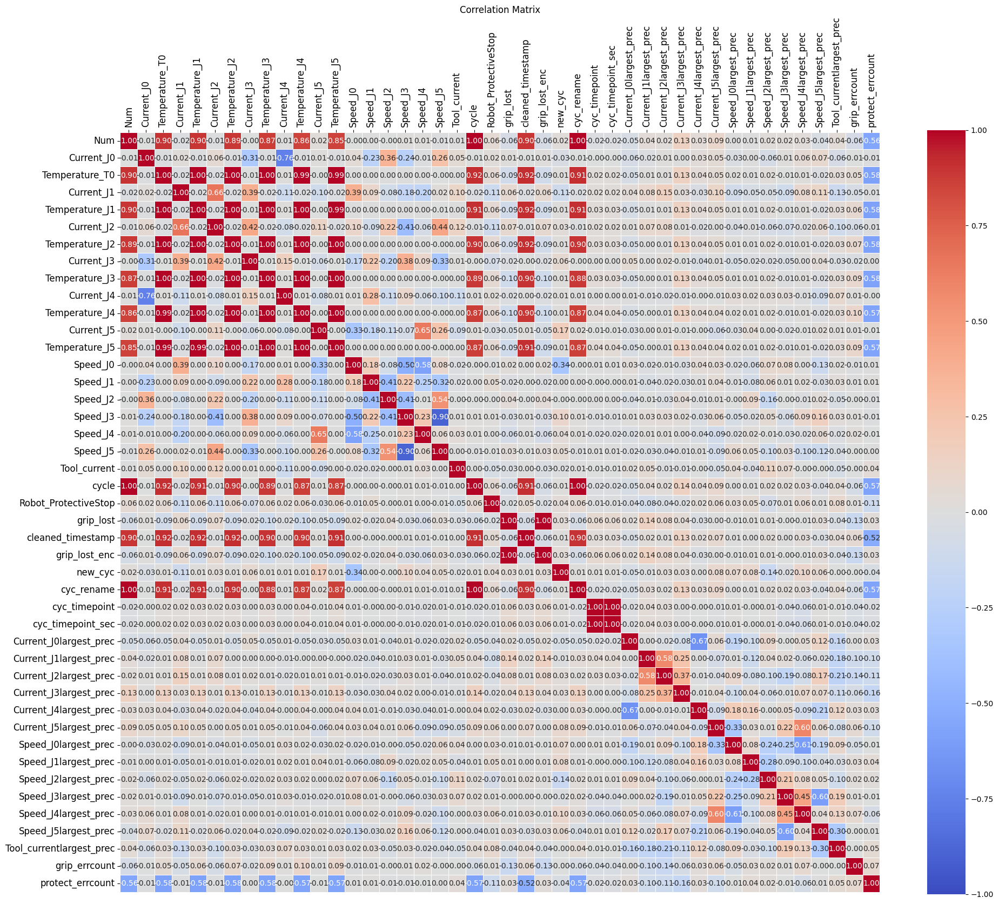

In [86]:
# drop object columns
df_drop_obj = dataset.drop(["Timestamp","date","time","time_str"], axis='columns')

print(df_drop_obj.head(2).T)

## correlation matrix all features
corr_mat = df_drop_obj.corr()
# correlation matrix just looking at Robot predictive stop column
corr_matrix_results = pd.DataFrame(corr_mat["Robot_ProtectiveStop"])
print(corr_matrix_results)
# correlation matrix just looking at grip lost column
corr_matrix_results_2 = pd.DataFrame(corr_mat["grip_lost_enc"])
print(corr_matrix_results_2)
# create heatmap of correlation matrix all
fig = plt.figure(figsize=(20,20))
ax = sns.heatmap(corr_mat,  annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": .75})

plt.title('Correlation Matrix')
plt.xticks(rotation=45, ha='right')
ax.xaxis.tick_top()
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)

plt.tight_layout()
plt.show()


- no obvious increase in correlation new features to grip_lost or Robot_Predictive stop 
- protect_errorcount shows a strong relationship to timestamp, cycles and temperature data as note an increase of these occurences as time went on 

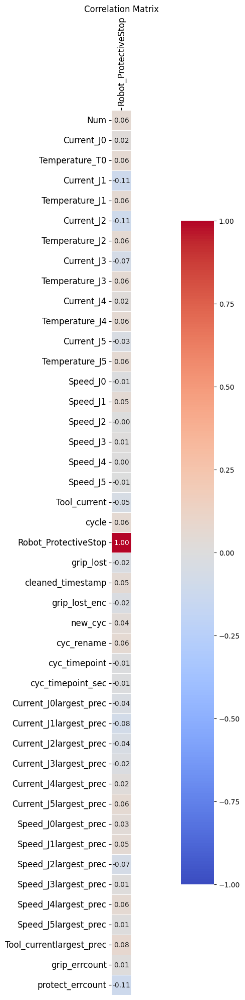

In [87]:
# create heatmap of correlation matrix for just robot protective stop (corr_matrix_results)
fig = plt.figure(figsize=(20,20))
ax = sns.heatmap(corr_matrix_results,  annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": .75})

plt.title('Correlation Matrix')
plt.xticks(rotation=45, ha='right')
ax.xaxis.tick_top()
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)

plt.tight_layout()
plt.show()

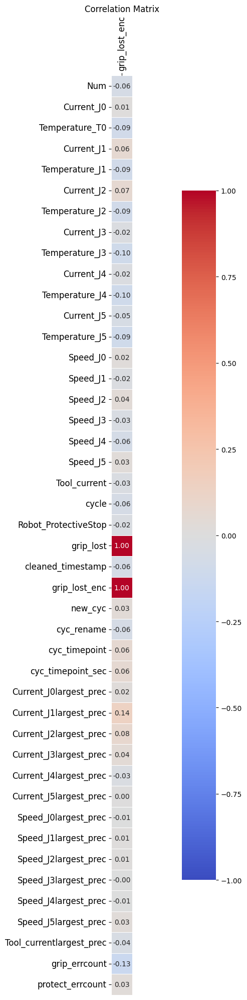

In [88]:
# create heatmap of correlation matrix for just grip_lost_enc (corr_matrix_results_2)
fig = plt.figure(figsize=(20,20))
ax = sns.heatmap(corr_matrix_results_2,  annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": .75})

plt.title('Correlation Matrix')
plt.xticks(rotation=45, ha='right')
ax.xaxis.tick_top()
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)

plt.tight_layout()
plt.show()

Comparing original features to lagged features we can see marginal increases in correlation of speed and robot protective stop and current and grip lost. These features could potentially be reviewed and refined further with domain knowledge and reviewing other data e.g. visualised cycles of temperature, current and speed (section 2.6)



<img src="https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/New_ML_feature_correlations.PNG?raw=true" alt="drawing" width="1500"/>

# 3.3.2 Tabular model prep


In [89]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 48 columns):
 #   Column                    Non-Null Count  Dtype          
---  ------                    --------------  -----          
 0   Num                       7409 non-null   int64          
 1   Timestamp                 7409 non-null   object         
 2   Current_J0                7409 non-null   float64        
 3   Temperature_T0            7409 non-null   float64        
 4   Current_J1                7409 non-null   float64        
 5   Temperature_J1            7409 non-null   float64        
 6   Current_J2                7409 non-null   float64        
 7   Temperature_J2            7409 non-null   float64        
 8   Current_J3                7409 non-null   float64        
 9   Temperature_J3            7409 non-null   float64        
 10  Current_J4                7409 non-null   float64        
 11  Temperature_J4            7409 non-null   float64        
 12  Curren

In [90]:
# generate modelling dataset, also dropping cleaned_timestamp as no longer a direct time series model but a lagged one based on previous features
model_df = dataset.drop(["Num","Timestamp","grip_lost","date","time","time_str","new_cyc","cyc_timepoint","cleaned_timestamp"], axis='columns')

model_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Current_J0                7409 non-null   float64
 1   Temperature_T0            7409 non-null   float64
 2   Current_J1                7409 non-null   float64
 3   Temperature_J1            7409 non-null   float64
 4   Current_J2                7409 non-null   float64
 5   Temperature_J2            7409 non-null   float64
 6   Current_J3                7409 non-null   float64
 7   Temperature_J3            7409 non-null   float64
 8   Current_J4                7409 non-null   float64
 9   Temperature_J4            7409 non-null   float64
 10  Current_J5                7409 non-null   float64
 11  Temperature_J5            7409 non-null   float64
 12  Speed_J0                  7409 non-null   float64
 13  Speed_J1                  7409 non-null   float64
 14  Speed_J2

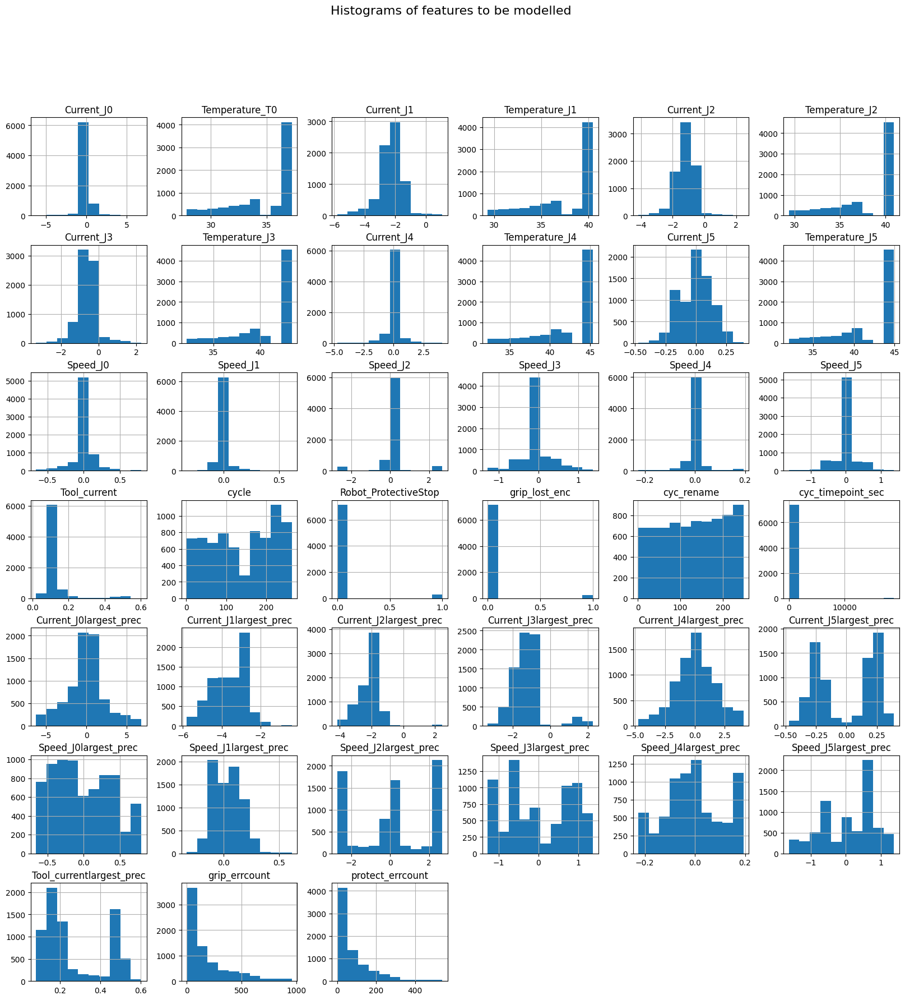

In [91]:
## histogram
model_df.hist(bins= 10, figsize=(20,20))
plt.suptitle('Histograms of features to be modelled', fontsize=16)
plt.show()

# skew in the largest_prec as concentrating up higher magnitude info at either end

In [92]:
model_df.describe()

,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,Temperature_J4,...,Current_J5largest_prec,Speed_J0largest_prec,Speed_J1largest_prec,Speed_J2largest_prec,Speed_J3largest_prec,Speed_J4largest_prec,Speed_J5largest_prec,Tool_currentlargest_prec,grip_errcount,protect_errcount
count,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,...,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000,7409.000000
mean,-0.048331,34.916124,-2.297070,37.670443,-1.199689,38.074875,-0.605457,40.947007,-0.022918,42.616353,...,0.000391,-0.013789,0.037341,0.078842,0.010754,-0.002359,0.085203,0.271231,178.426643,79.615468
std,0.832283,2.758778,0.799764,3.243383,0.609993,3.307698,0.514355,3.177794,0.629524,3.672005,...,0.244585,0.394151,0.128134,1.959041,0.800366,0.113025,0.744319,0.152479,207.430890,94.994272
min,-6.247756,27.812500,-5.808734,29.312500,-4.171966,29.375000,-3.333102,32.125000,-4.738406,32.250000,...,-0.474556,-0.656331,-0.330833,-2.733091,-1.271460,-0.226233,-1.629721,0.082732,-1.000000,-1.000000
25%,-0.195054,33.000000,-2.663567,35.375000,-1.553532,35.812500,-0.831143,38.937500,-0.126043,40.375000,...,-0.239604,-0.343685,-0.079349,-2.223610,-0.598431,-0.081471,-0.533882,0.168448,29.000000,16.000000
50%,-0.080634,36.562500,-2.233232,39.687500,-1.076901,40.187500,-0.571413,43.062500,-0.012463,45.062500,...,0.099129,-0.067251,0.013565,0.000039,-0.000893,-0.002159,0.337023,0.193909,96.000000,44.000000
75%,0.096498,37.062500,-1.778007,40.125000,-0.838398,40.437500,-0.387941,43.125000,0.086163,45.187500,...,0.230322,0.313390,0.138309,2.514413,0.792558,0.082680,0.643337,0.475342,254.000000,109.000000
max,6.806938,37.250000,1.083596,40.500000,2.464940,40.937500,2.270268,43.437500,4.089389,45.375000,...,0.392547,0.791929,0.615526,2.679848,1.363093,0.193914,1.378015,0.602054,958.000000,540.000000


In [93]:
# feature clip outlier Duration

# value is trying to be set on a copy of a slice from a DataFrame so save as copy to avoid error
model_df = model_df.copy()

# .describe gives you min and max - tell what clipping and what leaving
model_df["cyc_timepoint_sec"] = np.clip(model_df["cyc_timepoint_sec"],0,120)

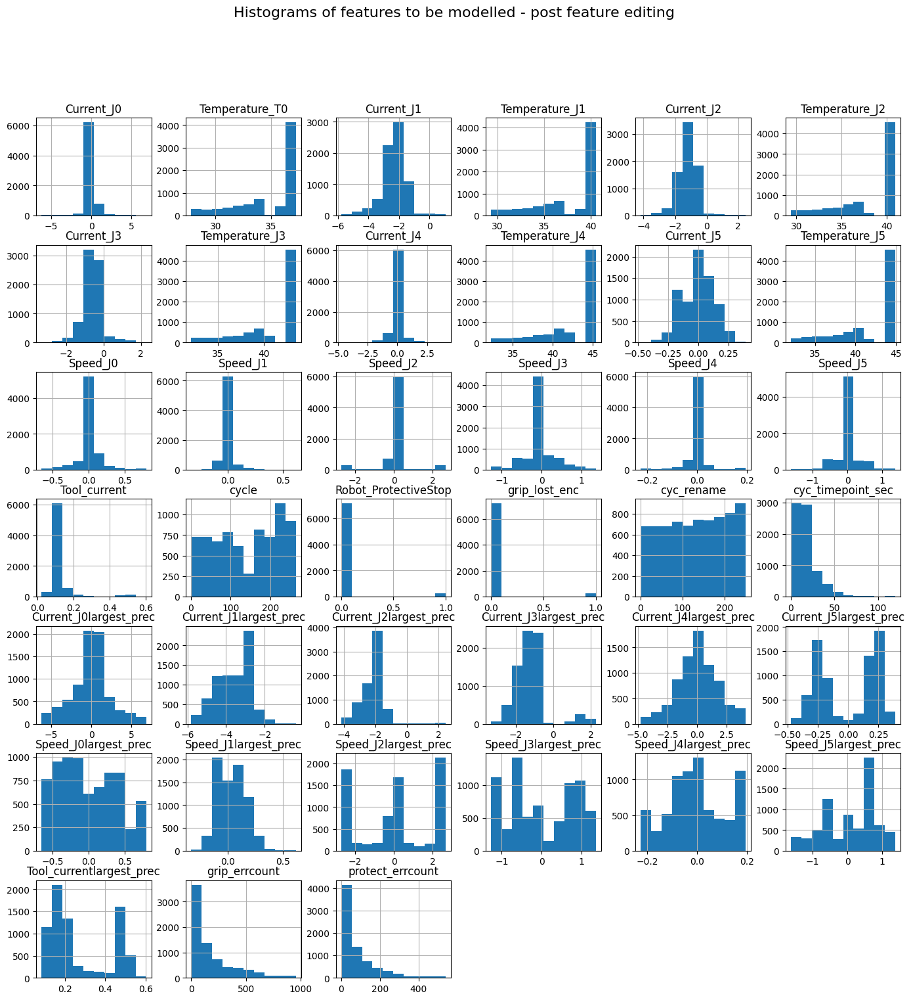

In [94]:
## histogram
model_df.hist(bins= 10, figsize=(17,17))
plt.suptitle('Histograms of features to be modelled - post feature editing', fontsize=16)
plt.show()

<img src="https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/ML%20tabular%20lagged%20features%20prep.png?raw=true" alt="drawing" width="1500"/>

- current and speed data relatively normally distributed
    - skew either side in the largest_prec features as concentrating up higher magnitude info at either end
- temperature and all features are continuous so will not modify the data to attempt to normalise the skew from continuous data


In [95]:
# Split train data and test data by time series code ref: https://github.com/pereirajose3/bitcoin-price-prediction-ensemble-bilstm-gru-savitzky-gola/blob/main/ensemble_bilstm_gru_savitzky_golay_filter.ipynb
train_size = int(len(model_df)*0.7)
#validation_size = int(len(model_df)*0.15)
#train_dataset, validation_dataset, test_dataset = model_df.iloc[:train_size],model_df.iloc[train_size:train_size+validation_size], model_df.iloc[train_size+validation_size:]
train_dataset, test_dataset = model_df.iloc[:train_size], model_df.iloc[train_size:]

print(f"Training samples: {len(train_dataset)}")
print(f"Testing samples: {len(test_dataset)}")

Training samples: 5186
Testing samples: 2223


In [96]:
test_dataset.reset_index(inplace=True)
test_dataset.head()

,index,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,...,Current_J5largest_prec,Speed_J0largest_prec,Speed_J1largest_prec,Speed_J2largest_prec,Speed_J3largest_prec,Speed_J4largest_prec,Speed_J5largest_prec,Tool_currentlargest_prec,grip_errcount,protect_errcount
0,5186,-0.063800,37.0625,-1.797659,40.0,-1.619969,40.375,-0.461167,43.1250,0.062761,...,0.231536,-0.157498,0.142866,2.572492,-0.598807,0.03606,0.650835,0.175579,113,11
1,5187,0.256462,37.0625,-1.816256,40.0,-0.917166,40.375,-0.938396,43.1250,-0.227430,...,0.231536,-0.157498,0.142866,2.572492,-0.598807,0.03606,0.650835,0.175579,114,12
2,5188,-0.101012,37.0000,-1.590985,40.0,-0.744417,40.375,-0.656259,43.0625,-0.026233,...,0.217793,0.221365,0.142866,2.572492,-0.598807,0.03606,0.650835,0.175579,115,13
3,5189,-0.109194,37.0000,-1.659351,40.0,-0.789191,40.375,-0.668193,43.0625,-0.052694,...,0.217793,0.221365,0.142866,2.572492,-0.598807,0.03606,0.650835,0.087738,116,14
4,5190,-0.186653,37.0000,-4.110508,40.0,-2.704949,40.375,-0.659493,43.0625,-0.253061,...,0.217793,0.221365,0.142866,2.572492,-0.598807,0.03606,0.650835,0.187630,117,15


In [97]:

# get rid of error : A value is trying to be set on a copy of a slice from a DataFrame
test_dataset = test_dataset.copy()

# drop index from test set
test_dataset.drop(["index"], axis='columns', inplace= True)
test_dataset.head()

,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,Temperature_J4,...,Current_J5largest_prec,Speed_J0largest_prec,Speed_J1largest_prec,Speed_J2largest_prec,Speed_J3largest_prec,Speed_J4largest_prec,Speed_J5largest_prec,Tool_currentlargest_prec,grip_errcount,protect_errcount
0,-0.063800,37.0625,-1.797659,40.0,-1.619969,40.375,-0.461167,43.1250,0.062761,45.0625,...,0.231536,-0.157498,0.142866,2.572492,-0.598807,0.03606,0.650835,0.175579,113,11
1,0.256462,37.0625,-1.816256,40.0,-0.917166,40.375,-0.938396,43.1250,-0.227430,45.0625,...,0.231536,-0.157498,0.142866,2.572492,-0.598807,0.03606,0.650835,0.175579,114,12
2,-0.101012,37.0000,-1.590985,40.0,-0.744417,40.375,-0.656259,43.0625,-0.026233,45.0625,...,0.217793,0.221365,0.142866,2.572492,-0.598807,0.03606,0.650835,0.175579,115,13
3,-0.109194,37.0000,-1.659351,40.0,-0.789191,40.375,-0.668193,43.0625,-0.052694,45.0000,...,0.217793,0.221365,0.142866,2.572492,-0.598807,0.03606,0.650835,0.087738,116,14
4,-0.186653,37.0000,-4.110508,40.0,-2.704949,40.375,-0.659493,43.0625,-0.253061,45.0625,...,0.217793,0.221365,0.142866,2.572492,-0.598807,0.03606,0.650835,0.187630,117,15


In [98]:
train_dataset.head()

,Current_J0,Temperature_T0,Current_J1,Temperature_J1,Current_J2,Temperature_J2,Current_J3,Temperature_J3,Current_J4,Temperature_J4,...,Current_J5largest_prec,Speed_J0largest_prec,Speed_J1largest_prec,Speed_J2largest_prec,Speed_J3largest_prec,Speed_J4largest_prec,Speed_J5largest_prec,Tool_currentlargest_prec,grip_errcount,protect_errcount
0,0.109628,27.875,-2.024669,29.3750,-1.531442,29.3750,-0.998570,32.1250,-0.062540,32.2500,...,-0.152622,0.295565,-0.000490,0.001310,-0.132836,-0.007479,-0.152962,0.082732,0,0
1,0.595605,27.875,-2.278456,29.3125,-0.866556,29.4375,-0.206097,32.1875,-1.062762,32.2500,...,-0.152622,0.295565,-0.000490,0.001310,-0.132836,-0.007479,-0.152962,0.082732,1,1
2,-0.229474,27.875,-2.800408,29.3125,-2.304336,29.4375,-0.351499,32.1250,-0.668869,32.3125,...,-0.260764,0.295565,-0.000490,0.002185,-0.132836,-0.007479,-0.152962,0.505895,2,2
3,0.065053,27.875,-3.687768,29.3125,-1.217652,29.4375,-1.209115,32.1250,-0.819755,32.2500,...,-0.260764,0.295565,0.007795,-2.535874,0.379867,-0.007479,-0.496856,0.505895,3,3
4,0.884140,27.875,-2.938830,29.3750,-1.794076,29.4375,-2.356471,32.1875,-0.966427,32.3125,...,-0.260764,0.295565,0.007795,-2.535874,-0.384196,0.018411,-0.496856,0.505895,4,4


In [99]:
test_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2223 entries, 0 to 2222
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Current_J0                2223 non-null   float64
 1   Temperature_T0            2223 non-null   float64
 2   Current_J1                2223 non-null   float64
 3   Temperature_J1            2223 non-null   float64
 4   Current_J2                2223 non-null   float64
 5   Temperature_J2            2223 non-null   float64
 6   Current_J3                2223 non-null   float64
 7   Temperature_J3            2223 non-null   float64
 8   Current_J4                2223 non-null   float64
 9   Temperature_J4            2223 non-null   float64
 10  Current_J5                2223 non-null   float64
 11  Temperature_J5            2223 non-null   float64
 12  Speed_J0                  2223 non-null   float64
 13  Speed_J1                  2223 non-null   float64
 14  Speed_J2

In [100]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5186 entries, 0 to 5185
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Current_J0                5186 non-null   float64
 1   Temperature_T0            5186 non-null   float64
 2   Current_J1                5186 non-null   float64
 3   Temperature_J1            5186 non-null   float64
 4   Current_J2                5186 non-null   float64
 5   Temperature_J2            5186 non-null   float64
 6   Current_J3                5186 non-null   float64
 7   Temperature_J3            5186 non-null   float64
 8   Current_J4                5186 non-null   float64
 9   Temperature_J4            5186 non-null   float64
 10  Current_J5                5186 non-null   float64
 11  Temperature_J5            5186 non-null   float64
 12  Speed_J0                  5186 non-null   float64
 13  Speed_J1                  5186 non-null   float64
 14  Speed_J2

Dimension of train data:  (5186, 39)
Dimension of test data:  (2223, 39)


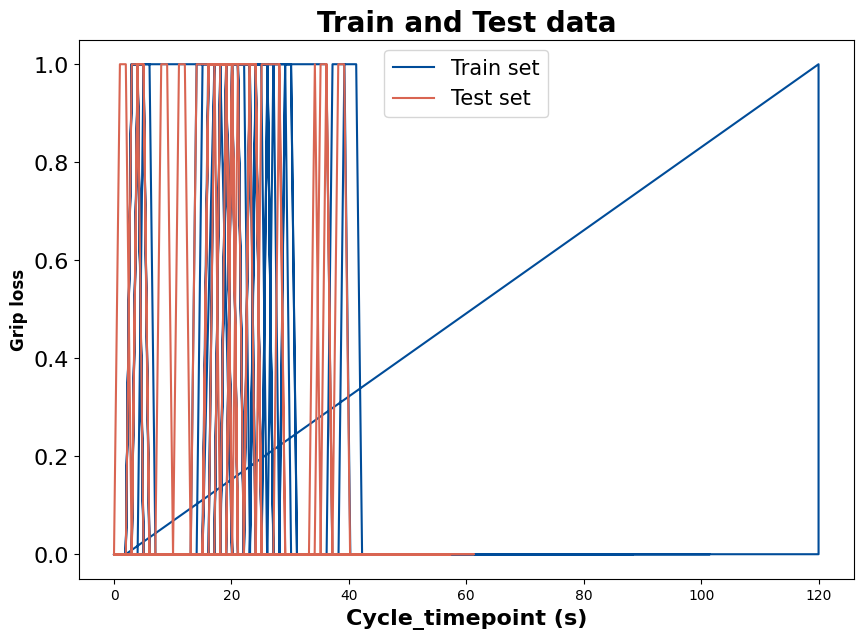

In [101]:
# plot test vs train data
fig, ax = plt.subplots(figsize = (10,7))
ax.plot(train_dataset.cyc_timepoint_sec,train_dataset.grip_lost_enc,color="#004C99")
ax.plot(test_dataset.cyc_timepoint_sec,test_dataset.grip_lost_enc,color="#D96552")
# Formatting
ax.set_title('Train and Test data', fontsize = 20, loc='center', fontdict=dict(weight='bold'))
ax.set_xlabel('Cycle_timepoint (s)', fontsize = 16, fontdict=dict(weight='bold'))
ax.set_ylabel('Grip loss', fontsize = 12, fontdict=dict(weight='bold'))
plt.tick_params(axis='y', which='major', labelsize=16)
plt.legend(['Train set','Test set'], loc='upper center',prop={'size': 15})
print('Dimension of train data: ',train_dataset.shape)
print('Dimension of test data: ', test_dataset.shape)

# 3.3.3 Initial AutoML Tabular Autogluon Investigations


In [1]:
# # Define target variable (what we want to predict)
# target = "grip_lost_enc"

# # Train the model
# predictor = TabularPredictor(label=target).fit(
#     train_data=train_dataset,
#     time_limit=300,  # 5 minutes for for better accuracy
#     presets='best_quality'  # Options: 'medium_quality', 'high_quality' (faster vs. slower)
# )

Hashed out above code line as generates large amount of text, taking over the notebook. 
Output saved to : https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/Output_1_ag-20250403_233431.txt
Also generates note "No path specified. Models will be saved in: "AutogluonModels\ag-20250403_233431" 
Specify path with code predictor = TabularPredictor(path="autogluon_tabular1",label=target).fit(as above) 

Next few code boxes show leaderboard from this output

In [103]:
#Generate predictions
y_pred = predictor.predict(test_dataset.drop(columns=[target]))

predictor.evaluate(test_dataset, silent=True)
# Evaluate accuracy
performance = predictor.evaluate(test_dataset)
print(f"Model Accuracy: {performance['accuracy']:.2f}")

Model Accuracy: 0.98


In [104]:
leaderboard = predictor.leaderboard(test_dataset)
print(leaderboard)

                      model  score_test  score_val eval_metric  \
0   RandomForestGini_BAG_L1    0.982456   0.988238    accuracy   
1     ExtraTreesGini_BAG_L2    0.982006   0.989780    accuracy   
2       WeightedEnsemble_L3    0.981556   0.990359    accuracy   
3     ExtraTreesEntr_BAG_L2    0.981556   0.989009    accuracy   
4   RandomForestGini_BAG_L2    0.981556   0.989202    accuracy   
5   RandomForestEntr_BAG_L2    0.981107   0.989780    accuracy   
6   RandomForestEntr_BAG_L1    0.980657   0.989009    accuracy   
7       WeightedEnsemble_L2    0.980657   0.989009    accuracy   
8     ExtraTrees_r42_BAG_L1    0.975709   0.983610    accuracy   
9     ExtraTreesGini_BAG_L1    0.972560   0.976089    accuracy   
10    ExtraTreesEntr_BAG_L1    0.972560   0.977825    accuracy   
11    KNeighborsUnif_BAG_L1    0.933873   0.974547    accuracy   
12    KNeighborsDist_BAG_L1    0.933873   0.976282    accuracy   

    pred_time_test  pred_time_val   fit_time  pred_time_test_marginal  \
0 

In [2]:
# # For future fit calls on this dataset, you can skip DyStack to save time: `predictor.fit(..., dynamic_stacking=False, num_stack_levels=1)` when tried to train in 2mins

# # Define target variable (what we want to predict)
# target = "grip_lost_enc"

# # Train the model
# predictor = TabularPredictor(label=target).fit(
#     train_data=train_dataset,
#     time_limit=300,  # 5 minutes increase for better accuracy
#     presets='best_quality',  # Options: 'medium_quality', 'high_quality' (faster vs. slower)
#     dynamic_stacking=False, num_stack_levels=1
# )

Hashed out above code line as generates large amount of text, taking over the notebook. 
Output saved to : https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/Output_2_ag-20250403_234001.txt
Also generates note "No path specified. Models will be saved in: "AutogluonModels\ag-20250403_234001" 
Specify path with code predictor = TabularPredictor(path="autogluon_tabular2",label=target).fit(as above) 

Next few code boxes show leaderboard from this output

In [109]:
#Generate predictions
y_pred = predictor.predict(test_dataset.drop(columns=[target]))

predictor.evaluate(test_dataset, silent=True)
# Evaluate accuracy
performance = predictor.evaluate(test_dataset)
print(f"Model Accuracy: {performance['accuracy']:.2f}")

Model Accuracy: 0.98


In [110]:
leaderboard = predictor.leaderboard(test_dataset)
print(leaderboard)

                      model  score_test  score_val eval_metric  \
0   RandomForestEntr_BAG_L2    0.983806   0.989780    accuracy   
1   RandomForestGini_BAG_L2    0.983806   0.989395    accuracy   
2       WeightedEnsemble_L3    0.982906   0.990166    accuracy   
3   RandomForestGini_BAG_L1    0.982456   0.988238    accuracy   
4     ExtraTreesGini_BAG_L2    0.982456   0.988238    accuracy   
5     ExtraTreesEntr_BAG_L2    0.982006   0.989202    accuracy   
6   RandomForestEntr_BAG_L1    0.980657   0.989009    accuracy   
7       WeightedEnsemble_L2    0.980657   0.989009    accuracy   
8     ExtraTreesEntr_BAG_L1    0.972560   0.978211    accuracy   
9     ExtraTreesGini_BAG_L1    0.972560   0.976089    accuracy   
10    KNeighborsDist_BAG_L1    0.933873   0.976282    accuracy   
11    KNeighborsUnif_BAG_L1    0.933873   0.974547    accuracy   

    pred_time_test  pred_time_val   fit_time  pred_time_test_marginal  \
0         1.025336       4.933601  24.605408                 0.13933

https://auto.gluon.ai/stable/tutorials/tabular/how-it-works.html#
How It Works
AutoML is usually associated with Hyperparameter Optimization (HPO) of one or multiple models. Or with the automatic selection of models based on the given problem. In fact, most AutoML frameworks do this.

AutoGluon is different because it doesn’t rely on HPO to achieve great performance[1]. It’s based on three main principles: (1) training a variety of different models, (2) using bagging when training those models, and (3) stack-ensembling those models to combine their predictive power into a “super” model.

Random forest and KNN came out high

# 3.3.4 Classic Tabular ML model generation

In [ ]:
#setting up train and test variables

target = "grip_lost_enc"

X_train = train_dataset.drop(columns=[target])
X_train_colnames = X_train
X_test = test_dataset.drop(columns=[target])
y_train = train_dataset[target]
y_test= test_dataset[target]

X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5186 entries, 0 to 5185
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Current_J0                5186 non-null   float64
 1   Temperature_T0            5186 non-null   float64
 2   Current_J1                5186 non-null   float64
 3   Temperature_J1            5186 non-null   float64
 4   Current_J2                5186 non-null   float64
 5   Temperature_J2            5186 non-null   float64
 6   Current_J3                5186 non-null   float64
 7   Temperature_J3            5186 non-null   float64
 8   Current_J4                5186 non-null   float64
 9   Temperature_J4            5186 non-null   float64
 10  Current_J5                5186 non-null   float64
 11  Temperature_J5            5186 non-null   float64
 12  Speed_J0                  5186 non-null   float64
 13  Speed_J1                  5186 non-null   float64
 14  Speed_J2

In [ ]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2223 entries, 0 to 2222
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Current_J0                2223 non-null   float64
 1   Temperature_T0            2223 non-null   float64
 2   Current_J1                2223 non-null   float64
 3   Temperature_J1            2223 non-null   float64
 4   Current_J2                2223 non-null   float64
 5   Temperature_J2            2223 non-null   float64
 6   Current_J3                2223 non-null   float64
 7   Temperature_J3            2223 non-null   float64
 8   Current_J4                2223 non-null   float64
 9   Temperature_J4            2223 non-null   float64
 10  Current_J5                2223 non-null   float64
 11  Temperature_J5            2223 non-null   float64
 12  Speed_J0                  2223 non-null   float64
 13  Speed_J1                  2223 non-null   float64
 14  Speed_J2

In [ ]:
y_test.info()

<class 'pandas.core.series.Series'>
RangeIndex: 2223 entries, 0 to 2222
Series name: grip_lost_enc
Non-Null Count  Dtype
--------------  -----
2223 non-null   int64
dtypes: int64(1)
memory usage: 17.5 KB


In [ ]:
y_train.info()

<class 'pandas.core.series.Series'>
RangeIndex: 5186 entries, 0 to 5185
Series name: grip_lost_enc
Non-Null Count  Dtype
--------------  -----
5186 non-null   int64
dtypes: int64(1)
memory usage: 40.6 KB


In [ ]:
# scaling data
# intialise scaler
scaler = StandardScaler()

# fit transform training data
X_train = scaler.fit_transform(X_train)
# transform test data
X_test = scaler.transform(X_test)

X_train

array([[ 0.1832197 , -2.17328189,  0.32512824, ..., -1.24866588,
        -0.84520871, -0.98330951],
       [ 0.74808339, -2.17328189,  0.00745003, ..., -1.24866588,
        -0.84080287, -0.9737353 ],
       [-0.21092618, -2.17328189, -0.64590201, ...,  1.58378821,
        -0.83639703, -0.9641611 ],
       ...,
       [ 1.44151027,  1.08347089,  0.48936045, ..., -0.62718998,
        -0.36056619, -0.90671585],
       [-0.44865223,  1.08347089, -1.34161759, ..., -0.62718998,
        -0.35616035, -0.89714164],
       [-0.81659322,  1.08347089,  0.687348  , ..., -0.62718998,
        -0.3517545 , -0.88756744]])

In [ ]:
X_test

array([[-0.01835902,  1.10577741,  0.60928658, ..., -0.62718998,
        -0.34734866, -0.87799323],
       [ 0.35388925,  1.10577741,  0.58600886, ..., -0.62718998,
        -0.34294282, -0.86841902],
       [-0.06161189,  1.08347089,  0.86799038, ..., -0.62718998,
        -0.33853698, -0.85884481],
       ...,
       [-0.08496078,  1.15039047,  0.00452741, ...,  1.42130798,
        -0.53679983, -0.7152317 ],
       [-0.09457263,  1.15039047,  0.01921065, ..., -1.19017038,
        -0.53239399, -0.70565749],
       [-0.1004527 ,  1.12808394,  0.0500186 , ..., -1.19017038,
        -0.52798815, -0.69608329]])

# 3.3.4.1 Random Forest Classifier

In [ ]:
# reference: copilot bing search


# Define the model
rf = RandomForestClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print(f"Best parameters found: {grid_search.best_params_}")
print(f"Best cross-validation score: {grid_search.best_score_:.4f}")

# Evaluate the model on the test set
best_rf = grid_search.best_estimator_
test_score = best_rf.score(X_test, y_test)
print(f"Test set score: {test_score:.4f}")

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters found: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation score: 0.7911
Test set score: 0.9798


In [ ]:
#Predict the response for test dataset
y_test_pred_rfat = grid_search.best_estimator_.predict(X_test)

print("Precision Score: ",precision_score(y_test, y_test_pred_rfat))
print("Recall Score: ",recall_score(y_test, y_test_pred_rfat))
print("F1 Score: ",f1_score(y_test, y_test_pred_rfat))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_rfat))

Precision Score:  0.7931034482758621
Recall Score:  0.3709677419354839
F1 Score:  0.5054945054945055
Accuracy Score:  0.979757085020243


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_rfat))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_rfat)
print('AUC: %f' %auc)


 classifciation report:  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2161
           1       0.79      0.37      0.51        62

    accuracy                           0.98      2223
   macro avg       0.89      0.68      0.75      2223
weighted avg       0.98      0.98      0.98      2223

AUC: 0.684096


 - AUC score is low despite high accuracy try hyperparamter gridsearchCV with custom AUC_scorer

In [ ]:
#make custom scorer to optimise for AUC
#roc_auc_scorer = make_scorer(roc_auc_score, greater_is_better=True, response_method= "predict") - no major diff, actually a bit worse
roc_auc_scorer = make_scorer(roc_auc_score, max_fpr=0.001, response_method= "predict")

# Define the model
rf_auc = RandomForestClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Set up GridSearchCV
grid_search_auc = GridSearchCV(estimator=rf_auc, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring = roc_auc_scorer)

# Fit the model
grid_search_auc.fit(X_train, y_train)

# Print the best parameters and the best score
print(f"Best parameters found: {grid_search_auc.best_params_}")
print(f"Best cross-validation score: {grid_search_auc.best_score_:.4f}")

# Evaluate the model on the test set
best_rf = grid_search_auc.best_estimator_
test_score_auc = best_rf.score(X_test, y_test)
print(f"Test set score: {test_score_auc:.4f}")

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters found: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation score: 0.5798
Test set score: 0.9793


In [ ]:
#Predict the response for test dataset
y_test_pred_rfat_auc = grid_search_auc.best_estimator_.predict(X_test)

print("Precision Score: ",precision_score(y_test, y_test_pred_rfat_auc))
print("Recall Score: ",recall_score(y_test, y_test_pred_rfat_auc))
print("F1 Score: ",f1_score(y_test, y_test_pred_rfat_auc))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_rfat_auc))

Precision Score:  0.8076923076923077
Recall Score:  0.3387096774193548
F1 Score:  0.4772727272727273
Accuracy Score:  0.9793072424651372


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_rfat_auc))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_rfat_auc)
print('AUC: %f' %auc)


 classifciation report:  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2161
           1       0.81      0.34      0.48        62

    accuracy                           0.98      2223
   macro avg       0.89      0.67      0.73      2223
weighted avg       0.98      0.98      0.98      2223

AUC: 0.668198


- worse AUC, try a simple model

In [ ]:
#Training simpler model - rf2
rf2 = RandomForestClassifier(n_estimators=100, random_state=42, criterion = 'gini')
rf2.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# #Predict the response for test dataset
y_test_pred_rfat2 = rf2.predict(X_test)
#y_test_pred_sgd = sgd_clf.predict(X_test)

print("Precision Score: ",precision_score(y_test, y_test_pred_rfat2))
print("Recall Score: ",recall_score(y_test, y_test_pred_rfat2))
print("F1 Score: ",f1_score(y_test, y_test_pred_rfat2))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_rfat2))

Precision Score:  0.78125
Recall Score:  0.4032258064516129
F1 Score:  0.5319148936170213
Accuracy Score:  0.9802069275753487


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_rfat2))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_rfat2)
print('AUC: %f' %auc)


 classifciation report:  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2161
           1       0.78      0.40      0.53        62

    accuracy                           0.98      2223
   macro avg       0.88      0.70      0.76      2223
weighted avg       0.98      0.98      0.98      2223

AUC: 0.699993


- simple model 2 (rf3) with entropy as gini is default and trained in rf2

In [ ]:
#Training the model
rf3 = RandomForestClassifier(n_estimators=100, random_state=42, criterion = 'entropy')
rf3.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', random_state=42)

In [ ]:
# #Predict the response for test dataset
y_test_pred_rfat3 = rf3.predict(X_test)
#y_test_pred_sgd = sgd_clf.predict(X_test)

print("Precision Score: ",precision_score(y_test, y_test_pred_rfat3))
print("Recall Score: ",recall_score(y_test, y_test_pred_rfat3))
print("F1 Score: ",f1_score(y_test, y_test_pred_rfat3))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_rfat3))

Precision Score:  0.8076923076923077
Recall Score:  0.3387096774193548
F1 Score:  0.4772727272727273
Accuracy Score:  0.9793072424651372


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_rfat3))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_rfat3)
print('AUC: %f' %auc)


 classifciation report:  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2161
           1       0.81      0.34      0.48        62

    accuracy                           0.98      2223
   macro avg       0.89      0.67      0.73      2223
weighted avg       0.98      0.98      0.98      2223

AUC: 0.668198


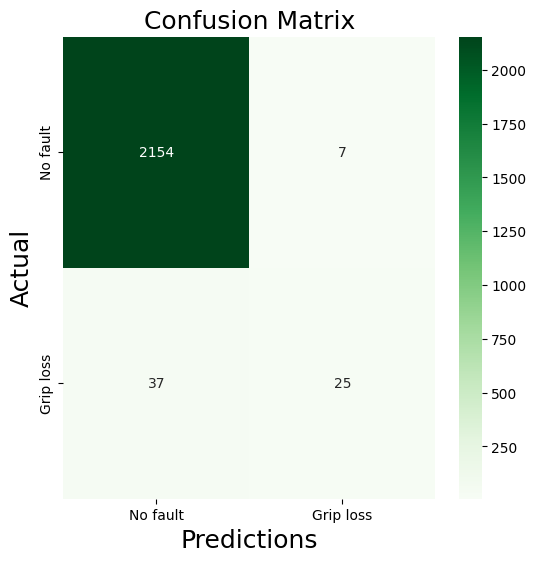

In [ ]:
# generate confusion matrix graphics for best performing AUC rf2

# Create labels
labels = ['No fault', 'Grip loss']

#confusion matrix
conf_mat = confusion_matrix(y_test,  y_test_pred_rfat2)
# Plot confusion matrix with custom labels
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(conf_mat, 
            annot=True, 
            fmt='d', 
            cmap='Greens',
            xticklabels=labels,
            yticklabels=labels)

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actual', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

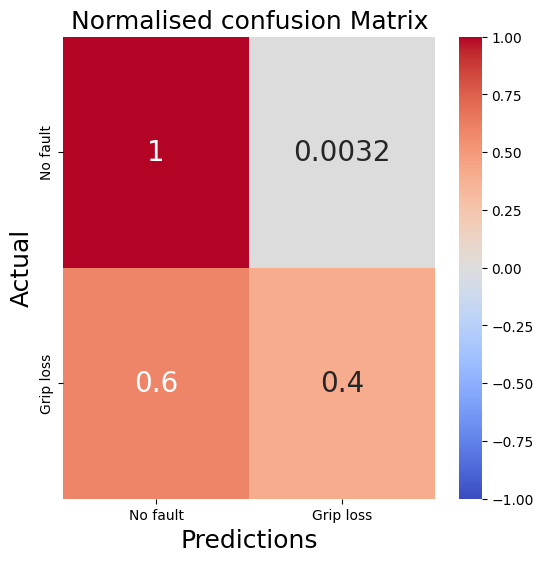

In [ ]:
# Create labels
labels = ['No fault', 'Grip loss']

#normalised confusion matrix
normed_c = conf_mat / np.sum(conf_mat, axis=1, keepdims=True)
# Plot confusion matrix with custom labels
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(normed_c, 
            annot=True,  
            cmap='coolwarm',
            xticklabels=labels,
            vmin=-1, vmax=1, center=0,
            yticklabels=labels,
            annot_kws = {'size':20})

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actual', fontsize=18)
plt.title('Normalised confusion Matrix', fontsize=18)
plt.show()

# Create labels
labels = ['Not Diabetic', 'Diabetic']


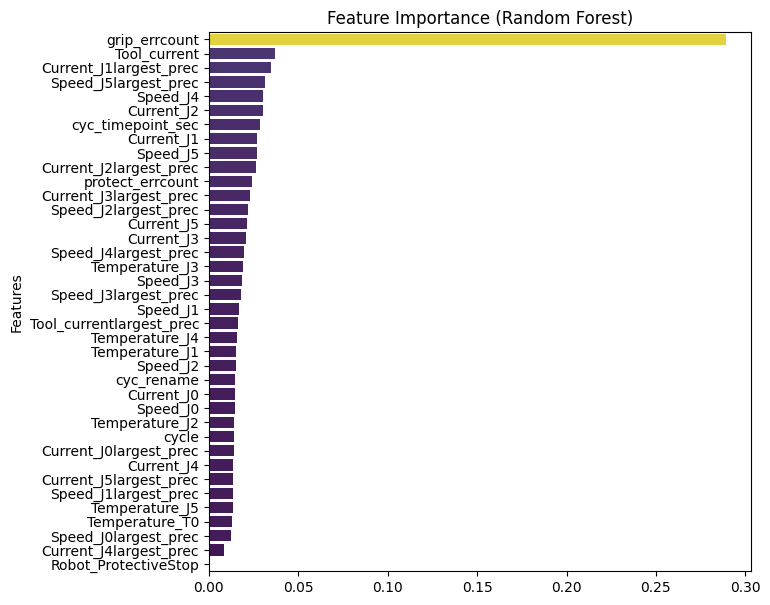

In [ ]:
# Feature importance - rf2 best AUC
importances = rf2.feature_importances_
features = X_train_colnames.columns
sorted_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(7,7))
sns.barplot(x=importances[sorted_idx], y=features[sorted_idx], hue=importances[sorted_idx], palette="viridis", legend=False)
plt.title("Feature Importance (Random Forest)")
plt.ylabel("Features")
plt.show()

- logical that how long since last error (grip_errcount) is most important feature. Some other lagged features in top 5 but all features except top 1 have similar low level contribution

# 3.3.4.2 KNN

In [ ]:
#ref: https://github.com/marios-tyrovolas/Information-Flow-Based-Fuzzy-Cognitive-Maps-with-Enhanced-Interpretability/blob/main/experimental_setup/ML/Training%20and%20Evaluating%20other%20ML%20models_AI4I_2020_Final_version.ipynb


knn = KNN()
knn.fit(X_train, y_train.values.ravel())

KNeighborsClassifier()

In [ ]:
#Predict the response for train dataset
y_train_pred_knn = knn.predict(X_train)

print("K-Nearest Neighbour score: ",knn.score(X_train, y_train))

K-Nearest Neighbour score:  0.98052448900887


<Axes: >

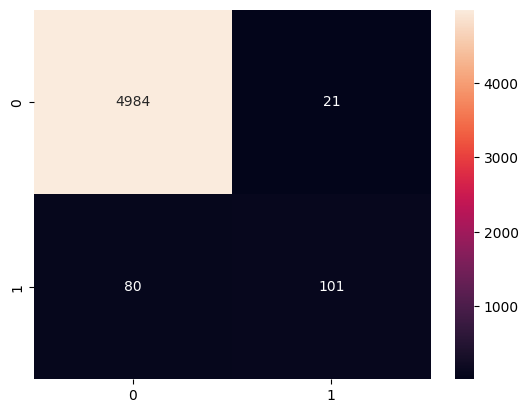

In [ ]:
confusion_matrix(y_train, y_train_pred_knn)
sns.heatmap(confusion_matrix(y_train, y_train_pred_knn), annot=True,fmt='d')

In [ ]:
#Performance measures for training dataset

print("Precision Score: ",precision_score(y_train,y_train_pred_knn))
print("Recall Score: ",recall_score(y_train, y_train_pred_knn))
print("F1 Score: ",f1_score(y_train, y_train_pred_knn))
print("Accuracy Score: ",accuracy_score(y_train, y_train_pred_knn))
auc_knn = metrics.roc_auc_score(y_train, y_train_pred_knn)
print("AUC Score: ",auc_knn)

Precision Score:  0.8278688524590164
Recall Score:  0.5580110497237569
F1 Score:  0.6666666666666666
Accuracy Score:  0.98052448900887
AUC Score:  0.7769076227639763


In [ ]:

#Predict the response for test dataset
y_test_pred_knn = knn.predict(X_test)


print("Precision Score: ",precision_score(y_test, y_test_pred_knn))
print("Recall Score: ",recall_score(y_test, y_test_pred_knn))
print("F1 Score: ",f1_score(y_test, y_test_pred_knn))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_knn))
from sklearn import metrics
#calculate AUC of model
auc_knn = metrics.roc_auc_score(y_test, y_test_pred_knn)
print("AUC Score: ",auc_knn)

Precision Score:  0.47619047619047616
Recall Score:  0.16129032258064516
F1 Score:  0.24096385542168675
Accuracy Score:  0.97165991902834
AUC Score:  0.5781000432893971


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_knn))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_knn)
print('AUC: %f' %auc)


 classifciation report:  
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      2161
           1       0.48      0.16      0.24        62

    accuracy                           0.97      2223
   macro avg       0.73      0.58      0.61      2223
weighted avg       0.96      0.97      0.96      2223

AUC: 0.578100


In [ ]:
#### Hyper-parameter Tuning for K-Nearest Neighbour (KNN)
#%%time

grid_params = { 'n_neighbors' : [5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

grid_search_knn = GridSearchCV(KNN(), grid_params, verbose = 1, cv=3, n_jobs = -1)

grid_search_knn.fit(X_train, y_train.values.ravel())

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [5, 7, 9, 11, 13, 15],
                         'weights': ['uniform', 'distance']},
             verbose=1)

In [ ]:
cvres = pd.DataFrame(grid_search_knn.cv_results_).sort_values(by=['rank_test_score'])
for mean_score, params,rank in zip(cvres["mean_test_score"], cvres["params"],cvres["rank_test_score"]):
    print("Rank {}# - Score: {} - {}".format(rank, np.sqrt(mean_score), params))

Rank 1# - Score: 0.9723342173873402 - {'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'uniform'}
Rank 2# - Score: 0.9720367592343562 - {'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}
Rank 3# - Score: 0.9716400067087265 - {'metric': 'euclidean', 'n_neighbors': 15, 'weights': 'uniform'}
Rank 3# - Score: 0.9716400067087265 - {'metric': 'minkowski', 'n_neighbors': 15, 'weights': 'uniform'}
Rank 5# - Score: 0.9714415696808463 - {'metric': 'euclidean', 'n_neighbors': 15, 'weights': 'distance'}
Rank 5# - Score: 0.9714415696808463 - {'metric': 'minkowski', 'n_neighbors': 15, 'weights': 'distance'}
Rank 7# - Score: 0.9708460152388447 - {'metric': 'minkowski', 'n_neighbors': 13, 'weights': 'distance'}
Rank 7# - Score: 0.9708460152388447 - {'metric': 'euclidean', 'n_neighbors': 13, 'weights': 'distance'}
Rank 9# - Score: 0.9707467206427582 - {'metric': 'euclidean', 'n_neighbors': 13, 'weights': 'uniform'}
Rank 9# - Score: 0.9707467206427582 - {'metric': 'minkowski', 'n_nei

In [ ]:
grid_search_knn.best_estimator_

KNeighborsClassifier(metric='manhattan', n_neighbors=15)

In [ ]:

#Predict the response for test dataset
y_test_pred_knn = grid_search_knn.best_estimator_.predict(X_test)


print("Precision Score: ",precision_score(y_test, y_test_pred_knn))
print("Recall Score: ",recall_score(y_test, y_test_pred_knn))
print("F1 Score: ",f1_score(y_test, y_test_pred_knn))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_knn))
from sklearn import metrics
#calculate AUC of model
auc_knn = metrics.roc_auc_score(y_test, y_test_pred_knn)
print("AUC Score: ",auc_knn)

Precision Score:  0.75
Recall Score:  0.0967741935483871
F1 Score:  0.17142857142857143
Accuracy Score:  0.9739091318038686
AUC Score:  0.5479243480467525


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_knn))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_knn)
print('AUC: %f' %auc)



 classifciation report:  
               precision    recall  f1-score   support

           0       0.97      1.00      0.99      2161
           1       0.75      0.10      0.17        62

    accuracy                           0.97      2223
   macro avg       0.86      0.55      0.58      2223
weighted avg       0.97      0.97      0.96      2223

AUC: 0.547924


In [ ]:
#make custom scorer
#roc_auc_scorer = make_scorer(roc_auc_score, greater_is_better=True, response_method= "predict") - no major diff, actually a bit worse
roc_auc_scorer = make_scorer(roc_auc_score, max_fpr=0.001, response_method= "predict")
#### Hyper-parameter Tuning for K-Nearest Neighbour (KNN)

grid_params = { 'n_neighbors' : [5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

grid_search_knn_auc = GridSearchCV(KNN(), grid_params, verbose = 1, cv=3, n_jobs = -1, scoring= roc_auc_scorer)

grid_search_knn_auc.fit(X_train, y_train.values.ravel())

Fitting 3 folds for each of 36 candidates, totalling 108 fits


GridSearchCV(cv=3, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [5, 7, 9, 11, 13, 15],
                         'weights': ['uniform', 'distance']},
             scoring=make_scorer(roc_auc_score, response_method='predict', max_fpr=0.001),
             verbose=1)

In [ ]:
cvres = pd.DataFrame(grid_search_knn_auc.cv_results_).sort_values(by=['rank_test_score'])
for mean_score, params,rank in zip(cvres["mean_test_score"], cvres["params"],cvres["rank_test_score"]):
    print("Rank {}# - Score: {} - {}".format(rank, np.sqrt(mean_score), params))

Rank 1# - Score: 0.7098037152863117 - {'metric': 'minkowski', 'n_neighbors': 7, 'weights': 'uniform'}
Rank 1# - Score: 0.7098037152863117 - {'metric': 'minkowski', 'n_neighbors': 7, 'weights': 'distance'}
Rank 1# - Score: 0.7098037152863117 - {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'distance'}
Rank 1# - Score: 0.7098037152863117 - {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'uniform'}
Rank 5# - Score: 0.709714489044784 - {'metric': 'minkowski', 'n_neighbors': 5, 'weights': 'uniform'}
Rank 5# - Score: 0.709714489044784 - {'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'uniform'}
Rank 7# - Score: 0.7096809900311335 - {'metric': 'minkowski', 'n_neighbors': 9, 'weights': 'uniform'}
Rank 7# - Score: 0.7096809900311335 - {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'uniform'}
Rank 9# - Score: 0.7096762461366474 - {'metric': 'minkowski', 'n_neighbors': 5, 'weights': 'distance'}
Rank 9# - Score: 0.7096762461366474 - {'metric': 'euclidean', 'n_neighbors': 5, '

In [ ]:
grid_search_knn_auc.best_estimator_

KNeighborsClassifier(n_neighbors=7)

In [ ]:

#Predict the response for test dataset
y_test_pred_knn_auc = grid_search_knn_auc.best_estimator_.predict(X_test)


print("Precision Score: ",precision_score(y_test, y_test_pred_knn_auc))
print("Recall Score: ",recall_score(y_test, y_test_pred_knn_auc))
print("F1 Score: ",f1_score(y_test, y_test_pred_knn_auc))
print("Accuracy Score: ",accuracy_score(y_test, y_test_pred_knn_auc))

#calculate AUC of model
auc_knn = metrics.roc_auc_score(y_test, y_test_pred_knn_auc)
print("AUC Score: ",auc_knn)

Precision Score:  0.4666666666666667
Recall Score:  0.11290322580645161
F1 Score:  0.18181818181818182
Accuracy Score:  0.97165991902834
AUC Score:  0.5546006179934618


In [ ]:
print("\n","classifciation report: ","\n",classification_report(y_test, y_test_pred_knn_auc))

# single score from ROC curve used to compare models
auc = roc_auc_score(y_test, y_test_pred_knn_auc)
print('AUC: %f' %auc)


 classifciation report:  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      2161
           1       0.47      0.11      0.18        62

    accuracy                           0.97      2223
   macro avg       0.72      0.55      0.58      2223
weighted avg       0.96      0.97      0.96      2223

AUC: 0.554601


- Best AUC for KNN was simple model with random state vs hyperparameter gridsearchCV outputs.
- Random forest classifier best AUC. 
- The tested ML models don't do well at predicting grip_loss correctly - would need a lot of optimisation and tuning to try to improve, likely requiring domain knowledge input

# 4 Conclusions and Recommendations
- Extensive exploratory data analysis lead to greater understanding of UR3 Cobot behaviour
    - This should help with process understanding, optimisation and planning
    - Generation of application to view summary data from UR3 Cobot logs to support this. Deployed on Docker
    - More knowledge from team about desired outcome of cycles, impacts of inconsistent cycle times and what other data it would be useful to explore/make available to them
- Machine learning considerations
    - Want to predict rest of days risk of errors/faults but need some information about what robot plans to do
        - Inconsistent cycle time which errors add to (hard to provide in advance for modelling)
    - Discuss with team if can correlate robot programmed actions to this data better
        - Potentially better predictability if can generate expected robot actions and relate it back to the data the UR3 cobot is generating
    - Dataset authors using Information Flow Based – Fuzzy Cognitive Maps (IF- FCMs) to help predict machine operations – may be better approach to investigate
        - modification of FCMs – visual modelling approach. Image shows FCM of government control of tobacco. Part of modelling is to adjust weightings of interactions

        <img src="https://github.com/Ddbol/DevAcProj_CobotOps/blob/main/FCM_example_12889_2023_17367_Fig2_HTML.png?raw=true" alt="drawing" width="700"/>

References IF-FCMs and FCMs
- Tyrovolas, M., Stylios, C., Aliev, K., Antonelli, D. (2024). Leveraging Information Flow-Based Fuzzy Cognitive Maps for Interpretable Fault Diagnosis in Industrial Robotics. In: Camarinha-Matos, L.M., Ferrada, F. (eds) Technological Innovation for Human-Centric Systems. DoCEIS 2024. IFIP Advances in Information and Communication Technology, vol 716. Springer, Cham. https://doi.org/10.1007/978-3-031-63851-0_6
- Tyrovolas, M., Liang, X.S. & Stylios, C. Information flow-based fuzzy cognitive maps with enhanced interpretability. Granul. Comput. 8, 2021–2038 (2023). https://doi.org/10.1007/s41066-023-00417-7 (Link to github marios-tyrovolas/Information-Flow-Based-Fuzzy-Cognitive-Maps-with-Enhanced-Interpretability: Information Flow-Based Fuzzy Cognitive Maps with Enhanced Interpretability)
- Mkhitaryan et al. BMC Public Health. (2023) How to use machine learning and fuzzy cognitive maps to test hypothetical scenarios in health behavior change interventions: a case study on fruit intake https://doi.org/10.1186/s12889-023-17367-z



